<a href="https://colab.research.google.com/github/Davi-Esmeraldo/TCC/blob/main/TCC_NLP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [9]:
# 1. Webscraping

import requests  # Realizar requisições HTTP e acessar páginas web
from bs4 import BeautifulSoup  # Extrair dados de HTML e XML de forma estruturada
import time  # Criar pausas entre as requisições, evitando sobrecarga no servidor
import re  # Trabalhar com expressões regulares e buscar padrões de texto

# Função para extrair o conteúdo de uma portaria
def extrair_conteudo(link):
    try:
        response = requests.get(link)
        if response.status_code == 200:
            soup = BeautifulSoup(response.content, 'html.parser')
            texto_completo = soup.get_text(separator='\n', strip=True)

            # Regex para delimitar e capturar o conteúdo da portaria
            padrao = (
                r"Poder Judiciário da União\s*(.*?)\s*ESTE TEXTO NÃO SUBSTITUI"
            )
            match = re.search(padrao, texto_completo, re.DOTALL | re.IGNORECASE)
            return match.group(1).strip() if match else "Conteúdo não encontrado."
        else:
            print(f"Erro ao acessar {link}: {response.status_code}")
            return "Erro ao acessar o conteúdo."
    except Exception as e:
        print(f"Erro ao acessar {link}: {e}")
        return "Erro ao acessar o conteúdo."

In [10]:
# 1. Webscraping

# Função para buscar e extrair links de uma página

def extrair_links(url):
    response = requests.get(url)
    if response.status_code == 200:
        soup = BeautifulSoup(response.content, 'html.parser')
        portarias = {}

        for link in soup.find_all('a', href=True):
            href = link.get('href')
            texto = link.get_text(strip=True)

            if 'portaria' in texto.lower() or 'pdf' in href.lower():
                numero = re.findall(r'\d+', texto)
                if numero:
                    numero_portaria = numero[0]
                    link_completo = (
                        href if href.startswith('http')
                        else f"https://www.tjdft.jus.br{href}"
                    )
                    conteudo = extrair_conteudo(link_completo)

                    # Extração da data
                    padrao_data = r'\d{2}/\d{2}/\d{4}'
                    match_data = re.search(padrao_data, texto)
                    data = match_data.group() if match_data else None

                    # Extração do resumo —  buscando o próximo <p>
                    resumo = None
                    proximo_p = link.find_next('p')
                    if proximo_p:
                        resumo = proximo_p.get_text(strip=True)

                    portarias[numero_portaria] = {
                        'data': data,
                        'conteudo': conteudo,
                        'resumo': resumo
                    }
        return portarias
    else:
        print(f"Erro ao acessar {url}: {response.status_code}")
        return {}


In [11]:
# 1. Webscraping

# Função principal que percorre as páginas até o limite definido
def scraping_paginacao(base_url, inicio=0, limite=1680, delay=0.25):
    todas_portarias = {}
    pagina_atual = inicio

    while pagina_atual <= limite:
        url_pag = f"{base_url}?b_start:int={pagina_atual}"
        print(f"Acessando: {url_pag}")
        todas_portarias.update(extrair_links(url_pag))
        time.sleep(delay)
        pagina_atual += 30  # Incrementa para a próxima página

    print("Scraping finalizado.")
    return todas_portarias

In [12]:
# 1. Webscraping

# URL base
base_url = "https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/portarias-gpr/2024"

# Executa o scraping e armazena todas as portarias até o limite definido
todas_portarias = scraping_paginacao(base_url, inicio=0, limite=1680, delay=0.25)

print(todas_portarias)

Acessando: https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/portarias-gpr/2024?b_start:int=0
Acessando: https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/portarias-gpr/2024?b_start:int=30
Acessando: https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/portarias-gpr/2024?b_start:int=60
Acessando: https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/portarias-gpr/2024?b_start:int=90
Acessando: https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/portarias-gpr/2024?b_start:int=120
Acessando: https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/portarias-gpr/2024?b_start:int=150
Acessando: https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/portarias-gpr/2024?b_start:int=180
Acessando: https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/portarias-gpr/2024?b_start:int=210
Acessando: https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/portarias-gpr/2024?b_start:int=240
Acessando: https://www.tjdft.jus.br/publicacoes/publicacoes-oficiais/

In [13]:
# 2. Pré Tratamento Dados

# Estruturar conteúdos das portarias
# Remover "Cabeçalho"

for numero, dados in todas_portarias.items():
    conteudo = dados['conteudo']
    indice = conteudo.find("2024\n")  # Ano de interesse (2024)

    if indice != -1:  # Se encontrado
        dados['conteudo'] = conteudo[indice + len("2024\n"):].strip()
    else:
        dados['conteudo'] = conteudo  # Caso não encontrado, o original é mantido

# Remove "\n"
todas_portarias = {
    num: {
        'data': dados['data'],
        'resumo': dados['resumo'],
        'conteudo': dados['conteudo'].replace("\n", " ")

    }
    for num, dados in todas_portarias.items()
}

# Converter chaves para inteiros
todas_portarias = {
    int(chave): valor for chave, valor in todas_portarias.items()
}

#  Correção pontual erros # Webscraping 27/04/2025
todas_portarias[188] = {
    'data': "24/01/2024",
    'resumo': "Designa servidores para FC.",
    'conteudo': "O PRESIDENTE DO TRIBUNAL DE JUSTIÇA DO DISTRITO FEDERAL E TERRITÓRIOS, no uso de sua competência legal e tendo em vista o contido no PA Nº 1002083/2024, RESOLVE: Art. 1º Designar MAISA GONÇALVES DE SOUZA, matrícula N. 317.062, Técnico Judiciário, Área Administrativa, do Quadro de Pessoal deste Tribunal, para exercer a Função Comissionada, FC-02, do Núcleo de Gestão de Riscos e Integridade. Art. 2º Designar JULIANA GONCALVES DE MESQUITA, matrícula N. 317.407, Técnico Judiciário, Área Administrativa, do Quadro de Pessoal deste Tribunal, para exercer a Função Comissionada, FC-02, do Núcleo de Gestão de Portfólio e Projetos. Art. 3º Designar LUDMILA PEREIRA DE SOUZA DO COUTO MACIEL, matrícula N. 316.122, Técnico Judiciário, Área Administrativa, do Quadro de Pessoal deste Tribunal, para exercer a Função Comissionada, FC-05, da Secretaria de Planejamento, Governança e Gestão Estratégica, ficando dispensada da Função Comissionada, FC-02, do Núcleo de Gestão de Riscos e Integridade. Art. 4º Designar VERONICA BRITO AGUIAR, matrícula N. 318.155, Técnico Judiciário, Área Administrativa, do Quadro de Pessoal deste Tribunal, para exercer a Função Comissionada, FC- 02, da Secretaria de Planejamento, Governança e Gestão Estratégica, ficando dispensada da Função Comissionada, FC-02, do Núcleo de Gestão de Portfólio e Projetos. Art. 5º Esta Portaria entra em vigor na data de sua publicação. Desembargador CRUZ MACEDO Presidente do TJDFT"
}

todas_portarias[1835] = {
    'data': "28/10/2024",
    'resumo': "Aposentadoria do servidor Dilzan Leite Sales.",
    'conteudo': "O PRESIDENTE DO TRIBUNAL DE JUSTIÇA DO DISTRITO FEDERAL E DOS TERRITÓRIOS, no uso de sua competência legal e tendo em vista o disposto no Processo SEI 0029768/2024 e a tutela de urgência concedida pelo juízo da 22ª Vara Federal Civil da Seção Judiciária do Distrito Federal, nos autos da Ação Civil Coletiva 1025260-81.2020.4.01.3400, RESOLVE: Conceder aposentadoria voluntária integral ao servidor Dilzan Leite Sales, matrícula 312.496, ocupante do cargo de Analista Judiciário, Área Judiciária, Oficial de Justiça Avaliador Federal, Classe 'C', Padrão 13, do Quadro de Pessoal deste Tribunal de Justiça, com fundamento no art. 3º da Emenda Constitucional 47/2005, com as vantagens previstas no art. 67 da Lei nº 8.112/1990 c/c o art. 6º da Lei nº 9.624/1998 e com o inciso II do art. 15 da Medida Provisória 2.225-45/2001, além das vantagens previstas na Lei 11.416/2006, com proventos calculados e reajustados na forma dos artigos 3º da Emenda Constitucional 47/2005 e 7º da Emenda Constitucional 41/2003. Desembargador WALDIR LEÔNCIO JÚNIOR Presidente"
}


todas_portarias[1836]['resumo'] = "Dispensa membro da Comissão de Jurisprudência e altera dispositivo da Portaria GPR 1732 de 24 de setembro de 2024."
todas_portarias[261]['resumo'] = "Designa Vanessa Alves Dantas para substituição de CJ."
todas_portarias[251]['resumo'] = "Dispensa e designa servidores de/para FC."
todas_portarias[1219]['resumo'] = "Designa Tiago Teodoro para FC."
todas_portarias[167]['resumo'] = "Designa Janayna Nogueira Lima para FC."
todas_portarias[1957]['resumo'] = "Abre ao Orçamento Fiscal, em favor da Justiça do Distrito Federal e dos Territórios, crédito suplementar, para reforço de dotações constantes da Lei Orçamentária vigente."
todas_portarias[1029]['resumo'] = "Dispensa e designa servidores de/para FC."
todas_portarias[1028]['resumo'] = "Designa Patricia Pessoa de Resende para FC."


# Ordenar de forma decrescente
todas_portarias = dict(sorted(todas_portarias.items(), key=lambda x: x[0], reverse=True))

# Exibir resultado atualizado
print(todas_portarias)


{1963: {'data': '30/12/2024', 'resumo': 'Exonera, a pedido, Claudia Cruz Cerquinho de Oliveira do cargo de juíza de paz 1ª suplente do 3º Ofício de Registro Civil, Títulos e Documentos e Pessoas Jurídicas do Paranoá.', 'conteudo': 'O PRESIDENTE DO TRIBUNAL DE JUSTIÇA DO DISTRITO FEDERAL E DOS TERRITÓRIOS, no uso de suas atribuições legais, nos termos do art. 262-A, § 3º, do Provimento-Geral da Corregedoria aplicado aos Serviços Notariais e de Registro , e em vista do contido no processo SEI 0039527/2024, RESOLVE: Art. 1º Exonerar, a pedido, Claudia Cruz Cerquinho de Oliveira do cargo de juíza de paz 1ª suplente do 3º Ofício de Registro Civil, Títulos e Documentos e Pessoas Jurídicas do Paranoá, a partir de 22 de dezembro de 2024. Art. 2º Declarar vago o cargo de juiz de paz 1º suplente do 3º Ofício de Registro Civil, Títulos e Documentos e Pessoas Jurídicas do Paranoá, a ser preenchido mediante remoção entre os juízes de paz suplentes em exercício no Distrito Federal Parágrafo único. O

In [14]:
# 2. Tratamento Dados
# Salvar Dados

todas_portarias_maio = todas_portarias

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive')

# Caminho para salvar dentro do Drive
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/todas_portarias_maio.json"

# Salvando os dados
with open(caminho_arquivo, "w", encoding="utf-8") as f:
    json.dump(todas_portarias_maio, f, ensure_ascii=False, indent=4)

print(f"Dados salvos em {caminho_arquivo}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados salvos em /content/drive/My Drive/UnB/EU/TCC/Davi/Dados/todas_portarias_maio.json


In [1]:
# 2. Tratamento Dados
# Carregar Dados

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive')

import os

caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/todas_portarias_maio.json"

# Verifica se o arquivo já existe no Drive
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        todas_portarias_maio = json.load(f)
    print("Dados carregados do Google Drive.")
else:
    print("Arquivo não encontrado. Execute o scraping.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados carregados do Google Drive.


In [15]:
# 2. Tratamento Dados
# 2.1 Tratamento NLP

import re
import unicodedata

# Remover Assinatura e Normalizar
def remover_assinatura(texto):
    # Normalizar
    texto_normalizado = unicodedata.normalize("NFKD", texto).encode("ASCII", "ignore").decode("utf-8")

    # Expressão regular para capturar as assinaturas e remover tudo que suceder
    padrao = re.compile(r"(desembargador\s*waldir\s*leoncio\s*junior\s*presidente|desembargador\s*cruz\s*macedo\s*presidente)[^\n]*", re.IGNORECASE)

    # Substituir ocorrências encontradas pelo padrão
    texto_limpo = re.sub(padrao, "", texto_normalizado).strip()

    return texto_limpo

# Criar um novo dicionário normalizado e com assinaturas removidas
todas_portarias_maio = {
    num: {
        'data': dados['data'],
        'resumo': remover_assinatura(dados['resumo']),
        'conteudo': remover_assinatura(dados['conteudo'])
    }
    for num, dados in todas_portarias_maio.items()
}

# Exibir resultado atualizado
print(todas_portarias_maio)


{1963: {'data': '30/12/2024', 'resumo': 'Exonera, a pedido, Claudia Cruz Cerquinho de Oliveira do cargo de juiza de paz 1a suplente do 3o Oficio de Registro Civil, Titulos e Documentos e Pessoas Juridicas do Paranoa.', 'conteudo': 'O PRESIDENTE DO TRIBUNAL DE JUSTICA DO DISTRITO FEDERAL E DOS TERRITORIOS, no uso de suas atribuicoes legais, nos termos do art. 262-A,  3o, do Provimento-Geral da Corregedoria aplicado aos Servicos Notariais e de Registro , e em vista do contido no processo SEI 0039527/2024, RESOLVE: Art. 1o Exonerar, a pedido, Claudia Cruz Cerquinho de Oliveira do cargo de juiza de paz 1a suplente do 3o Oficio de Registro Civil, Titulos e Documentos e Pessoas Juridicas do Paranoa, a partir de 22 de dezembro de 2024. Art. 2o Declarar vago o cargo de juiz de paz 1o suplente do 3o Oficio de Registro Civil, Titulos e Documentos e Pessoas Juridicas do Paranoa, a ser preenchido mediante remocao entre os juizes de paz suplentes em exercicio no Distrito Federal Paragrafo unico. Os

In [16]:
# 2. Tratamento Dados
# 2.1 Tratamento NLP

import nltk
nltk.download('stopwords')
nltk.download('punkt_tab')

import string
import re
import nltk
import unicodedata
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

# Stopwords em português
stop_words = set(stopwords.words('portuguese'))

# Lista de palavras e caracteres indesejados
palavras_remover = {"ª", "º", "°", "§§", "§º", "§", "art", "caput", "cc",
                    "deste", "desta", "desse", "dessa", "nª", "nº", "n°","n","fc"}

# Expressão regular para remover números e números romanos
regex_limpeza = re.compile(r'\d+|\b(?:i{1,3}|iv|v?i{0,3}|ix|x|xi|xii|xiii|xiv|xv|xvi|xvii|xviii|xix|xx)\b', re.IGNORECASE)


# Criar um novo dicionário para armazenar os dados processados
portarias_processadas = {}

for numero, dados in todas_portarias_maio.items():
    # Conteudo portarias
    conteudo = dados['conteudo'].lower()  # Converter para minúsculas
    conteudo = regex_limpeza.sub('', conteudo)  # Remover números e números romanos
    conteudo = conteudo.translate(str.maketrans('', '', string.punctuation))  # Remover pontuação

    # Tokenizar palavras, remover stop words e caracteres indesejados
    tokens = word_tokenize(conteudo)
    tokens_filtrados = [word for word in tokens if word not in stop_words and word not in palavras_remover]

    # Resumo portarias
    resumo = dados['resumo'].lower()  # Converter para minúsculas
    resumo = regex_limpeza.sub('', resumo)  # Remover números e números romanos
    resumo = resumo.translate(str.maketrans('', '', string.punctuation))  # Remover pontuação

    tokens_resumo = word_tokenize(resumo)
    tokens_filtrados_resumo = [word for word in tokens_resumo if word not in stop_words and word not in palavras_remover]

    # Criar novo dicionário mantendo a estrutura de tokens como lista
    portarias_processadas[numero] = {
        'data': dados['data'],
        'resumo': tokens_filtrados_resumo,
        'conteudo': tokens_filtrados  # Lista de tokens ao invés de string
    }

# Exibir resultado atualizado
print(portarias_processadas)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


{1963: {'data': '30/12/2024', 'resumo': ['exonera', 'pedido', 'claudia', 'cruz', 'cerquinho', 'oliveira', 'cargo', 'juiza', 'paz', 'suplente', 'oficio', 'registro', 'civil', 'titulos', 'documentos', 'pessoas', 'juridicas', 'paranoa'], 'conteudo': ['presidente', 'tribunal', 'justica', 'distrito', 'federal', 'territorios', 'uso', 'atribuicoes', 'legais', 'termos', 'provimentogeral', 'corregedoria', 'aplicado', 'servicos', 'notariais', 'registro', 'vista', 'contido', 'processo', 'sei', 'resolve', 'exonerar', 'pedido', 'claudia', 'cruz', 'cerquinho', 'oliveira', 'cargo', 'juiza', 'paz', 'suplente', 'oficio', 'registro', 'civil', 'titulos', 'documentos', 'pessoas', 'juridicas', 'paranoa', 'partir', 'dezembro', 'declarar', 'vago', 'cargo', 'juiz', 'paz', 'suplente', 'oficio', 'registro', 'civil', 'titulos', 'documentos', 'pessoas', 'juridicas', 'paranoa', 'preenchido', 'mediante', 'remocao', 'juizes', 'paz', 'suplentes', 'exercicio', 'distrito', 'federal', 'paragrafo', 'unico', 'interessados

In [17]:
# 2. Tratamento Dados
# 2.1 Tratamento NLP

# Salvar Dados

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive')

# Caminho para salvar dentro do Drive
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/portarias_processadas.json"

# Salvando os dados
with open(caminho_arquivo, "w", encoding="utf-8") as f:
    json.dump(portarias_processadas, f, ensure_ascii=False, indent=4)

print(f"Dados salvos em {caminho_arquivo}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados salvos em /content/drive/My Drive/UnB/EU/TCC/Davi/Dados/portarias_processadas.json


In [2]:
# 2. Tratamento Dados
# 2.1 Tratamento NLP

# Carregar Dados

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive')

import os

caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/portarias_processadas.json"

# Verifica se o arquivo já existe no Drive
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        portarias_processadas = json.load(f)
    print("Dados carregados do Google Drive.")
else:
    print("Arquivo não encontrado. Execute o scraping.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados carregados do Google Drive.


In [18]:
# 2. Tratamento Dados
# 2.1 Tratamento NLP

#  Remoção de tokens possivelmente não discriminativos que antecedem "RESOLVE:"

portarias_ultra_processadas = {}

for num, dados in portarias_processadas.items():
    conteudo = dados['conteudo']

    idx_resolve = None  # índice padrão

    if "resolve" in conteudo:
        idx_resolve = conteudo.index("resolve")
        novo_conteudo = conteudo[idx_resolve + 1:]  # tudo que vem depois de 'resolve'
    else:
        # procurar sequência "r" seguido de "esolve"
        encontrou = False
        for i in range(len(conteudo) - 1):
            if conteudo[i] == "r" and conteudo[i+1] == "esolve":
                idx_resolve = i
                encontrou = True
                break

        if encontrou:
            # Desconsiderar tanto "r" quanto "esolve"
            novo_conteudo = conteudo[idx_resolve + 2:]
        else:
            # Caso extremo: nem 'resolve' nem 'r'+'esolve' -> mantém o conteúdo original
            novo_conteudo = conteudo

    portarias_ultra_processadas[num] = {
        "data": dados["data"],
        "resumo": dados["resumo"],
        "conteudo": novo_conteudo
    }


In [19]:
# 2. Tratamento Dados
# 2.1 Tratamento NLP

# Salvar Dados

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive')

# Caminho para salvar dentro do Drive
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/portarias_ultra_processadas.json"

# Salvando os dados
with open(caminho_arquivo, "w", encoding="utf-8") as f:
    json.dump(portarias_ultra_processadas, f, ensure_ascii=False, indent=4)

print(f"Dados salvos em {caminho_arquivo}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados salvos em /content/drive/My Drive/UnB/EU/TCC/Davi/Dados/portarias_ultra_processadas.json


In [3]:
# 2. Tratamento Dados
# 2.1 Tratamento NLP

# Carregar Dados

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive')

import os

caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/portarias_ultra_processadas.json"

# Verifica se o arquivo já existe no Drive
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        portarias_ultra_processadas = json.load(f)
    print("Dados carregados do Google Drive.")
else:
    print("Arquivo não encontrado. Execute o scraping.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados carregados do Google Drive.


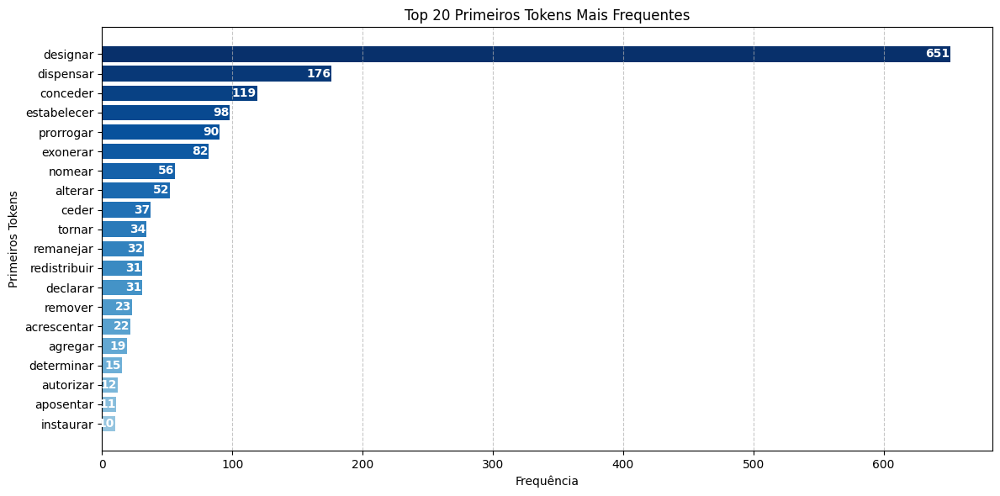

In [20]:
# 3. Exploratória

# Verbos que sucedem "RESOLVE:"
# 1° Token portarias_ultra_processadas

import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Contabilizar  primeiros tokens de cada portaria
primeiros_tokens = [dados['conteudo'][0] for dados in portarias_ultra_processadas.values() if dados['conteudo']]
contador_tokens = Counter(primeiros_tokens)

# Selecionar os tokens mais frequentes
top_n = 20
tokens_top, frequencias_top = zip(*contador_tokens.most_common(top_n))

# Criar gráfico de barras com gradiente de cores
plt.figure(figsize=(12, 6))
colors = plt.cm.Blues(np.linspace(0.4, 1, len(tokens_top)))  # Gradiente de azul

# Inverter ordem para visualização decrescente
tokens_plot = tokens_top[::-1]
frequencias_plot = frequencias_top[::-1]

bars = plt.barh(tokens_plot, frequencias_plot, color=colors)

# Adicionar os valores nas barras
for bar, freq in zip(bars, frequencias_plot):
    plt.text(freq - 0.5,                        # posição x (um pouco antes do fim da barra)
             bar.get_y() + bar.get_height()/2,  # posição y central da barra
             str(freq),
             va='center',
             ha='right',
             color='white',
             fontweight='bold')

plt.xlabel("Frequência")
plt.ylabel("Primeiros Tokens")
plt.title(f"Top {top_n} Primeiros Tokens Mais Frequentes")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


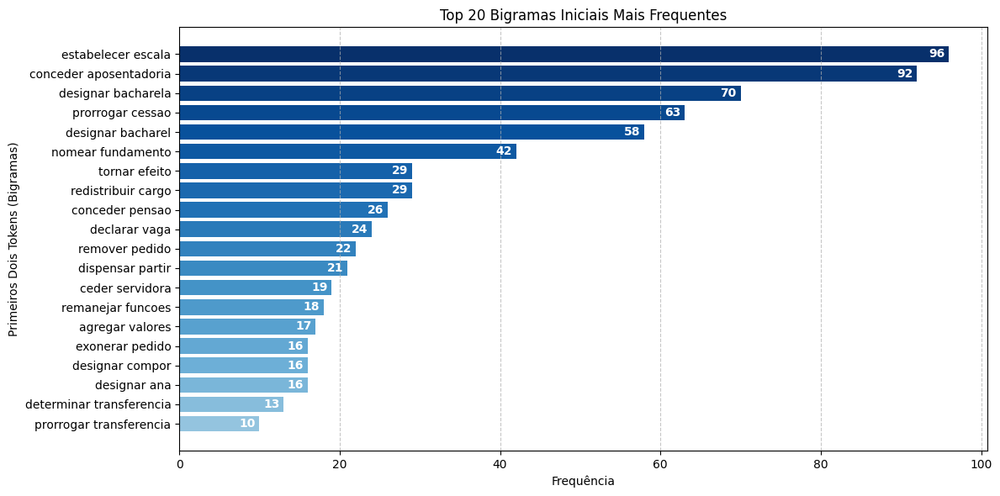

In [21]:
# 3. Exploratória

# Bigrama que sucedem "RESOLVE:"
# 1° e 2° Tokens portarias_ultra_processadas

import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Contar o conjunto dos dois primeiros tokens de cada portaria
primeiros_bigramas = [
    (dados['conteudo'][0], dados['conteudo'][1])
    for dados in portarias_ultra_processadas.values()
    if len(dados['conteudo']) >= 2
]

# Transformar o par de tokens em uma string única para visualizar melhor
primeiros_bigramas_str = [' '.join(bigrama) for bigrama in primeiros_bigramas]

# Contar frequência dos bigramas
contador_bigramas = Counter(primeiros_bigramas_str)

# Selecionar os mais frequentes
top_n = 20  # você pode ajustar
bigrams_top, frequencias_top = zip(*contador_bigramas.most_common(top_n))

# Criar gráfico de barras com gradiente de cores
plt.figure(figsize=(12, 6))
colors = plt.cm.Blues(np.linspace(0.4, 1, len(bigrams_top)))  # Gradiente de Azul

# Inverter ordem para visualização decrescente
bigrams_plot = bigrams_top[::-1]
frequencias_plot = frequencias_top[::-1]

bars = plt.barh(bigrams_plot, frequencias_plot, color=colors)

# Adicionar os valores nas barras
for bar, freq in zip(bars, frequencias_plot):
    plt.text(freq - 0.5,                        # posição x
             bar.get_y() + bar.get_height()/2,  # posição y central da barra
             str(freq),
             va='center',
             ha='right',
             color='white',
             fontweight='bold')

plt.xlabel("Frequência")
plt.ylabel("Primeiros Dois Tokens (Bigramas)")
plt.title(f"Top {top_n} Bigramas Iniciais Mais Frequentes")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


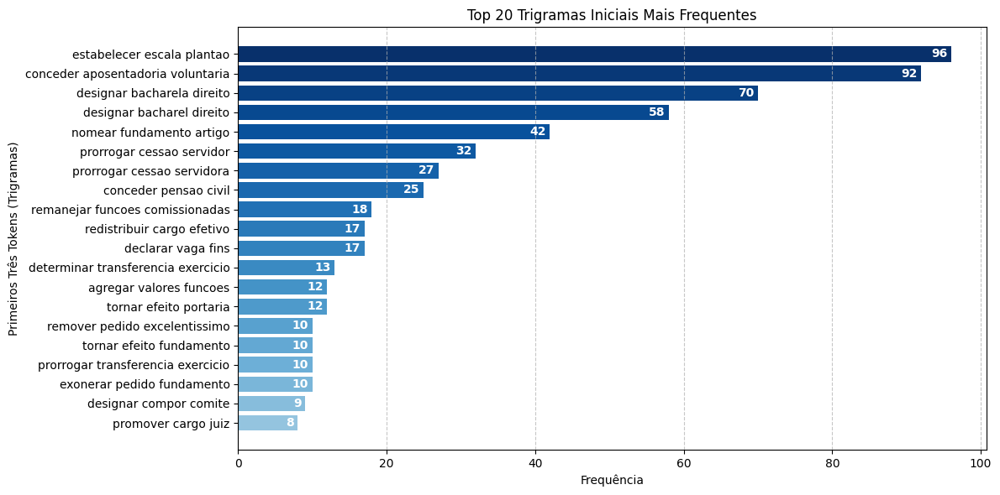

In [22]:
# 3. Exploratória

# Trigrama que sucedem "RESOLVE:"
# 1°, 2° e 3° Tokens portarias_ultra_processadas

import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Contar o conjunto dos três primeiros tokens de cada portaria
primeiros_trigramas = [
    (dados['conteudo'][0], dados['conteudo'][1], dados['conteudo'][2])
    for dados in portarias_ultra_processadas.values()
    if len(dados['conteudo']) >= 3
]

# Transformar o trio de tokens em uma string única para visualização
primeiros_trigramas_str = [' '.join(trigrama) for trigrama in primeiros_trigramas]

# Contar frequência dos trigramas
contador_trigramas = Counter(primeiros_trigramas_str)

# Selecionar os mais frequentes
top_n = 20  # você pode ajustar
trigramas_top, frequencias_top = zip(*contador_trigramas.most_common(top_n))

# Criar gráfico de barras com gradiente de cores
plt.figure(figsize=(12, 6))
colors = plt.cm.Blues(np.linspace(0.4, 1, len(trigramas_top)))  # Gradiente de Azul

# Inverter ordem para visualização decrescente
trigramas_plot = trigramas_top[::-1]
frequencias_plot = frequencias_top[::-1]

bars = plt.barh(trigramas_plot, frequencias_plot, color=colors)

# Adicionar os valores nas barras
for bar, freq in zip(bars, frequencias_plot):
    plt.text(freq - 0.5,
             bar.get_y() + bar.get_height()/2,
             str(freq),
             va='center',
             ha='right',
             color='white',
             fontweight='bold')

plt.xlabel("Frequência")
plt.ylabel("Primeiros Três Tokens (Trigramas)")
plt.title(f"Top {top_n} Trigramas Iniciais Mais Frequentes")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


In [23]:
# 3. Exploratória
# Total de portarias existentes e esperadas

# Gerar lista completa de portarias esperadas
portarias_esperadas = set(range(1, 1964))  # De 1 a 1963

# Obter portarias presentes no dicionário
portarias_presentes = set(portarias_processadas.keys())

# Identificar portarias ausentes
portarias_faltando = sorted(portarias_esperadas - portarias_presentes)

# Exibir resultado
print(f"Total de portarias esperadas: {len(portarias_esperadas)}")
print(f"Total de portarias presentes: {len(portarias_presentes)}")
print(f"Total de portarias ausentes: {len(portarias_faltando)}")
print("Portarias ausentes:", portarias_faltando)

# Obs: De fato essas portarias não existem no Site do TJDFT


Total de portarias esperadas: 1963
Total de portarias presentes: 1707
Total de portarias ausentes: 256
Portarias ausentes: [20, 31, 34, 35, 36, 38, 40, 42, 47, 49, 62, 83, 85, 87, 108, 161, 162, 165, 166, 176, 193, 203, 213, 254, 272, 277, 278, 288, 289, 290, 293, 322, 340, 346, 364, 373, 397, 402, 431, 433, 454, 459, 463, 472, 505, 544, 590, 592, 609, 690, 740, 759, 760, 762, 776, 778, 799, 824, 827, 845, 858, 868, 869, 870, 874, 885, 886, 887, 888, 889, 890, 891, 892, 894, 895, 928, 933, 945, 954, 959, 961, 964, 965, 969, 981, 982, 989, 996, 1003, 1015, 1024, 1025, 1031, 1037, 1038, 1050, 1051, 1059, 1104, 1107, 1111, 1119, 1133, 1134, 1136, 1148, 1159, 1161, 1169, 1172, 1173, 1175, 1176, 1183, 1199, 1201, 1210, 1211, 1216, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1278, 1279, 1280, 1281, 1282, 1283, 1285, 1286, 1287, 1288, 1290, 1291, 1292, 1293, 1294, 1295, 1297, 1301, 1312, 1313, 1318, 1319, 1335, 1336, 1337, 1338, 1339, 1340, 

<ipython-input-24-1bc7589953e1>:17: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['data'] = pd.to_datetime(df['data'], errors='coerce')


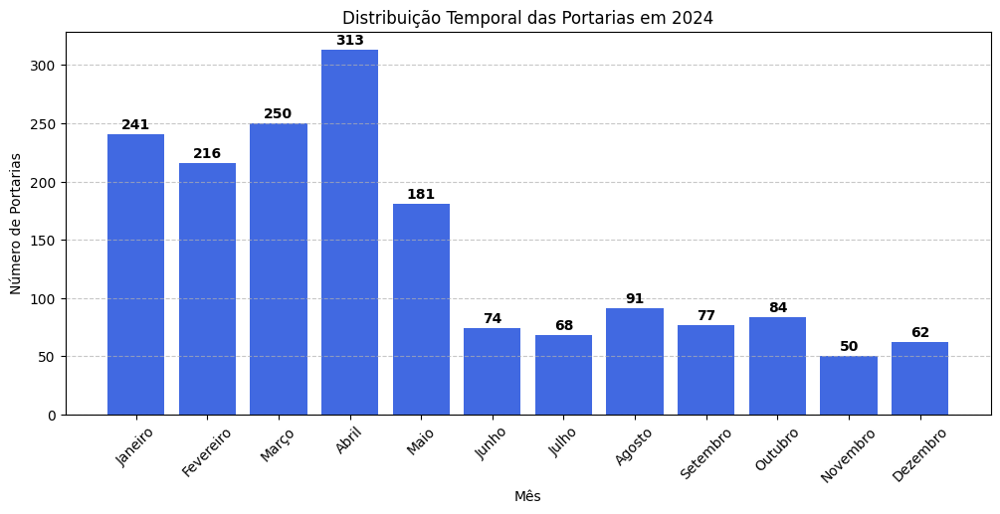

In [24]:
# 3. Exploratória
# Portarias por mês

import pandas as pd
import matplotlib.pyplot as plt

# Dicionário de meses em português
meses_em_portugues = {
    1: 'Janeiro', 2: 'Fevereiro', 3: 'Março', 4: 'Abril', 5: 'Maio', 6: 'Junho',
    7: 'Julho', 8: 'Agosto', 9: 'Setembro', 10: 'Outubro', 11: 'Novembro', 12: 'Dezembro'
}

# Criar DataFrame
df = pd.DataFrame.from_dict(portarias_processadas, orient='index')

# Converter datas para formato datetime
df['data'] = pd.to_datetime(df['data'], errors='coerce')

# Remover portarias sem data
df = df.dropna(subset=['data'])

# Obter contagem de portarias por mês
contagem_mensal = df['data'].dt.to_period('M').value_counts().sort_index()

# Converter para formato mês com o mapeamento para português
contagem_mensal.index = contagem_mensal.index.month.map(meses_em_portugues)

# Criar gráfico de barras
plt.figure(figsize=(12, 5))
barras = plt.bar(contagem_mensal.index, contagem_mensal.values, color='royalblue')

# Adicionar rótulos no topo das barras
for barra in barras:
    plt.text(barra.get_x() + barra.get_width()/2,
             barra.get_height() + 2,  # Ajuste da posição do texto
             str(barra.get_height()),
             ha='center', va='bottom', fontsize=10, fontweight='bold')

# Ajustes do gráfico
plt.xlabel("Mês")
plt.ylabel("Número de Portarias")
plt.title("Distribuição Temporal das Portarias em 2024")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Adiciona linhas de grade horizontais para melhor visualização

# Exibir gráfico
plt.show()


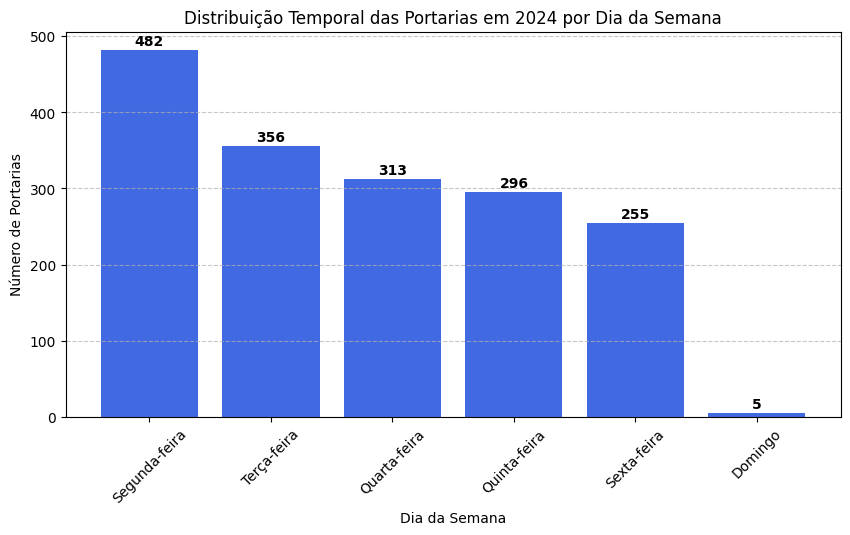

In [25]:
# 3. Exploratória
# Portarias por dia da semana

# Dicionário de dias da semana em português
dias_semana_portugues = {
    0: 'Segunda-feira', 1: 'Terça-feira', 2: 'Quarta-feira',
    3: 'Quinta-feira', 4: 'Sexta-feira', 5: 'Sábado', 6: 'Domingo'
}

contagem_dia_semana = df['data'].dt.dayofweek.value_counts().sort_index()
contagem_dia_semana.index = contagem_dia_semana.index.map(dias_semana_portugues)

plt.figure(figsize=(10, 5))
barras = plt.bar(contagem_dia_semana.index, contagem_dia_semana.values, color='royalblue')

# Adicionar rótulos no topo das barras
for barra in barras:
    plt.text(barra.get_x() + barra.get_width()/2,
             barra.get_height() + 2,
             str(barra.get_height()),
             ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.xlabel("Dia da Semana")
plt.ylabel("Número de Portarias")
plt.title("Distribuição Temporal das Portarias em 2024 por Dia da Semana")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [26]:
# 3. Exploratória
# Portarias no Domingo

# Filtrar portarias publicadas no domingo (dia 6 no Pandas)
portarias_domingo = df[df['data'].dt.dayofweek == 6]

# Exibir os números das portarias e as datas publicadas no domingo
print("Portarias publicadas no domingo:")

for numero_portaria, row in portarias_domingo.iterrows():
    print(f"Portaria {numero_portaria} - Data: {row['data'].strftime('%d/%m/%Y')}")

# Validado

Portarias publicadas no domingo:
Portaria 1955 - Data: 22/12/2024
Portaria 1896 - Data: 29/12/2024
Portaria 1724 - Data: 23/06/2024
Portaria 1723 - Data: 23/06/2024
Portaria 1686 - Data: 08/09/2024



Palavras mais frequentes nas portarias:
tribunal: 5491
matricula: 3788
pessoal: 3109
judiciario: 3048
quadro: 3011
area: 2964
portaria: 2819
federal: 2789
justica: 2638
distrito: 2505
funcao: 2298
comissionada: 2250
territorios: 2172
administrativa: 2019
tecnico: 2010
presidente: 1861
resolve: 1706
uso: 1667
publicacao: 1600
judiciaria: 1583


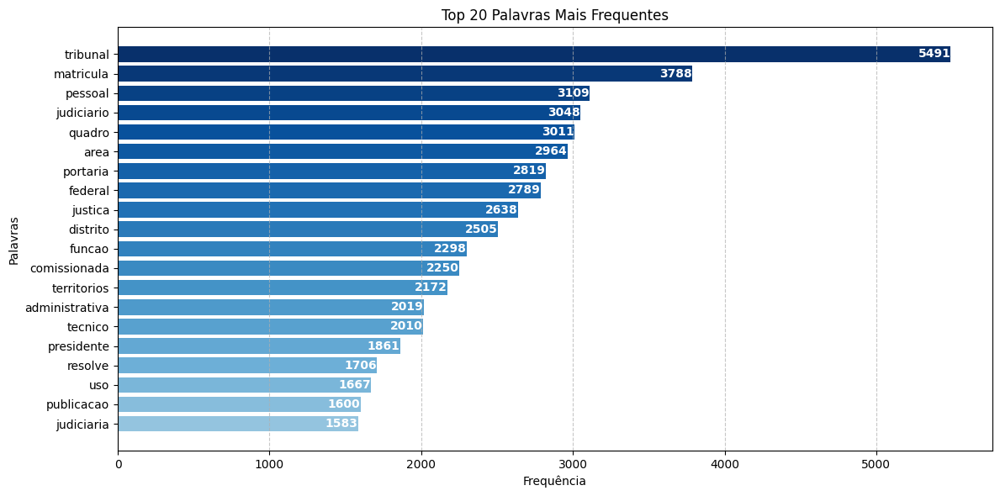

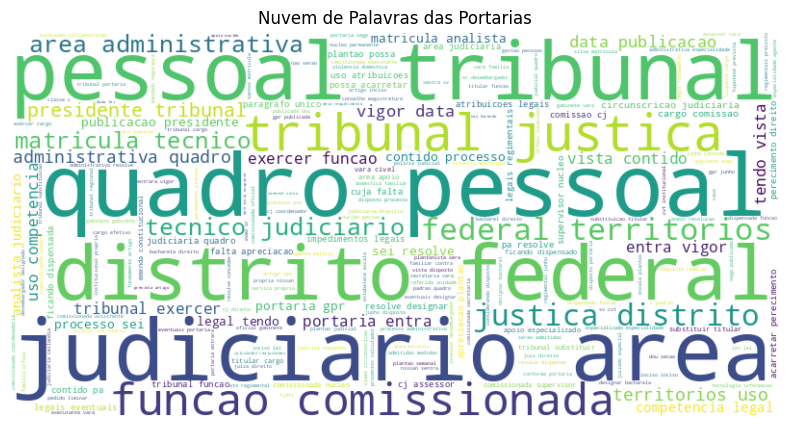

In [27]:
# 3. Exploratória
# Palavras mais frenquentes

import matplotlib.pyplot as plt
from collections import Counter
from wordcloud import WordCloud
import numpy as np


# Extrair listas de tokens das portarias
textos = [item['conteudo'] for item in portarias_processadas.values() if 'conteudo' in item]

# Unir todas as listas de tokens em uma única lista
palavras = [palavra for lista in textos for palavra in lista]  # Flatten da lista

# Contar palavras mais comuns
frequencia_palavras = Counter(palavras).most_common(20)

# Exibir palavras mais frequentes no console
print("\nPalavras mais frequentes nas portarias:")
for palavra, freq in frequencia_palavras:
    print(f"{palavra}: {freq}")

# Separar palavras e frequências para visualização
palavras_top, frequencias_top = zip(*frequencia_palavras)

# Criar gráfico de barras com gradiente de cores
plt.figure(figsize=(12, 6))
colors = plt.cm.Blues(np.linspace(0.4, 1, len(palavras_top)))  # Gradiente de azul

# Inverter a ordem para exibição decrescente
palavras_plot = palavras_top[::-1]
frequencias_plot = frequencias_top[::-1]

bars = plt.barh(palavras_plot, frequencias_plot, color=colors)

# Adicionar os valores nas barras
for bar, freq in zip(bars, frequencias_plot):
    plt.text(freq - 0.5,                   # posição x (um pouco antes do fim da barra)
             bar.get_y() + bar.get_height()/2,  # posição y central da barra
             str(freq),
             va='center',
             ha='right',                  # alinhamento à direita
             color='white',
             fontweight='bold')

plt.xlabel("Frequência")
plt.ylabel("Palavras")
plt.title("Top 20 Palavras Mais Frequentes")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Gerar nuvem de palavras
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(palavras))

# Exibir nuvem de palavras
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Nuvem de Palavras das Portarias")
plt.show()



Bigramas mais frequentes nas portarias:
('quadro', 'pessoal'): 2917
('judiciario', 'area'): 2888
('pessoal', 'tribunal'): 2833
('distrito', 'federal'): 2501
('tribunal', 'justica'): 2355
('funcao', 'comissionada'): 2250
('federal', 'territorios'): 2170
('justica', 'distrito'): 2138
('tecnico', 'judiciario'): 1980
('area', 'administrativa'): 1955
('matricula', 'tecnico'): 1835
('presidente', 'tribunal'): 1687
('administrativa', 'quadro'): 1666
('territorios', 'uso'): 1642
('data', 'publicacao'): 1415
('vigor', 'data'): 1402
('portaria', 'entra'): 1298
('entra', 'vigor'): 1298
('tribunal', 'exercer'): 1276
('vista', 'contido'): 1263


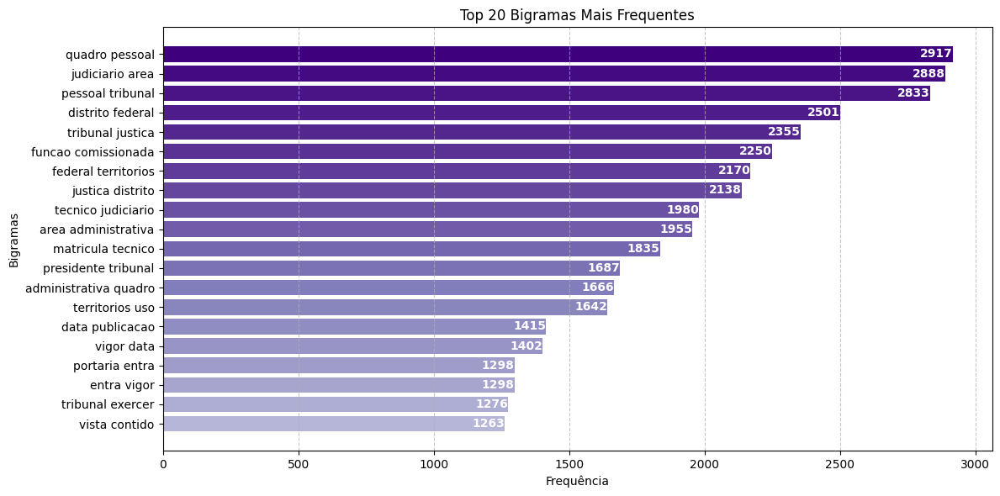

In [28]:
# 3. Exploratória
# Bigramas mais frenquentes

import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
from nltk.util import bigrams

# Extrair listas de tokens das portarias
textos = [item['conteudo'] for item in portarias_processadas.values() if 'conteudo' in item]

# Criar bigramas para todo o texto
bigramas = [bg for lista in textos for bg in bigrams(lista)]  # Gerar bigramas de cada lista de tokens

# Contar bigramas mais comuns
frequencia_bigramas = Counter(bigramas).most_common(20)

# Exibir bigramas mais frequentes no console
print("\nBigramas mais frequentes nas portarias:")
for bigrama, freq in frequencia_bigramas:
    print(f"{bigrama}: {freq}")

# Separar bigramas e frequências para visualização
bigramas_top, frequencias_top = zip(*frequencia_bigramas)
bigramas_top_formatados = [" ".join(bg) for bg in bigramas_top]  # Transformar tuplas em strings legíveis

# Criar gráfico de barras com gradiente de cores
plt.figure(figsize=(12, 6))
colors = plt.cm.Purples(np.linspace(0.4, 1, len(bigramas_top)))  # Gradiente de roxo

# Inverter ordem para visualização decrescente
bigramas_plot = bigramas_top_formatados[::-1]
frequencias_plot = frequencias_top[::-1]

bars = plt.barh(bigramas_plot, frequencias_plot, color=colors)

# Adicionar os valores nas barras
for bar, freq in zip(bars, frequencias_plot):
    plt.text(freq - 0.5,                        # posição x (um pouco antes do fim da barra)
             bar.get_y() + bar.get_height()/2,  # posição y central da barra
             str(freq),
             va='center',
             ha='right',
             color='white',
             fontweight='bold')

plt.xlabel("Frequência")
plt.ylabel("Bigramas")
plt.title("Top 20 Bigramas Mais Frequentes")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()



Trigramas mais frequentes nas portarias:
('quadro', 'pessoal', 'tribunal'): 2831
('distrito', 'federal', 'territorios'): 2170
('justica', 'distrito', 'federal'): 2138
('tribunal', 'justica', 'distrito'): 2064
('tecnico', 'judiciario', 'area'): 1942
('judiciario', 'area', 'administrativa'): 1941
('matricula', 'tecnico', 'judiciario'): 1834
('presidente', 'tribunal', 'justica'): 1680
('administrativa', 'quadro', 'pessoal'): 1666
('area', 'administrativa', 'quadro'): 1665
('federal', 'territorios', 'uso'): 1642
('vigor', 'data', 'publicacao'): 1398
('portaria', 'entra', 'vigor'): 1298
('entra', 'vigor', 'data'): 1296
('pessoal', 'tribunal', 'exercer'): 1276
('territorios', 'uso', 'competencia'): 1116
('exercer', 'funcao', 'comissionada'): 1098
('uso', 'competencia', 'legal'): 1090
('tribunal', 'exercer', 'funcao'): 1086
('tendo', 'vista', 'contido'): 1020


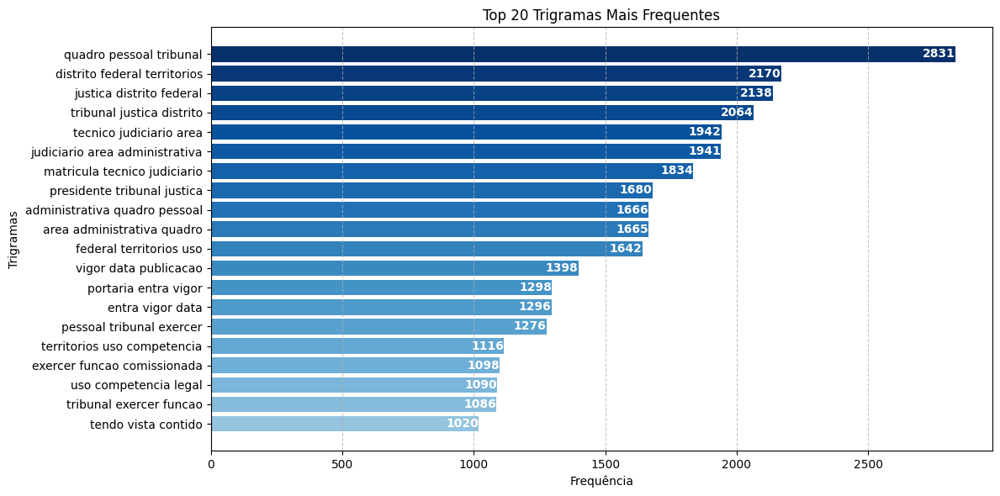

In [29]:
# 3. Exploratória
# Trigramas mais frenquentes

import matplotlib.pyplot as plt
from collections import Counter
import numpy as np
from nltk.util import ngrams

# Extrair listas de tokens das portarias
textos = [item['conteudo'] for item in portarias_processadas.values() if 'conteudo' in item]

# Criar trigramas para todo o texto
trigramas = [tg for lista in textos for tg in ngrams(lista, 3)]  # Gerar trigramas de cada lista de tokens

# Contar trigramas mais comuns
frequencia_trigramas = Counter(trigramas).most_common(20)

# Exibir trigramas mais frequentes no console
print("\nTrigramas mais frequentes nas portarias:")
for trigrama, freq in frequencia_trigramas:
    print(f"{trigrama}: {freq}")

# Separar trigramas e frequências para visualização
trigramas_top, frequencias_top = zip(*frequencia_trigramas)
trigramas_top_formatados = [" ".join(tg) for tg in trigramas_top]  # Transformar tuplas em strings legíveis

# Criar gráfico de barras com gradiente de cores
plt.figure(figsize=(12, 6))
colors = plt.cm.Blues(np.linspace(0.4, 1, len(trigramas_top)))  # Gradiente de azul

# Inverter ordem para visualização decrescente
trigramas_plot = trigramas_top_formatados[::-1]
frequencias_plot = frequencias_top[::-1]

bars = plt.barh(trigramas_plot, frequencias_plot, color=colors)

# Adicionar os valores nas barras
for bar, freq in zip(bars, frequencias_plot):
    plt.text(freq - 0.5,                        # posição x (um pouco antes do fim da barra)
             bar.get_y() + bar.get_height()/2,  # posição y central da barra
             str(freq),
             va='center',
             ha='right',
             color='white',
             fontweight='bold')

plt.xlabel("Frequência")
plt.ylabel("Trigramas")
plt.title("Top 20 Trigramas Mais Frequentes")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


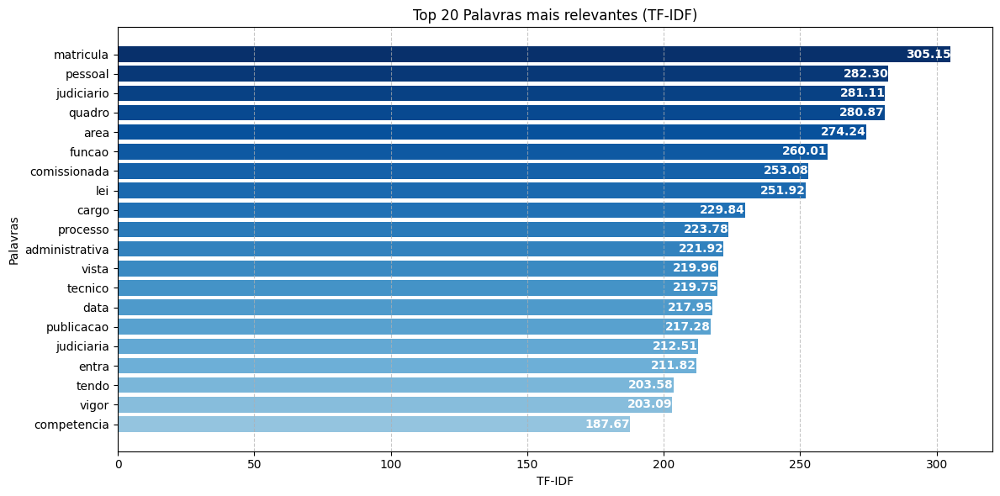

In [30]:
# 4. Representação Numérica dos Textos
# 4.1 TF-IDF (Term Frequency - Inverse Document Frequency)

# Objetivo: Remover palavras que podem ser inseridas no processo de limpeza

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer

# Extrair textos limpos das portarias, certificando-se de que cada 'conteudo' é uma string
textos = [str(item['conteudo']) for item in portarias_processadas.values() if 'conteudo' in item]

# Inicializar o modelo TF-IDF
tfidf_vectorizer = TfidfVectorizer(max_features=25, max_df=0.85, min_df=3) # Ajustar

# Ajustar o modelo aos textos
tfidf_matrix = tfidf_vectorizer.fit_transform(textos)

# Obter as palavras e seus respectivos TF-IDF
palavras = tfidf_vectorizer.get_feature_names_out()
valores_tfidf = np.asarray(tfidf_matrix.sum(axis=0)).flatten()

# Criar DataFrame para visualização
df_tfidf = pd.DataFrame(list(zip(palavras, valores_tfidf)), columns=['Palavra', 'TF-IDF'])
df_tfidf = df_tfidf.sort_values(by='TF-IDF', ascending=False)

# Exibir gráfico de barras com as top 20 palavras com maior TF-IDF
plt.figure(figsize=(12, 6))

# Selecionar dados para o gráfico
palavras_plot = df_tfidf['Palavra'][:20]
valores_plot = df_tfidf['TF-IDF'][:20]

# Gradiente de azul
colors = plt.cm.Blues(np.linspace(0.4, 1, len(valores_plot)))

# Criar barras
bars = plt.barh(palavras_plot, valores_plot, color=colors[::-1])  # Inverter para colocar maiores no topo

# Adicionar valores dentro das barras
for bar, valor in zip(bars, valores_plot):
    plt.text(valor - 0.01,                         # posição x
             bar.get_y() + bar.get_height() / 2,   # posição y
             f"{valor:.2f}",                       # valor com 2 casas decimais
             va='center',
             ha='right',
             color='white',
             fontweight='bold')

plt.xlabel('TF-IDF')
plt.ylabel('Palavras')
plt.title('Top 20 Palavras mais relevantes (TF-IDF)')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.gca().invert_yaxis()  # Maiores no topo
plt.show()


In [31]:
# 4. Representação Numérica dos Textos
# 4.1 TF-IDF (Term Frequency - Inverse Document Frequency)

# Objetivo: Remover palavras que podem ser inseridas no processo de limpeza

# Definir um limiar inferior para identificar palavras com baixo TF-IDF
limiar_baixo = df_tfidf['TF-IDF'].quantile(0.25)  # Quartil inferior (25%)

# Selecionar palavras abaixo do limiar
stopwords_candidatas = df_tfidf[df_tfidf['TF-IDF'] <= limiar_baixo]['Palavra'].tolist()

# Exibir a lista
print("\nCandidatas a stopwords personalizadas (baixa relevância TF-IDF):")
print(stopwords_candidatas)

# Não aplicar remoção


Candidatas a stopwords personalizadas (baixa relevância TF-IDF):
['vigor', 'competencia', 'designar', 'direito', 'exercer', 'nucleo', 'plantao']


In [36]:
!pip uninstall numpy gensim -y
!pip install numpy gensim

Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: gensim 4.3.3
Uninstalling gensim-4.3.3:
  Successfully uninstalled gensim-4.3.3
  Using cached numpy-2.2.6-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
  Using cached gensim-4.3.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (8.1 kB)
  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached gensim-4.3.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (26.7 MB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.13.1 which is incom

In [38]:
!pip install --upgrade --force-reinstall numpy gensim

  Using cached numpy-2.2.6-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
  Using cached gensim-4.3.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (8.1 kB)
  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
  Using cached scipy-1.13.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached smart_open-7.1.0-py3-none-any.whl.metadata (24 kB)
  Using cached wrapt-1.17.2-cp311-cp311-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.4 kB)
Using cached gensim-4.3.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (26.7 MB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
Using cached scipy-1.13.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (38.6 MB)
Using cached smart_open-7.1.0-py3-none-any.whl (61 kB)
Using cached wrapt-1.17.2-cp311-cp

In [4]:
# 4. Representação Numérica dos Textos
# 4.2.1 Doc2Vec

import gensim
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import numpy as np

# Função para garantir que o conteúdo esteja em uma lista de palavras
def processar_conteudo(conteudo):
    if isinstance(conteudo, str):  # Se for uma string, dividir em palavras
        return conteudo.split()
    return conteudo  # Se já for uma lista, retornar como está

# Preparar os documentos no formato exigido (TaggedDocument)
documentos_tagged = [
    TaggedDocument(words=processar_conteudo(conteudo["conteudo"]), tags=[str(num)])
    for num, conteudo in portarias_processadas.items()
]

# Treinar o modelo Doc2Vec
modelo_doc2vec = Doc2Vec(
    documents=documentos_tagged,
    vector_size=100,   # tamanho do vetor
    window=5,          # tamanho da janela de contexto
    min_count=2,       # ignora palavras com baixa frequência
    workers=4,
    epochs=40,
    dm=1               # 1  Distributed Memory (melhor para semântica), 0  DBOW (mais rápido)
)

# Obter os vetores de cada portaria
vetores_doc2vec = {
    num: modelo_doc2vec.dv[str(num)]
    for num in portarias_processadas.keys()
}

print(f"Doc2Vec aplicado")


Doc2Vec aplicado


In [5]:
# 4. Representação Numérica dos Textos
# 4.2.1 Doc2Vec

# Salvar Dados

from google.colab import drive
import json

# Google Drive
drive.mount('/content/drive', force_remount=False)

# Caminho para salvar dentro do Drive
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_doc2vec.json"

# Converter os vetores NumPy para listas
vetores_serializaveis = {
    k: v.tolist() if hasattr(v, "tolist") else v
    for k, v in vetores_doc2vec.items()
}

# Salvar como JSON
with open(caminho_arquivo, "w", encoding="utf-8") as f:
    json.dump(vetores_serializaveis, f, ensure_ascii=False, indent=4)

print(f"Dados salvos com sucesso em: {caminho_arquivo}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados salvos com sucesso em: /content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_doc2vec.json


In [ ]:
# 4. Representação Numérica dos Textos
# 4.2.1 Doc2Vec

# Carregar Dados

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive')

# Carregar Dados

import os

caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_doc2vec.json"

# Verifica se o arquivo já existe no Drive
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        vetores_doc2vec = json.load(f)
    print("Dados carregados do Google Drive.")
else:
    print("Arquivo não encontrado. Execute o scraping.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados carregados do Google Drive.


In [6]:
# 4. Representação Numérica dos Textos
# 4.2.2 Word2vec

from gensim.models import Word2Vec
import numpy as np

# Extrair os conteúdos tokenizados (listas de palavras)
corpus_tokenizado = [dados["conteudo"] for dados in portarias_processadas.values()]

# Treinar o modelo Word2Vec  # Revisar hiperparametros -> Ajustar se necessário
modelo_w2v = Word2Vec(
    sentences=corpus_tokenizado,
    vector_size=100,    # dimensão dos vetores
    window=5,           # contexto considerado
    min_count=2,        # ignora palavras muito raras
    workers=4,          # paralelismo
    sg=1,               # skip-gram (melhor para palavras raras e semântica)
    seed=42
)

# Função para obter vetor médio da portaria
def vetor_portaria(palavras, modelo):
    vetores = [modelo.wv[p] for p in palavras if p in modelo.wv]
    return np.mean(vetores, axis=0) if vetores else np.zeros(modelo.vector_size)

# Gerar vetores das portarias
vetores_Word2vec = {
    num: vetor_portaria(dados["conteudo"], modelo_w2v)
    for num, dados in portarias_processadas.items()
}

print(f"Word2vec aplicado")

Word2vec aplicado


In [7]:
# 4. Representação Numérica dos Textos
# 4.2.2 Word2vec

# Salvar Dados

from google.colab import drive
import json

# Google Drive
drive.mount('/content/drive', force_remount=False)

# Caminho para salvar dentro do Drive
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_Word2vec.json"

# Converter os vetores NumPy para listas
vetores_serializaveis = {
    k: v.tolist() if hasattr(v, "tolist") else v
    for k, v in vetores_Word2vec.items()
}

# Salvar como JSON
with open(caminho_arquivo, "w", encoding="utf-8") as f:
    json.dump(vetores_serializaveis, f, ensure_ascii=False, indent=4)

print(f"Dados salvos com sucesso em: {caminho_arquivo}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados salvos com sucesso em: /content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_Word2vec.json


In [ ]:
# 4. Representação Numérica dos Textos
# 4.2.2 Word2vec

# Carregar Dados

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive')

# Carregar Dados

import os

caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_Word2vec.json"

# Verifica se o arquivo já existe no Drive
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        vetores_Word2vec = json.load(f)
    print("Dados carregados do Google Drive.")
else:
    print("Arquivo não encontrado. Execute o scraping.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados carregados do Google Drive.


In [8]:
pip install fasttext

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 2.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pybind11-2.13.6-py3-none-any.whl.metadata (9.5 kB)
Using cached pybind11-2.13.6-py3-none-any.whl (243 kB)
  Created wheel for fasttext: filename=fasttext-0.9.3-cp311-cp311-linux_x86_64.whl size=4313489 sha256=ed21cfa54c7ae667164a008b4963c0499b8719b9ae15aec3727e9d8e01e39c0e
  Stored in directory: /root/.cache/pip/wheels/65/4f/35/5057db0249224e9ab55a513fa6b79451473ceb7713017823c3
Successfully built fasttext


In [9]:
# 4. Representação Numérica dos Textos
# 4.2.3 FastText

# portarias_processadas
# vetores_fasttext

import fasttext
import fasttext.util
import numpy as np
import matplotlib.pyplot as plt

# Preparar os textos já tokenizados
textos_tokenizados = [" ".join(item["conteudo"]) for item in portarias_processadas.values()]
ids_portarias = list(portarias_processadas.keys())

# Salvar os textos para um arquivo temporário (FastText treina a partir de arquivos)
with open("fasttext_corpus.txt", "w", encoding="utf-8") as f:
    for linha in textos_tokenizados:
        f.write(linha + "\n")

# Treinar o modelo FastText
modelo_ft = fasttext.train_unsupervised("fasttext_corpus.txt", model="skipgram", dim=100)

# Função para vetor médio de uma portaria
def vetor_medio(texto, modelo):
    palavras = texto.split()
    vetores = [modelo.get_word_vector(p) for p in palavras if p in modelo.words]
    return np.mean(vetores, axis=0) if vetores else np.zeros(modelo.get_dimension())

# Criar dicionário de vetores {num_portaria: vetor_medio}
vetores_fasttext = {
    num: vetor_medio(" ".join(dado["conteudo"]), modelo_ft)
    for num, dado in portarias_processadas.items()
}

print(f"FastText aplicado")

FastText aplicado


In [10]:
# 4. Representação Numérica dos Textos
# 4.2.3 FastText

# portarias_processadas
# vetores_fasttext

# Salvar Dados

from google.colab import drive
import json

# Montar o Google Drive (ignorar erro se já estiver montado)
drive.mount('/content/drive', force_remount=False)

# Caminho para salvar dentro do Drive
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_fasttext.json"

# Converter os vetores NumPy para listas
vetores_serializaveis = {
    k: v.tolist() if hasattr(v, "tolist") else v
    for k, v in vetores_fasttext.items()
}

# Salvar como JSON
with open(caminho_arquivo, "w", encoding="utf-8") as f:
    json.dump(vetores_serializaveis, f, ensure_ascii=False, indent=4)

print(f"Dados salvos com sucesso em: {caminho_arquivo}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados salvos com sucesso em: /content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_fasttext.json


In [4]:
# 4. Representação Numérica dos Textos
# 4.2.3 FastText

# portarias_processadas
# vetores_fasttext

# Carregar Dados

from google.colab import drive
import json
import os

# Montar o Google Drive
# drive.mount('/content/drive')

caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_fasttext.json"

# Verifica se o arquivo já existe no Drive
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        vetores_fasttext = json.load(f)
    print("Dados carregados do Google Drive.")
else:
    print("Arquivo não encontrado. Execute o scraping.")

Dados carregados do Google Drive.


In [11]:
# 4. Representação Numérica dos Textos
# 4.2.3 FastText

# portarias_ultra_processadas
# vetores_fasttext_ultra_processadas

import fasttext
import fasttext.util
import numpy as np
import matplotlib.pyplot as plt

# Preparar os textos já tokenizados
textos_tokenizados = [" ".join(item["conteudo"]) for item in portarias_ultra_processadas.values()]
ids_portarias = list(portarias_ultra_processadas.keys())

# Salvar os textos para um arquivo temporário (FastText treina a partir de arquivos)
with open("fasttext_corpus.txt", "w", encoding="utf-8") as f:
    for linha in textos_tokenizados:
        f.write(linha + "\n")

# Treinar o modelo FastText  # Revisar hiperparametros -> Ajustar se necessário
modelo_ft = fasttext.train_unsupervised("fasttext_corpus.txt", model="skipgram", dim=100)

# Função para vetor médio de uma portaria
def vetor_medio(texto, modelo):
    palavras = texto.split()
    vetores = [modelo.get_word_vector(p) for p in palavras if p in modelo.words]
    return np.mean(vetores, axis=0) if vetores else np.zeros(modelo.get_dimension())

# Criar dicionário de vetores {num_portaria: vetor_medio}
vetores_fasttext_ultra_processadas = {
    num: vetor_medio(" ".join(dado["conteudo"]), modelo_ft)
    for num, dado in portarias_ultra_processadas.items()
}

print(f"FastText aplicado")

FastText aplicado


In [12]:
# 4. Representação Numérica dos Textos
# 4.2.3 FastText

# portarias_ultra_processadas
# vetores_fasttext_ultra_processadas

# Salvar Dados

from google.colab import drive
import json

# Montar o Google Drive (ignorar erro se já estiver montado)
drive.mount('/content/drive', force_remount=False)

# Caminho para salvar dentro do Drive
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_fasttext_ultra_processadas.json"

# Converter os vetores NumPy para listas
vetores_serializaveis = {
    k: v.tolist() if hasattr(v, "tolist") else v
    for k, v in vetores_fasttext_ultra_processadas.items()
}

# Salvar como JSON
with open(caminho_arquivo, "w", encoding="utf-8") as f:
    json.dump(vetores_serializaveis, f, ensure_ascii=False, indent=4)

print(f"Dados salvos com sucesso em: {caminho_arquivo}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados salvos com sucesso em: /content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_fasttext_ultra_processadas.json


In [5]:
# 4. Representação Numérica dos Textos
# 4.2.3 FastText

# portarias_ultra_processadas
# vetores_fasttext_ultra_processadas

# Carregar Dados

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive')

# Carregar Dados

import os

caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_fasttext_ultra_processadas.json"

# Verifica se o arquivo já existe no Drive
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        vetores_fasttext_ultra_processadas = json.load(f)
    print("Dados carregados do Google Drive.")
else:
    print("Arquivo não encontrado. Execute o scraping.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados carregados do Google Drive.


In [13]:
# 4. Representação Numérica dos Textos
# 4.2.3 FastText

# portarias_processadas -> resumo
# vetores_fasttext_resumo

import fasttext
import fasttext.util
import numpy as np
import matplotlib.pyplot as plt

# Preparar os textos já tokenizados
textos_tokenizados = [" ".join(item["resumo"]) for item in portarias_processadas.values()]
ids_portarias = list(portarias_processadas.keys())

# Salvar os textos para um arquivo temporário (FastText treina a partir de arquivos)
with open("fasttext_corpus.txt", "w", encoding="utf-8") as f:
    for linha in textos_tokenizados:
        f.write(linha + "\n")

# Treinar o modelo FastText  # Revisar hiperparametros -> Ajustar se necessário
modelo_ft = fasttext.train_unsupervised("fasttext_corpus.txt", model="skipgram", dim=100)

# Função para vetor médio de uma portaria
def vetor_medio(texto, modelo):
    palavras = texto.split()
    vetores = [modelo.get_word_vector(p) for p in palavras if p in modelo.words]
    return np.mean(vetores, axis=0) if vetores else np.zeros(modelo.get_dimension())

# Criar dicionário de vetores {num_portaria: vetor_medio}
vetores_fasttext_resumo = {
    num: vetor_medio(" ".join(dado["resumo"]), modelo_ft)
    for num, dado in portarias_processadas.items()
}

print(f"FastText aplicado")

FastText aplicado


In [14]:
# 4. Representação Numérica dos Textos
# 4.2.3 FastText

# portarias_processadas -> resumo
# vetores_fasttext_resumo

# Salvar Dados

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive', force_remount=False)

# Caminho para salvar dentro do Drive
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_fasttext_resumo.json"

# Converter os vetores NumPy para listas
vetores_serializaveis = {
    k: v.tolist() if hasattr(v, "tolist") else v
    for k, v in vetores_fasttext_resumo.items()
}

# Salvar como JSON
with open(caminho_arquivo, "w", encoding="utf-8") as f:
    json.dump(vetores_serializaveis, f, ensure_ascii=False, indent=4)

print(f"Dados salvos com sucesso em: {caminho_arquivo}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados salvos com sucesso em: /content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_fasttext_resumo.json


In [6]:
# 4. Representação Numérica dos Textos
# 4.2.3 FastText

# portarias_processadas -> resumo
# vetores_fasttext_resumo

# Carregar Dados

from google.colab import drive
import json
import os

# Montar o Google Drive
# drive.mount('/content/drive')

caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/vetores_fasttext_resumo.json"

# Verifica se o arquivo já existe no Drive
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        vetores_fasttext_resumo = json.load(f)
    print("Dados carregados do Google Drive.")
else:
    print("Arquivo não encontrado. Execute o scraping.")

Dados carregados do Google Drive.



Portaria de exemplo: 1963
Texto: presidente tribunal justica distrito federal territorios uso atribuicoes legais termos provimentogeral corregedoria aplicado servicos notariais registro vista contido processo sei resolve exonerar pedido claudia cruz cerquinho oliveira cargo juiza paz suplente oficio registro civil titulos documentos pessoas juridicas paranoa partir dezembro declarar vago cargo juiz paz suplente oficio registro civil titulos documentos pessoas juridicas paranoa preenchido mediante remocao juizes paz suplentes exercicio distrito federal paragrafo unico interessados deverao requerer inscricao prazo dias contar publicacao portaria portaria entra vigor data publicacao

 Portarias mais semelhantes:
1. Portaria 489 - Similaridade: 0.9994 - Texto: ['presidente', 'tribunal', 'justica', 'distrito', 'federal', 'territorios', 'uso', 'atribuicoes', 'legais', 'termos', 'provimentogeral', 'corregedoria', 'aplicado', 'servicos', 'notariais', 'registro', 'vista', 'contido', 'processo'

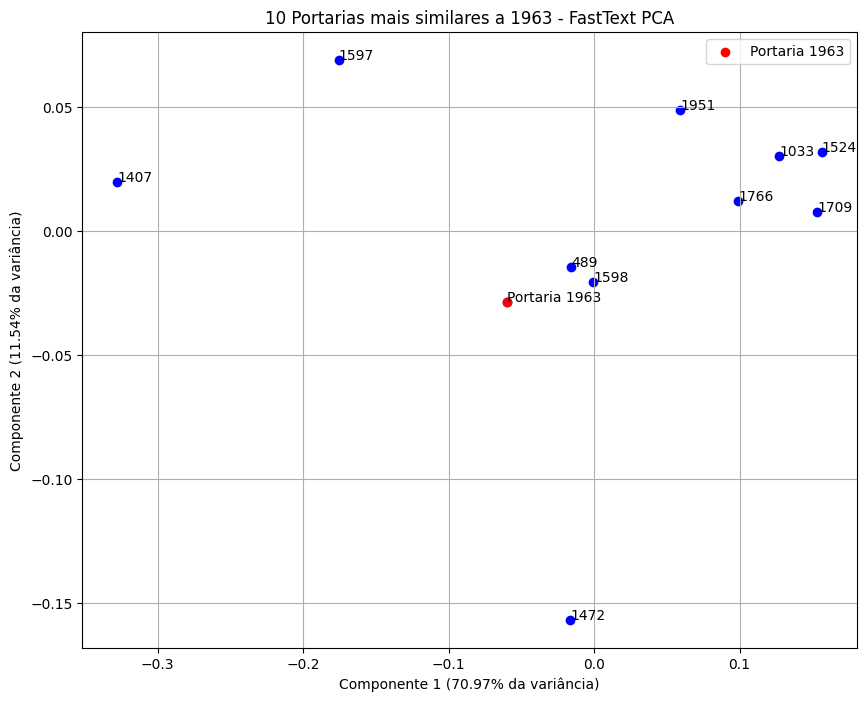


Total da Variância Explicada = 82.51 %


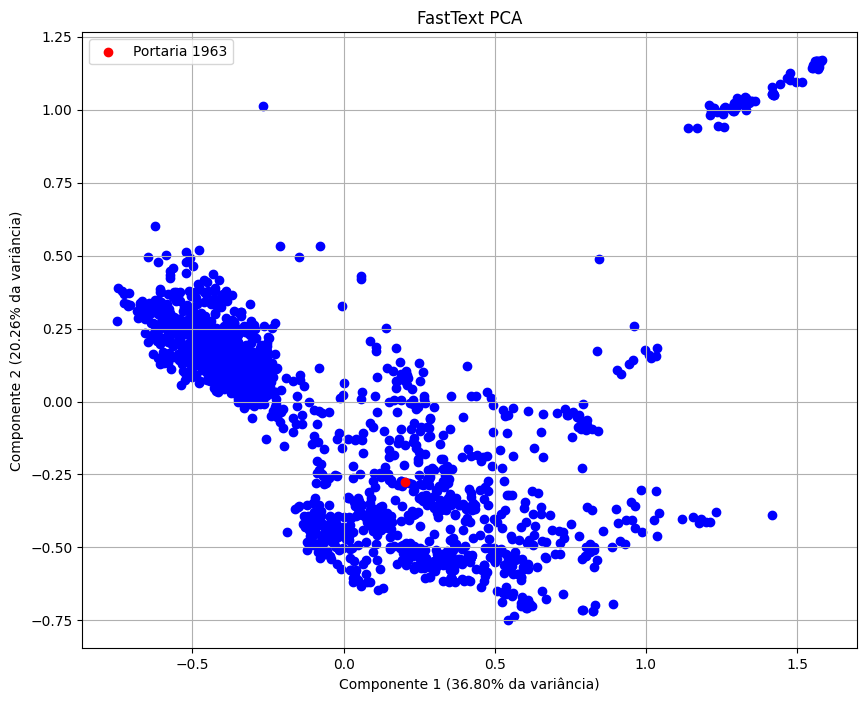


Total da Variância Explicada = 57.06 %


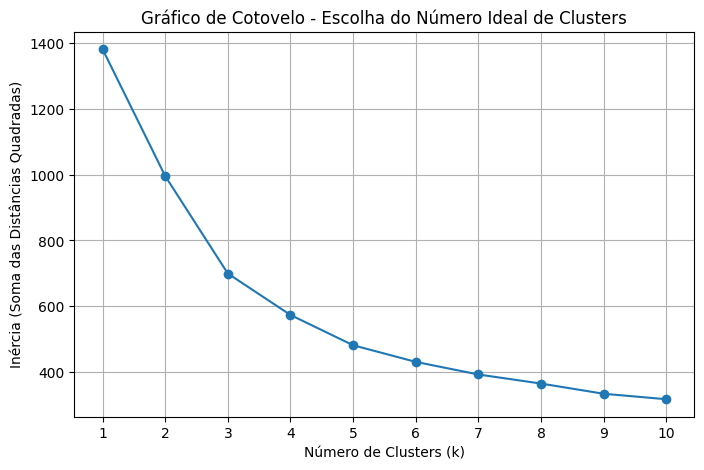

<ipython-input-15-ef7484a32e62>:149: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cores = plt.cm.get_cmap("tab10", n_clusters)


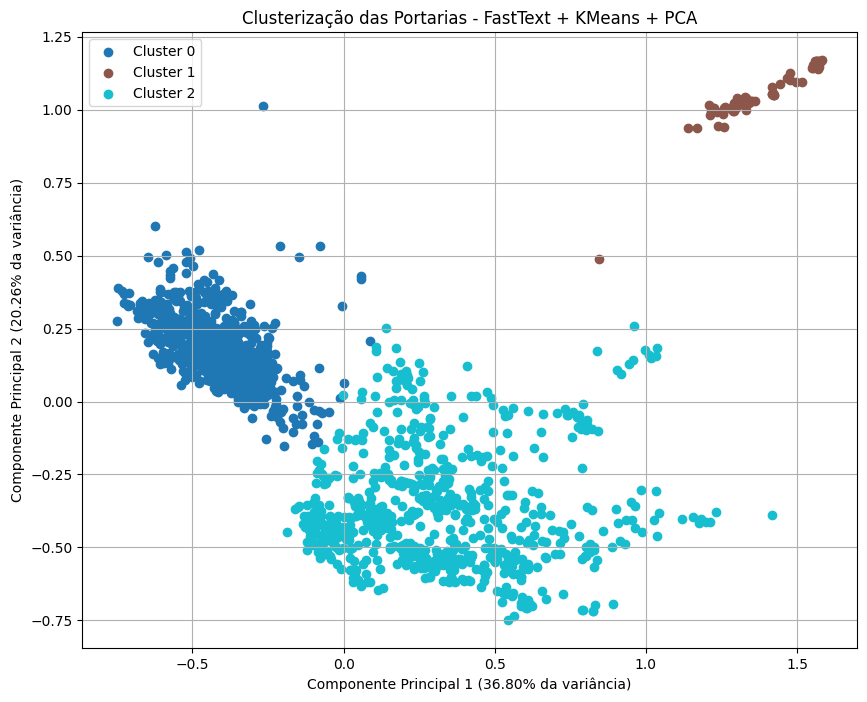


Total da Variância Explicada = 57.06 %


In [15]:
# 5. Similaridade
# 5.1 FastText
# 5.1.1 PCA

# portarias_processadas
# vetores_fasttext

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Portaria exemplo
numero_desejado = "1963"

if numero_desejado not in vetores_fasttext:
    print(f"Portaria {numero_desejado} não encontrada (está ausente no conjunto de dados).")
else:
    vetor_exemplo = vetores_fasttext[numero_desejado]

    # Calcular Similaridade Cosseno com todas as outras portarias
    todos_numeros = list(vetores_fasttext.keys())
    todos_vetores = np.array([vetores_fasttext[num] for num in todos_numeros])

    similaridades = cosine_similarity([vetor_exemplo], todos_vetores)[0]

    # Obter as mais 10 semelhantes (exceto ela mesma)
    indices_ordenados = np.argsort(similaridades)[::-1]
    indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado][:10]

    print(f"\nPortaria de exemplo: {numero_desejado}")
    print("Texto:", " ".join(portarias_processadas[numero_desejado]["conteudo"]))

    print("\n Portarias mais semelhantes:")
    for i, idx in enumerate(indices_mais_proximos):
        num_similar = todos_numeros[idx]
        print(f"{i+1}. Portaria {num_similar} - Similaridade: {similaridades[idx]:.4f} - Texto: {portarias_processadas[num_similar]['conteudo']} ")

    # Visualização com PCA devido a alta dimensão
    vetores_vis = np.array([vetores_fasttext[numero_desejado]] + [vetores_fasttext[todos_numeros[idx]] for idx in indices_mais_proximos])
    pca = PCA(n_components=2)
    vetores_reduzidos = pca.fit_transform(vetores_vis)

    # Variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_ * 100  # porcentagem

    plt.figure(figsize=(10, 8))
    plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
    plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')

    # Adicionar rótulos nos pontos
    plt.annotate(f"Portaria {numero_desejado}", (vetores_reduzidos[0, 0], vetores_reduzidos[0, 1]))
    for i, idx in enumerate(indices_mais_proximos):
        plt.annotate(f"{todos_numeros[idx]}", (vetores_reduzidos[i+1, 0], vetores_reduzidos[i+1, 1]))

    # Eixos com variância explicada
    plt.xlabel(f"Componente 1 ({var_exp[0]:.2f}% da variância)")
    plt.ylabel(f"Componente 2 ({var_exp[1]:.2f}% da variância)")

    plt.title(f"10 Portarias mais similares a {numero_desejado} - FastText PCA")
    plt.grid(True)
    plt.legend()
    plt.show()

    print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

    # Todas as portarias

    # Visualização com PCA devido a alta dimensão
    indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado]
    vetores_vis = np.array([vetores_fasttext[numero_desejado]] + [vetores_fasttext[todos_numeros[idx]] for idx in indices_mais_proximos])
    pca = PCA(n_components=2)
    vetores_reduzidos = pca.fit_transform(vetores_vis)

    # Variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_ * 100  # porcentagem

    plt.figure(figsize=(10, 8))
    plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
    plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')


    # Eixos com variância explicada
    plt.xlabel(f"Componente 1 ({var_exp[0]:.2f}% da variância)")
    plt.ylabel(f"Componente 2 ({var_exp[1]:.2f}% da variância)")

    plt.title(f"FastText PCA")
    plt.grid(True)
    plt.legend()
    plt.show()

    print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

# 5.1 FastText
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Vetores e índices já existentes
numeros_portarias = list(vetores_fasttext.keys())
matriz_vetores = np.array([vetores_fasttext[num] for num in numeros_portarias])

# Gerar gráfico de cotovelo - número ideal de clusters
inertias = []
intervalo_clusters = range(1, 11)

for k in intervalo_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(matriz_vetores)
    inertias.append(kmeans.inertia_)

# Plot do gráfico de cotovelo
plt.figure(figsize=(8, 5))
plt.plot(intervalo_clusters, inertias, marker='o')
plt.title("Gráfico de Cotovelo - Escolha do Número Ideal de Clusters")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Inércia (Soma das Distâncias Quadradas)")
plt.xticks(intervalo_clusters)
plt.grid(True)
plt.show()

# Escolher o número de clusters
n_clusters = 3

# Com 4 clusters diversas observações de diferentes clusters ficaram praticamente sobrepostas

# Aplicar KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
rotulos = kmeans.fit_predict(matriz_vetores)

# Agrupar portarias por cluster
clusters = {i: [] for i in range(n_clusters)}
for num, r in zip(numeros_portarias, rotulos):
    clusters[r].append(num)

# Visualização dos clusters com PCA
pca = PCA(n_components=2)
vetores_reduzidos = pca.fit_transform(matriz_vetores)

# Variância explicada por componente
var_exp = pca.explained_variance_ratio_ * 100  # em porcentagem

plt.figure(figsize=(10, 8))
cores = plt.cm.get_cmap("tab10", n_clusters)

for i in range(n_clusters):
    idxs = [j for j, label in enumerate(rotulos) if label == i]
    plt.scatter(
        vetores_reduzidos[idxs, 0],
        vetores_reduzidos[idxs, 1],
        label=f"Cluster {i}",
        color=cores(i)
    )

plt.title("Clusterização das Portarias - FastText + KMeans + PCA")
plt.xlabel(f"Componente Principal 1 ({var_exp[0]:.2f}% da variância)")
plt.ylabel(f"Componente Principal 2 ({var_exp[1]:.2f}% da variância)")
plt.legend()
plt.grid(True)
plt.show()

print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")



Cluster 0 (895)	Cluster 1 (100)	Cluster 2 (712)
-----------------------------------------------
Portaria 1933	Portaria 1942	Portaria 1963
Portaria 1904	Portaria 1940	Portaria 1962
Portaria 1868	Portaria 1939	Portaria 1961
Portaria 1826	Portaria 1900	Portaria 1960
Portaria 1825	Portaria 1899	Portaria 1959
Portaria 1821	Portaria 1896	Portaria 1958
Portaria 1817	Portaria 1886	Portaria 1957
Portaria 1813	Portaria 1885	Portaria 1956
Portaria 1803	Portaria 1872	Portaria 1955
Portaria 1788	Portaria 1871	Portaria 1954
Portaria 1783	Portaria 1863	Portaria 1953
Portaria 1752	Portaria 1862	Portaria 1952
Portaria 1707	Portaria 1840	Portaria 1951
Portaria 1693	Portaria 1839	Portaria 1950
Portaria 1691	Portaria 1834	Portaria 1949
Portaria 1689	Portaria 1833	Portaria 1948
Portaria 1670	Portaria 1816	Portaria 1947
Portaria 1630	Portaria 1815	Portaria 1946
Portaria 1617	Portaria 1792	Portaria 1945
Portaria 1577	Portaria 1791	Portaria 1944
Portaria 1576	Portaria 1765	Portaria 1943
Portaria 1575	Portaria

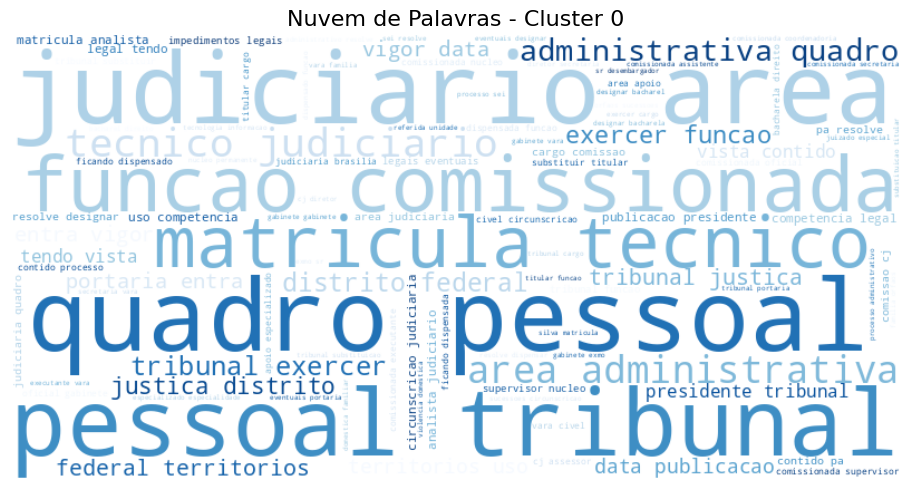

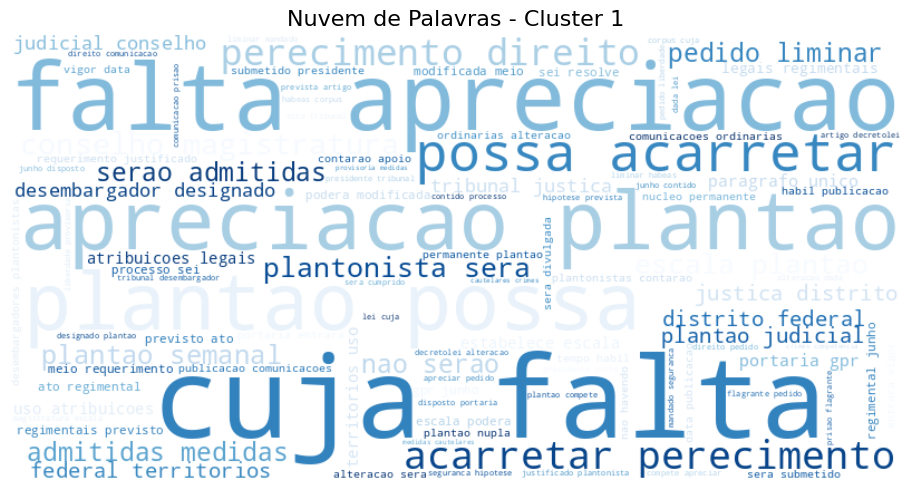

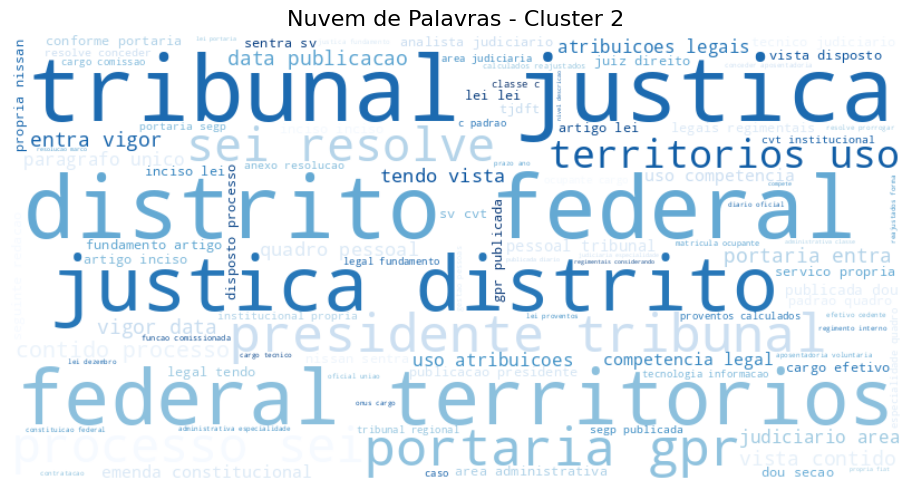

In [16]:
# 5.1 FastText
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

# portarias_processadas
# vetores_fasttext

from itertools import zip_longest
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from itertools import zip_longest

# Dicionário para armazenar o resultado da tabela
tabelas_clusters = {}

# Identificador da tabela
identificador = "clusters_portarias_processadas"

# Obter IDs e valores dos clusters
cluster_ids = list(clusters.keys())
cluster_values = list(clusters.values())

# Construir a tabela como uma lista de strings (linhas)
tabela_atual = []

# Cabeçalho
header = "\t".join(f"Cluster {i} ({len(clusters[i])})" for i in cluster_ids)
tabela_atual.append(header)
tabela_atual.append("-" * len(header.expandtabs()))

# Corpo da tabela
for row in zip_longest(*cluster_values, fillvalue=""):
    row_str = "\t".join(f"Portaria {val}" if val != "" else "" for val in row)
    tabela_atual.append(row_str)

# Armazena a tabela na variável específica
tabelas_clusters[identificador] = tabela_atual

# Exibe a tabela atual
print("\n".join(tabela_atual))


# ---------------------------------
# Gerar nuvens de palavras por cluster
# ---------------------------------

for cluster_id, portarias in clusters.items():
    # Coletar todos os tokens do cluster
    tokens_cluster = []
    for portaria_id in portarias:
        if portaria_id in portarias_processadas:
            tokens_cluster.extend(portarias_processadas[portaria_id]["conteudo"])

    # Se não houver tokens, pula
    if not tokens_cluster:
        continue

    # Criar string única para WordCloud
    texto = " ".join(tokens_cluster)

    # Gerar WordCloud
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='Blues',  # Paleta de cores
        max_words=100
    ).generate(texto)


    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Nuvem de Palavras - Cluster {cluster_id}", fontsize=16)
    plt.tight_layout()
    plt.show()


Portaria de exemplo: 1963
Texto: exonerar pedido claudia cruz cerquinho oliveira cargo juiza paz suplente oficio registro civil titulos documentos pessoas juridicas paranoa partir dezembro declarar vago cargo juiz paz suplente oficio registro civil titulos documentos pessoas juridicas paranoa preenchido mediante remocao juizes paz suplentes exercicio distrito federal paragrafo unico interessados deverao requerer inscricao prazo dias contar publicacao portaria portaria entra vigor data publicacao

 Portarias mais semelhantes:
1. Portaria 489 - Similaridade: 0.9993 - Texto: ['exonerar', 'pedido', 'andrea', 'soares', 'rocha', 'cargo', 'juiza', 'paz', 'suplente', 'oficio', 'registro', 'civil', 'titulos', 'documentos', 'pessoas', 'juridicas', 'samambaia', 'declarar', 'vago', 'cargo', 'juiz', 'paz', 'suplente', 'oficio', 'registro', 'civil', 'titulos', 'documentos', 'pessoas', 'juridicas', 'samambaia', 'preenchido', 'mediante', 'remocao', 'juizes', 'paz', 'suplentes', 'exercicio', 'distrito

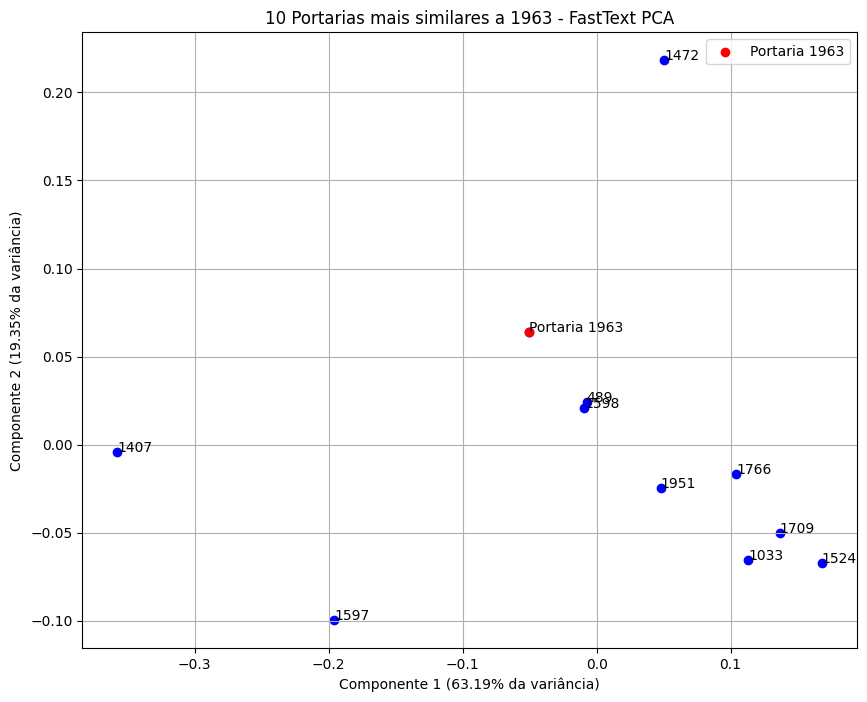


Total da Variância Explicada = 82.54 %


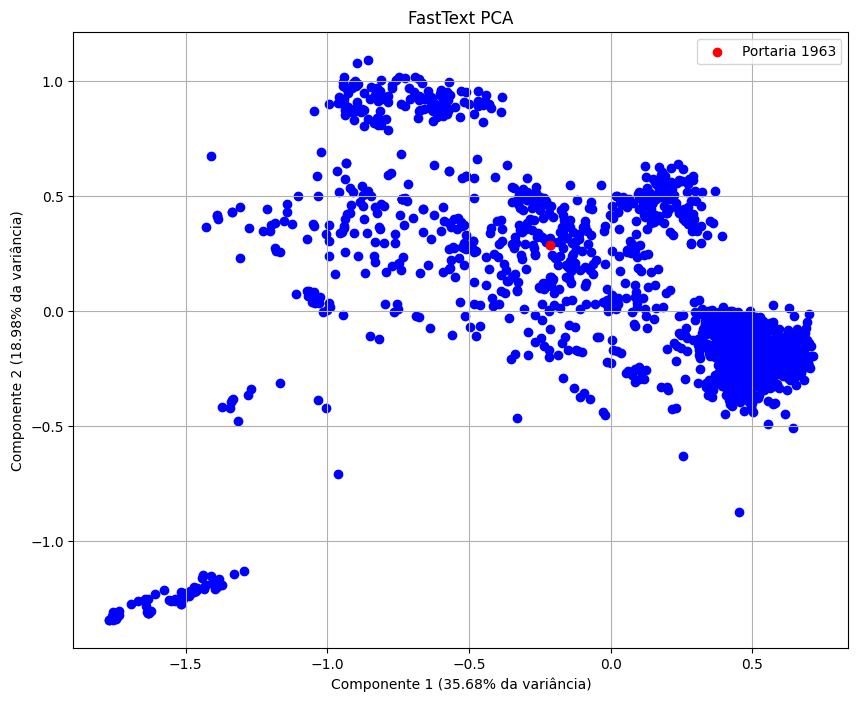


Total da Variância Explicada = 54.66 %


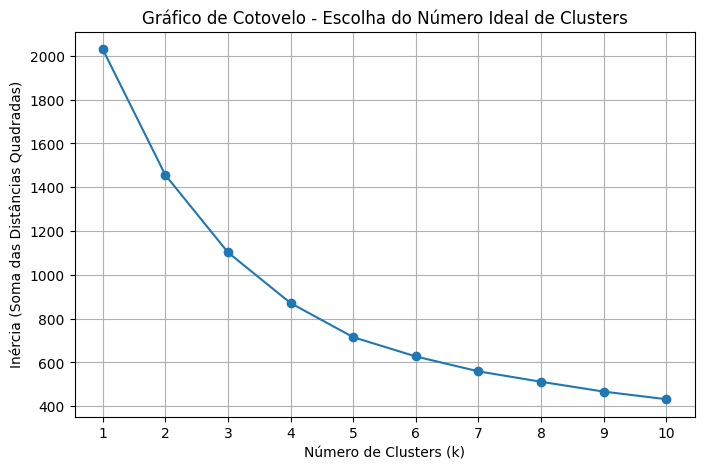

<ipython-input-17-54aa9afb84a9>:154: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cores = plt.cm.get_cmap("tab10", n_clusters)


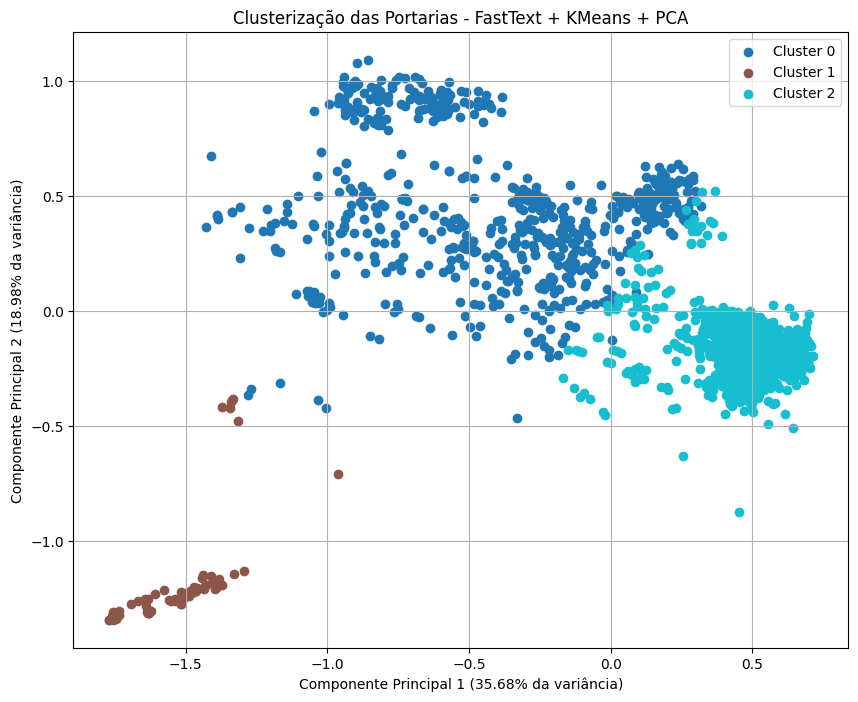


Total da Variância Explicada = 54.66 %


In [17]:
# 5. Similaridade
# 5.1 FastText
# 5.1.1 PCA

# portarias_ultra_processadas
# vetores_fasttext_ultra_processadas

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Portaria exemplo
numero_desejado = "1963"

if numero_desejado not in vetores_fasttext_ultra_processadas:
    print(f"Portaria {numero_desejado} não encontrada (está ausente no conjunto de dados).")
else:
    vetor_exemplo = vetores_fasttext_ultra_processadas[numero_desejado]

    # Calcular Similaridade Cosseno com todas as outras portarias
    todos_numeros = list(vetores_fasttext_ultra_processadas.keys())
    todos_vetores = np.array([vetores_fasttext_ultra_processadas[num] for num in todos_numeros])

    similaridades = cosine_similarity([vetor_exemplo], todos_vetores)[0]

    # Obter as mais 10 semelhantes (exceto ela mesma)
    indices_ordenados = np.argsort(similaridades)[::-1]
    indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado][:10]

    print(f"\nPortaria de exemplo: {numero_desejado}")
    print("Texto:", " ".join(portarias_ultra_processadas[numero_desejado]["conteudo"]))

    print("\n Portarias mais semelhantes:")
    for i, idx in enumerate(indices_mais_proximos):
        num_similar = todos_numeros[idx]
        print(f"{i+1}. Portaria {num_similar} - Similaridade: {similaridades[idx]:.4f} - Texto: {portarias_ultra_processadas[num_similar]['conteudo']} ")

    # Visualização com PCA devido a alta dimensão
    vetores_vis = np.array([vetores_fasttext_ultra_processadas[numero_desejado]] + [vetores_fasttext_ultra_processadas[todos_numeros[idx]] for idx in indices_mais_proximos])
    pca = PCA(n_components=2)
    vetores_reduzidos = pca.fit_transform(vetores_vis)

    # Variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_ * 100  # porcentagem

    plt.figure(figsize=(10, 8))
    plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
    plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')

    # Adicionar rótulos nos pontos
    plt.annotate(f"Portaria {numero_desejado}", (vetores_reduzidos[0, 0], vetores_reduzidos[0, 1]))
    for i, idx in enumerate(indices_mais_proximos):
        plt.annotate(f"{todos_numeros[idx]}", (vetores_reduzidos[i+1, 0], vetores_reduzidos[i+1, 1]))

    # Eixos com variância explicada
    plt.xlabel(f"Componente 1 ({var_exp[0]:.2f}% da variância)")
    plt.ylabel(f"Componente 2 ({var_exp[1]:.2f}% da variância)")

    plt.title(f"10 Portarias mais similares a {numero_desejado} - FastText PCA")
    plt.grid(True)
    plt.legend()
    plt.show()

    print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

    # Todas as portarias

    # Visualização com PCA devido a alta dimensão
    indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado]
    vetores_vis = np.array([vetores_fasttext_ultra_processadas[numero_desejado]] + [vetores_fasttext_ultra_processadas[todos_numeros[idx]] for idx in indices_mais_proximos])
    pca = PCA(n_components=2)
    vetores_reduzidos = pca.fit_transform(vetores_vis)

    # Variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_ * 100  # porcentagem

    plt.figure(figsize=(10, 8))
    plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
    plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')


    # Eixos com variância explicada
    plt.xlabel(f"Componente 1 ({var_exp[0]:.2f}% da variância)")
    plt.ylabel(f"Componente 2 ({var_exp[1]:.2f}% da variância)")

    plt.title(f"FastText PCA")
    plt.grid(True)
    plt.legend()
    plt.show()

    print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

# 5.1 FastText
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Vetores e índices já existentes
numeros_portarias = list(vetores_fasttext_ultra_processadas.keys())
matriz_vetores = np.array([vetores_fasttext_ultra_processadas[num] for num in numeros_portarias])

# Gerar gráfico de cotovelo - número ideal de clusters
inertias = []
intervalo_clusters = range(1, 11)

for k in intervalo_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(matriz_vetores)
    inertias.append(kmeans.inertia_)

# Plot do gráfico de cotovelo
plt.figure(figsize=(8, 5))
plt.plot(intervalo_clusters, inertias, marker='o')
plt.title("Gráfico de Cotovelo - Escolha do Número Ideal de Clusters")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Inércia (Soma das Distâncias Quadradas)")
plt.xticks(intervalo_clusters)
plt.grid(True)
plt.show()

# Escolher o número de clusters
n_clusters = 3

# Com 4 clusters algumas observações de diferentes clusters ficaram praticamente sobrepostas

# Aplicar KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
rotulos = kmeans.fit_predict(matriz_vetores)

# Mapeamento personalizado: [novo_rótulo para o rótulo antigo 0, 1, 2]
nova_ordem = [0, 2, 1]  # troca 1↔2
mapeamento_clusters = {antigo: novo for antigo, novo in enumerate(nova_ordem)}
rotulos = np.array([mapeamento_clusters[r] for r in rotulos])

# Agrupar portarias por cluster
clusters = {i: [] for i in range(n_clusters)}
for num, r in zip(numeros_portarias, rotulos):
    clusters[r].append(num)

# Visualização dos clusters com PCA
pca = PCA(n_components=2)
vetores_reduzidos = pca.fit_transform(matriz_vetores)

# Variância explicada por componente
var_exp = pca.explained_variance_ratio_ * 100  # em porcentagem

plt.figure(figsize=(10, 8))
cores = plt.cm.get_cmap("tab10", n_clusters)

for i in range(n_clusters):
    idxs = [j for j, label in enumerate(rotulos) if label == i]
    plt.scatter(
        vetores_reduzidos[idxs, 0],
        vetores_reduzidos[idxs, 1],
        label=f"Cluster {i}",
        color=cores(i)
    )

plt.title("Clusterização das Portarias - FastText + KMeans + PCA")
plt.xlabel(f"Componente Principal 1 ({var_exp[0]:.2f}% da variância)")
plt.ylabel(f"Componente Principal 2 ({var_exp[1]:.2f}% da variância)")
plt.legend()
plt.grid(True)
plt.show()

print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")



Cluster 0 (645)	Cluster 1 (106)	Cluster 2 (956)
-----------------------------------------------
Portaria 1963	Portaria 1942	Portaria 1960
Portaria 1962	Portaria 1940	Portaria 1933
Portaria 1961	Portaria 1939	Portaria 1904
Portaria 1959	Portaria 1900	Portaria 1889
Portaria 1958	Portaria 1899	Portaria 1868
Portaria 1957	Portaria 1896	Portaria 1856
Portaria 1956	Portaria 1886	Portaria 1827
Portaria 1955	Portaria 1885	Portaria 1826
Portaria 1954	Portaria 1872	Portaria 1825
Portaria 1953	Portaria 1871	Portaria 1821
Portaria 1952	Portaria 1863	Portaria 1817
Portaria 1951	Portaria 1862	Portaria 1813
Portaria 1950	Portaria 1840	Portaria 1803
Portaria 1949	Portaria 1839	Portaria 1794
Portaria 1948	Portaria 1834	Portaria 1788
Portaria 1947	Portaria 1833	Portaria 1783
Portaria 1946	Portaria 1816	Portaria 1773
Portaria 1945	Portaria 1815	Portaria 1770
Portaria 1944	Portaria 1792	Portaria 1769
Portaria 1943	Portaria 1791	Portaria 1768
Portaria 1938	Portaria 1765	Portaria 1752
Portaria 1937	Portaria

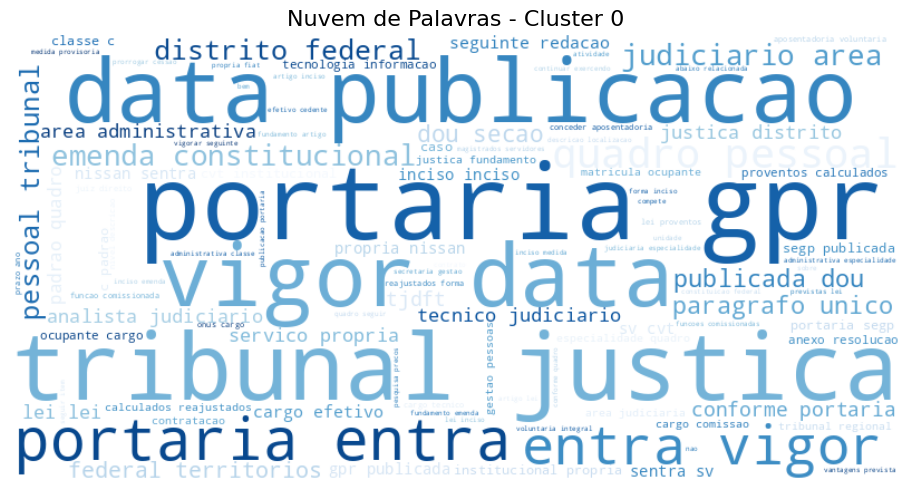

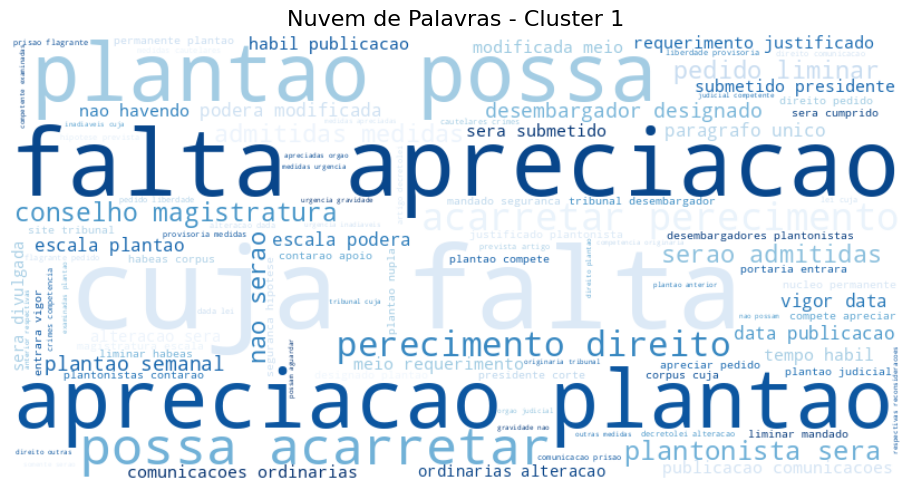

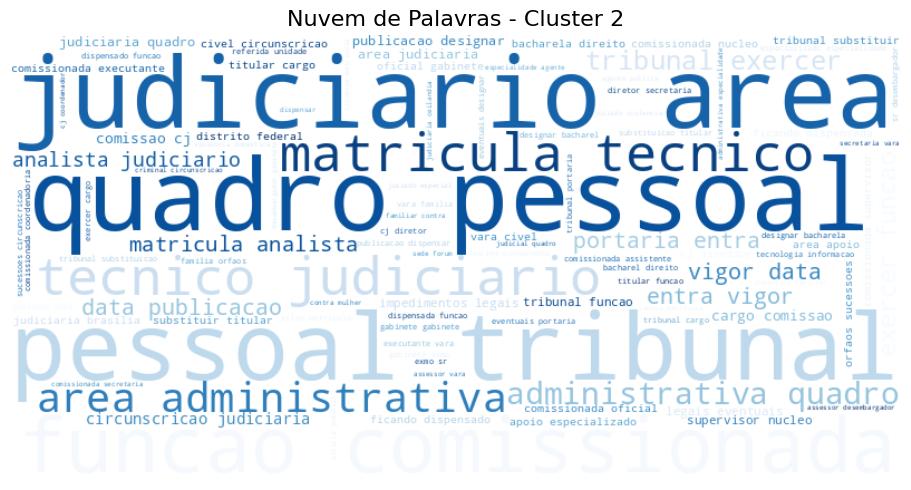

In [18]:
# 5.1 FastText
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

# portarias_ultra_processadas
# vetores_fasttext_ultra_processadas

from itertools import zip_longest
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Dicionário para armazenar o resultado da tabela -> tabelas_clusters

# Identificador da tabela
identificador = "clusters_portarias_ultra_processadas"

# Obter IDs e valores dos clusters
cluster_ids = list(clusters.keys())
cluster_values = list(clusters.values())

# Construir a tabela como uma lista de strings (linhas)
tabela_atual = []

# Cabeçalho
header = "\t".join(f"Cluster {i} ({len(clusters[i])})" for i in cluster_ids)
tabela_atual.append(header)
tabela_atual.append("-" * len(header.expandtabs()))

# Corpo da tabela
for row in zip_longest(*cluster_values, fillvalue=""):
    row_str = "\t".join(f"Portaria {val}" if val != "" else "" for val in row)
    tabela_atual.append(row_str)

# Armazena a tabela na variável específica
tabelas_clusters[identificador] = tabela_atual

# Exibe a tabela atual
print("\n".join(tabela_atual))

# ---------------------------------
# Gerar nuvens de palavras por cluster
# ---------------------------------

for cluster_id, portarias in clusters.items():
    # Coletar todos os tokens do cluster
    tokens_cluster = []
    for portaria_id in portarias:
        if portaria_id in portarias_ultra_processadas:
            tokens_cluster.extend(portarias_ultra_processadas[portaria_id]["conteudo"])

    # Se não houver tokens, pula
    if not tokens_cluster:
        continue

    # Criar string única para WordCloud
    texto = " ".join(tokens_cluster)

    # Gerar WordCloud
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='Blues',  # Paleta de cores
        max_words=100
    ).generate(texto)


    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Nuvem de Palavras - Cluster {cluster_id}", fontsize=16)
    plt.tight_layout()
    plt.show()

In [19]:
# 5. Similaridade
# 5.1 FastText
# 5.1.1 PCA
# Comparar e identificar as portarias que mudaram de cluster entre os processos com portarias_processadas e portarias_ultra_processadas

# Converte a saída de uma tabela de clusters (em formato de lista de strings)  para um dicionário do tipo {portaria: cluster}.

def extrair_dicionario_clusters(tabela_cluster_str):
    clusters_dict = {}
    linhas = tabela_cluster_str[2:]  # pula header e separador
    for i, linha in enumerate(linhas):
        colunas = linha.split('\t')
        for cluster_id, portaria in enumerate(colunas):
            if portaria.strip():  # ignora células vazias
                clusters_dict[portaria.strip().split()[-1]] = cluster_id  # pega só o número da portaria
    return clusters_dict

# Extrai os dicionários de cluster para cada portaria
clusters_proc = extrair_dicionario_clusters(tabelas_clusters['clusters_portarias_processadas'])
clusters_ultra = extrair_dicionario_clusters(tabelas_clusters['clusters_portarias_ultra_processadas'])

# Compara e identifica as portarias que mudaram de cluster
portarias_mudaram = []
for portaria in clusters_proc:
    if portaria in clusters_ultra:
        if clusters_proc[portaria] != clusters_ultra[portaria]:
            portarias_mudaram.append((portaria, clusters_proc[portaria], clusters_ultra[portaria]))

# Exibe os resultados com conteúdo
print(f"\nTotal de portarias que mudaram de cluster: {len(portarias_mudaram)}")
for portaria, cluster_antigo, cluster_novo in portarias_mudaram:
    conteudo = portarias_ultra_processadas.get(portaria, {}).get("conteudo", [])
    print(f"\nPortaria {portaria}: Cluster {cluster_antigo} → Cluster {cluster_novo}")
    print(f"Conteúdo ultra processado: {conteudo}")



Total de portarias que mudaram de cluster: 1538

Portaria 1933: Cluster 0 → Cluster 2
Conteúdo ultra processado: ['dispensar', 'martha', 'lucia', 'silva', 'matricula', 'tecnico', 'judiciario', 'area', 'administrativa', 'quadro', 'pessoal', 'tribunal', 'funcao', 'comissionada', 'coordenadoria', 'cadastro', 'gestao', 'informacao', 'pessoalcocap', 'dispensar', 'isis', 'miyuki', 'sato', 'camargo', 'matricula', 'tecnico', 'judiciario', 'area', 'administrativa', 'quadro', 'pessoal', 'tribunal', 'funcao', 'comissionada', 'coordenadoria', 'cadastro', 'gestao', 'informacao', 'pessoalcocap', 'dispensar', 'jose', 'barbosa', 'nazareth', 'junior', 'matricula', 'tecnico', 'judiciario', 'area', 'administrativa', 'quadro', 'pessoal', 'tribunal', 'funcao', 'comissionada', 'supervisor', 'nucleo', 'registro', 'funcional', 'pessoal', 'cedido', 'afastado', 'desligado', 'beneficios', 'nurad', 'dispensar', 'rafael', 'freitas', 'cervo', 'matricula', 'analista', 'judiciario', 'area', 'administrativa', 'quadro

In [20]:
# 5.1 FastText
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

# clusters
# portarias_processadas

# Salvar Dados

from google.colab import drive
import json

# Montar o Google Drive (ignorar erro se já estiver montado)
drive.mount('/content/drive', force_remount=False)

# Caminho para salvar dentro do Drive
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/clusters_proc.json"

# Converter os vetores NumPy para listas
vetores_serializaveis = {
    k: v.tolist() if hasattr(v, "tolist") else v
    for k, v in clusters_proc.items()
}

# Salvar como JSON
with open(caminho_arquivo, "w", encoding="utf-8") as f:
    json.dump(vetores_serializaveis, f, ensure_ascii=False, indent=4)

print(f"Dados salvos com sucesso em: {caminho_arquivo}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados salvos com sucesso em: /content/drive/My Drive/UnB/EU/TCC/Davi/Dados/clusters_proc.json


In [7]:
# 5.1 FastText
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

# clusters
# portarias_processadas

# Carregar Dados

from google.colab import drive
import json

# Montar o Google Drive
drive.mount('/content/drive')

# Carregar Dados

import os

caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/clusters_proc.json"

# Verifica se o arquivo já existe no Drive
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        clusters_proc = json.load(f)
    print("Dados carregados do Google Drive.")
else:
    print("Arquivo não encontrado. Execute o scraping.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados carregados do Google Drive.



Portaria de exemplo: 1963
Texto: exonera pedido claudia cruz cerquinho oliveira cargo juiza paz suplente oficio registro civil titulos documentos pessoas juridicas paranoa

 Portarias mais semelhantes:
1. Portaria 1766 - Similaridade: 0.99999976 - Texto: ['remove', 'rodrigo', 'garcia', 'reis', 'cargo', 'd', 'juiz', 'paz', 'suplente', 'oficio', 'registro', 'civil', 'titulos', 'documentos', 'pessoas', 'juridicas', 'ceilandia', 'cargo', 'juiz', 'paz', 'suplente', 'oficio', 'registro', 'civil', 'casamento', 'titulos', 'documentos', 'pessoas', 'juridicas', 'brasilia'] 
2. Portaria 1889 - Similaridade: 0.99999976 - Texto: ['nomeia', 'manoel', 'vicente', 'santos', 'neto', 'cargo', 'juiz', 'paz', 'suplente', 'oficio', 'registro', 'civil', 'titulos', 'documentos', 'pessoas', 'juridicas', 'ceilandia'] 
3. Portaria 1414 - Similaridade: 0.99999976 - Texto: ['nomeia', 'aline', 'dias', 'machado', 'cavalli', 'cargo', 'juiza', 'paz', 'suplente', 'oficio', 'registro', 'civil', 'titulos', 'documentos',

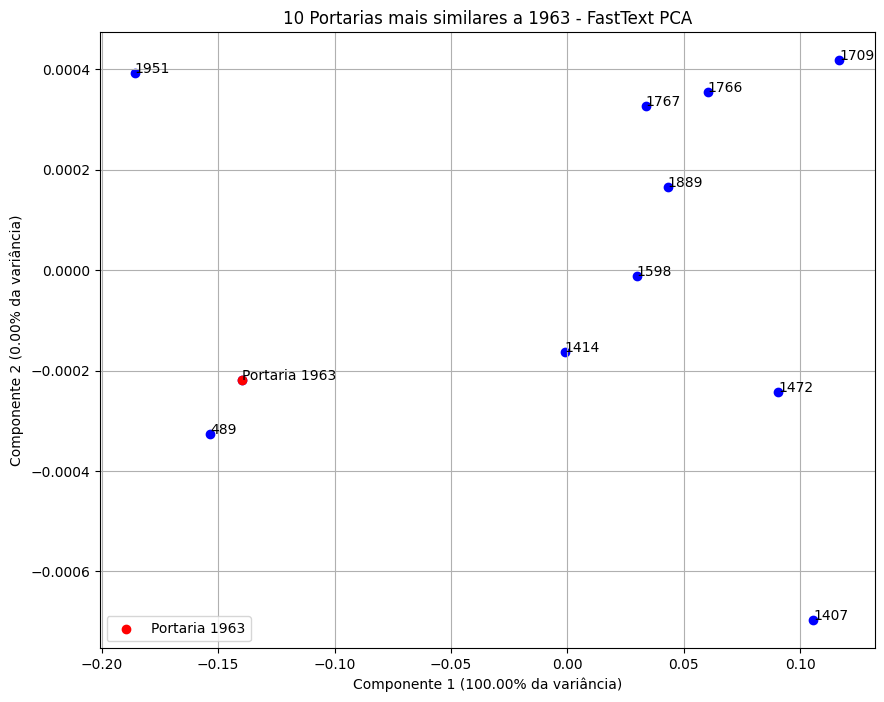


Total da Variância Explicada = 100.00 %


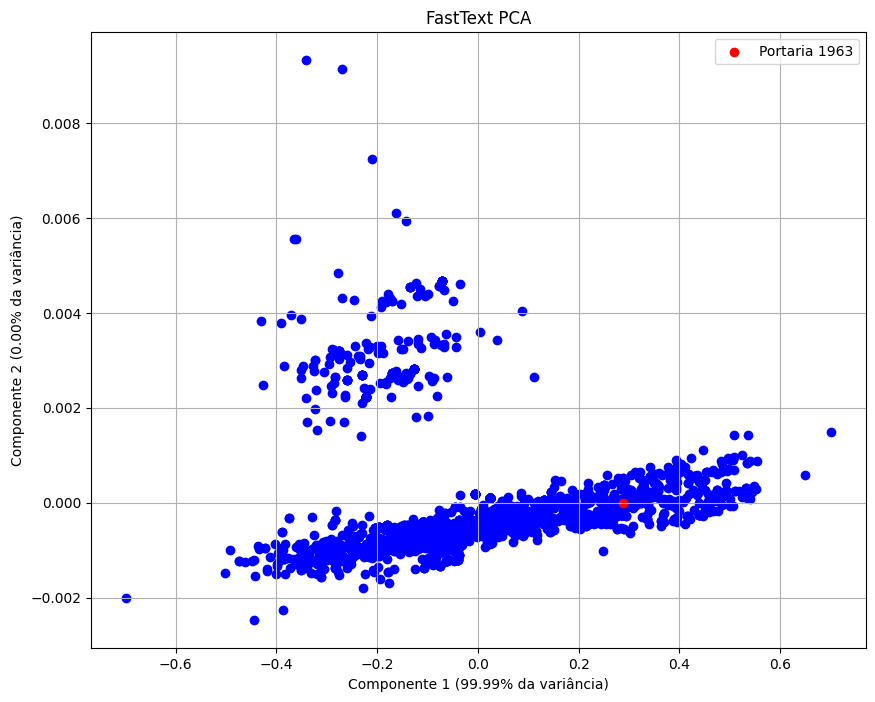


Total da Variância Explicada = 99.99 %


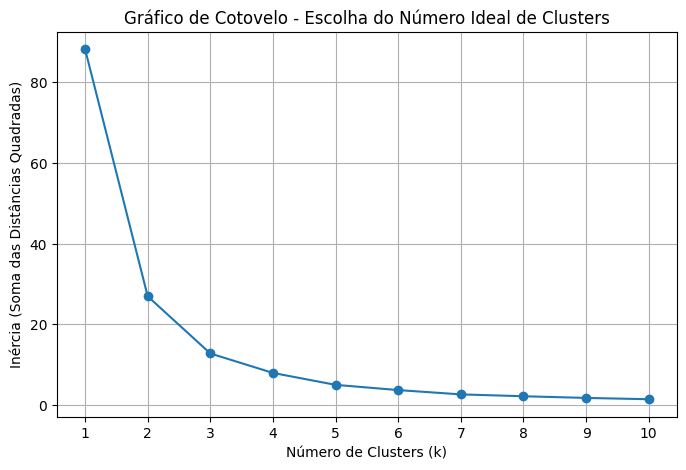

<ipython-input-21-cda1f64597a1>:147: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cores = plt.cm.get_cmap("tab10", n_clusters)


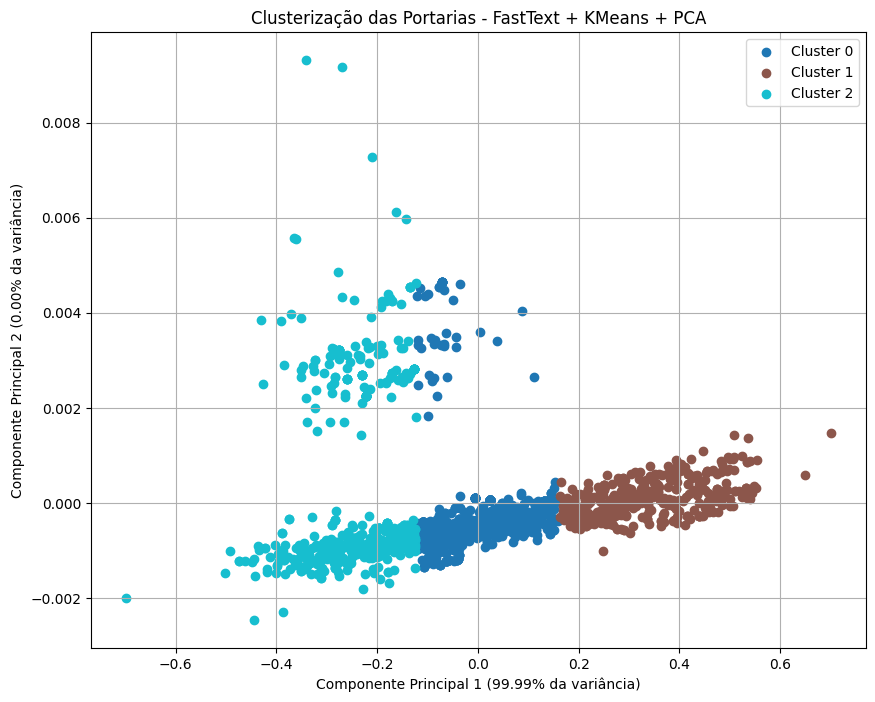


Total da Variância Explicada = 99.99 %


In [21]:
# 5. Similaridade
# 5.1 FastText
# 5.1.1 PCA

# portarias_processadas -> resumo
# vetores_fasttext_resumo

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Portaria exemplo
numero_desejado = "1963"

if numero_desejado not in vetores_fasttext_resumo:
    print(f"Portaria {numero_desejado} não encontrada (está ausente no conjunto de dados).")
else:
    vetor_exemplo = vetores_fasttext_resumo[numero_desejado]

    # Calcular Similaridade Cosseno com todas as outras portarias
    todos_numeros = list(vetores_fasttext_resumo.keys())
    todos_vetores = np.array([vetores_fasttext_resumo[num] for num in todos_numeros])

    similaridades = cosine_similarity([vetor_exemplo], todos_vetores)[0]

    # Obter as mais 10 semelhantes (exceto ela mesma)
    indices_ordenados = np.argsort(similaridades)[::-1]
    indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado][:10]

    print(f"\nPortaria de exemplo: {numero_desejado}")
    print("Texto:", " ".join(portarias_processadas[numero_desejado]["resumo"]))

    print("\n Portarias mais semelhantes:")
    for i, idx in enumerate(indices_mais_proximos):
        num_similar = todos_numeros[idx]
        print(f"{i+1}. Portaria {num_similar} - Similaridade: {similaridades[idx]:.8f} - Texto: {portarias_processadas[num_similar]['resumo']} ")

    # Visualização com PCA devido a alta dimensão
    vetores_vis = np.array([vetores_fasttext_resumo[numero_desejado]] + [vetores_fasttext_resumo[todos_numeros[idx]] for idx in indices_mais_proximos])
    pca = PCA(n_components=2)
    vetores_reduzidos = pca.fit_transform(vetores_vis)

    # Variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_ * 100  # porcentagem

    plt.figure(figsize=(10, 8))
    plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
    plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')

    # Adicionar rótulos nos pontos
    plt.annotate(f"Portaria {numero_desejado}", (vetores_reduzidos[0, 0], vetores_reduzidos[0, 1]))
    for i, idx in enumerate(indices_mais_proximos):
        plt.annotate(f"{todos_numeros[idx]}", (vetores_reduzidos[i+1, 0], vetores_reduzidos[i+1, 1]))

    # Eixos com variância explicada
    plt.xlabel(f"Componente 1 ({var_exp[0]:.2f}% da variância)")
    plt.ylabel(f"Componente 2 ({var_exp[1]:.2f}% da variância)")

    plt.title(f"10 Portarias mais similares a {numero_desejado} - FastText PCA")
    plt.grid(True)
    plt.legend()
    plt.show()

    print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

    # Todas as portarias

    # Visualização com PCA devido a alta dimensão
    indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado]
    vetores_vis = np.array([vetores_fasttext_resumo[numero_desejado]] + [vetores_fasttext_resumo[todos_numeros[idx]] for idx in indices_mais_proximos])
    pca = PCA(n_components=2)
    vetores_reduzidos = pca.fit_transform(vetores_vis)

    # Variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_ * 100  # porcentagem

    plt.figure(figsize=(10, 8))
    plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
    plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')


    # Eixos com variância explicada
    plt.xlabel(f"Componente 1 ({var_exp[0]:.2f}% da variância)")
    plt.ylabel(f"Componente 2 ({var_exp[1]:.2f}% da variância)")

    plt.title(f"FastText PCA")
    plt.grid(True)
    plt.legend()
    plt.show()

    print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

# 5.1 FastText
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Vetores e índices já existentes
numeros_portarias = list(vetores_fasttext_resumo.keys())
matriz_vetores = np.array([vetores_fasttext_resumo[num] for num in numeros_portarias])

# Gerar gráfico de cotovelo - número ideal de clusters
inertias = []
intervalo_clusters = range(1, 11)

for k in intervalo_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(matriz_vetores)
    inertias.append(kmeans.inertia_)

# Plot do gráfico de cotovelo
plt.figure(figsize=(8, 5))
plt.plot(intervalo_clusters, inertias, marker='o')
plt.title("Gráfico de Cotovelo - Escolha do Número Ideal de Clusters")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Inércia (Soma das Distâncias Quadradas)")
plt.xticks(intervalo_clusters)
plt.grid(True)
plt.show()

# Escolher o número de clusters
n_clusters = 3

# Aplicar KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
rotulos = kmeans.fit_predict(matriz_vetores)

# Agrupar portarias por cluster
clusters = {i: [] for i in range(n_clusters)}
for num, r in zip(numeros_portarias, rotulos):
    clusters[r].append(num)

# Visualização dos clusters com PCA
pca = PCA(n_components=2)
vetores_reduzidos = pca.fit_transform(matriz_vetores)

# Variância explicada por componente
var_exp = pca.explained_variance_ratio_ * 100  # em porcentagem

plt.figure(figsize=(10, 8))
cores = plt.cm.get_cmap("tab10", n_clusters)

for i in range(n_clusters):
    idxs = [j for j, label in enumerate(rotulos) if label == i]
    plt.scatter(
        vetores_reduzidos[idxs, 0],
        vetores_reduzidos[idxs, 1],
        label=f"Cluster {i}",
        color=cores(i)
    )

plt.title("Clusterização das Portarias - FastText + KMeans + PCA")
plt.xlabel(f"Componente Principal 1 ({var_exp[0]:.2f}% da variância)")
plt.ylabel(f"Componente Principal 2 ({var_exp[1]:.2f}% da variância)")
plt.legend()
plt.grid(True)
plt.show()

print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

# Atribuir peso ao primeiro token no calculo de similaridade ?

Cluster 0 (750)	Cluster 1 (409)	Cluster 2 (548)
-----------------------------------------------
Portaria 1961	Portaria 1963	Portaria 1959
Portaria 1955	Portaria 1962	Portaria 1947
Portaria 1953	Portaria 1960	Portaria 1932
Portaria 1952	Portaria 1958	Portaria 1916
Portaria 1948	Portaria 1957	Portaria 1898
Portaria 1945	Portaria 1956	Portaria 1897
Portaria 1943	Portaria 1954	Portaria 1880
Portaria 1942	Portaria 1951	Portaria 1868
Portaria 1939	Portaria 1950	Portaria 1867
Portaria 1937	Portaria 1949	Portaria 1825
Portaria 1933	Portaria 1946	Portaria 1813
Portaria 1930	Portaria 1944	Portaria 1810
Portaria 1927	Portaria 1940	Portaria 1802
Portaria 1926	Portaria 1938	Portaria 1792
Portaria 1918	Portaria 1936	Portaria 1788
Portaria 1914	Portaria 1935	Portaria 1787
Portaria 1911	Portaria 1934	Portaria 1786
Portaria 1910	Portaria 1931	Portaria 1782
Portaria 1909	Portaria 1929	Portaria 1752
Portaria 1907	Portaria 1925	Portaria 1726
Portaria 1900	Portaria 1924	Portaria 1670
Portaria 1894	Portaria

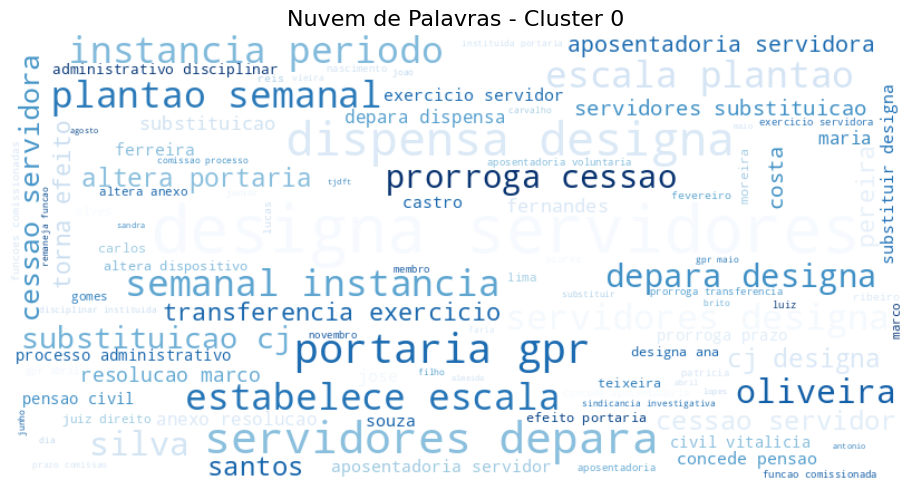

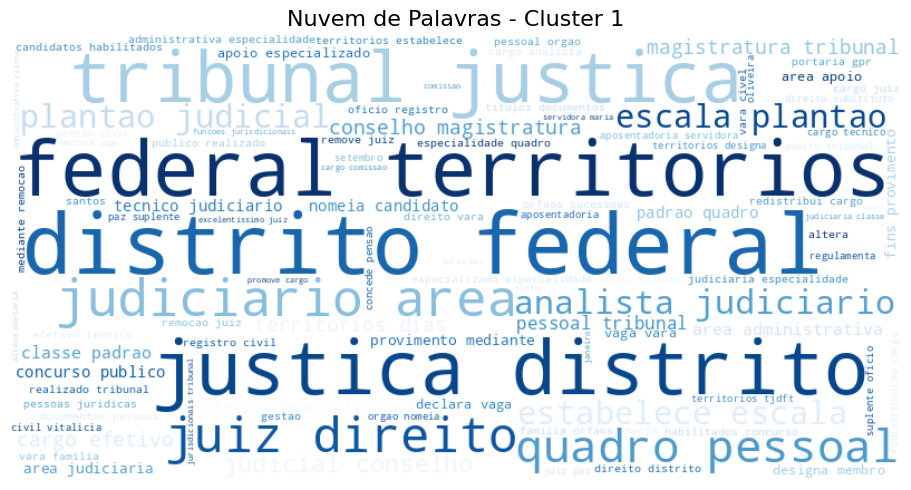

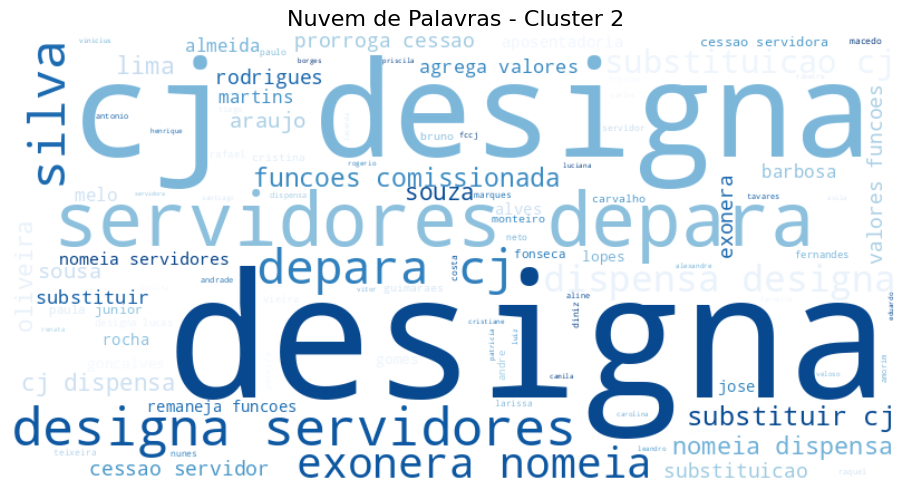

In [22]:
# 5.1 FastText
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

# portarias_processadas -> resumo
# vetores_fasttext_resumo

from itertools import zip_longest
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Visualizar clusters em formato de tabela

# Obtem os IDs dos clusters e os valores (listas de portarias)
cluster_ids = list(clusters.keys())
cluster_values = list(clusters.values())

# Usa zip_longest para "transpor" as listas com preenchimento vazio
for i, row in enumerate(zip_longest(*cluster_values, fillvalue="")):
    row_str = "\t".join(f"Portaria {val}" if val != "" else "" for val in row)
    if i == 0:
        header = "\t".join(f"Cluster {i} ({len(clusters[i])})" for i in cluster_ids)
        print(header)
        print("-" * len(header.expandtabs()))
    print(row_str)

# ---------------------------------
# Gerar nuvens de palavras por cluster
# ---------------------------------

for cluster_id, portarias in clusters.items():
    # Coletar todos os tokens do cluster
    tokens_cluster = []
    for portaria_id in portarias:
        if portaria_id in portarias_processadas:
            tokens_cluster.extend(portarias_processadas[portaria_id]["resumo"])

    # Se não houver tokens, pula
    if not tokens_cluster:
        continue

    # Criar string única para WordCloud
    texto = " ".join(tokens_cluster)

    # Gerar WordCloud
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        colormap='Blues',  # Paleta de cores
        max_words=100
    ).generate(texto)


    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Nuvem de Palavras - Cluster {cluster_id}", fontsize=16)
    plt.tight_layout()
    plt.show()


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


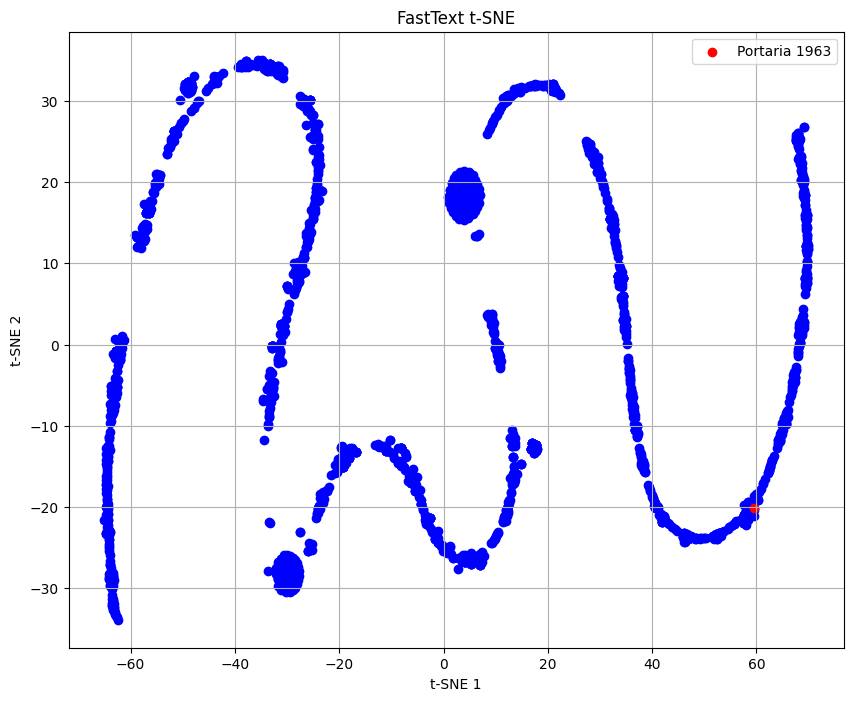

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
<ipython-input-23-7f26b7b7997b>:64: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cores = plt.cm.get_cmap("tab10", n_clusters)


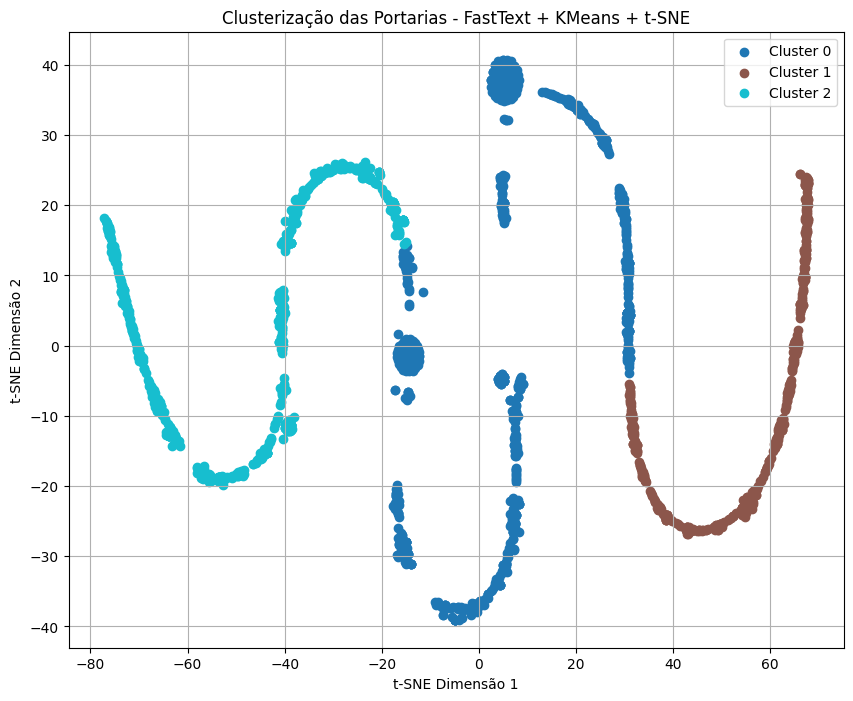

In [23]:
# 5. Similaridade
# 5.1 FastText
# 5.1.2 t-SNE


# portarias_processadas -> resumo
# vetores_fasttext_resumo

from sklearn.manifold import TSNE

# Visualização com t-SNE - todos

indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado]
vetores_vis = np.array([vetores_fasttext_resumo[numero_desejado]] + [vetores_fasttext_resumo[todos_numeros[idx]] for idx in indices_mais_proximos])

# t-SNE (perplexity pode ser ajustada para diferentes visualizações)
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
vetores_reduzidos = tsne.fit_transform(vetores_vis)

# Visualização
plt.figure(figsize=(10, 8))
plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')

# Adicionar rótulos
#plt.annotate(f"Portaria {numero_desejado}", (vetores_reduzidos[0, 0], vetores_reduzidos[0, 1]))
#for i, idx in enumerate(indices_mais_proximos):
#    plt.annotate(f"{todos_numeros[idx]}", (vetores_reduzidos[i+1, 0], vetores_reduzidos[i+1, 1]))

plt.title(f"FastText t-SNE")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True)
plt.legend()
plt.show()

# 5.1   FastText
# 6.    Clusterização
# 6.1   KMeans
# 6.1.2 T-SNE (t-Distributed Stochastic Neighbor Embedding)

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# Vetores e índices
numeros_portarias = list(vetores_fasttext_resumo.keys())
matriz_vetores = np.array([vetores_fasttext_resumo[num] for num in numeros_portarias])

# Determinar o número de clusters (Ajuste com base no gráfico de cotovelo anterior)
n_clusters = 3

# Aplicar KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
rotulos = kmeans.fit_predict(matriz_vetores)

# Visualizar com t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
vetores_tsne = tsne.fit_transform(matriz_vetores)

# Plotando os clusters com t-SNE
plt.figure(figsize=(10, 8))
cores = plt.cm.get_cmap("tab10", n_clusters)

for i in range(n_clusters):
    idxs = [j for j, label in enumerate(rotulos) if label == i]
    plt.scatter(
        vetores_tsne[idxs, 0],
        vetores_tsne[idxs, 1],
        label=f"Cluster {i}",
        color=cores(i)
    )

plt.title("Clusterização das Portarias - FastText + KMeans + t-SNE")
plt.xlabel("t-SNE Dimensão 1")
plt.ylabel("t-SNE Dimensão 2")
plt.legend()
plt.grid(True)
plt.show()

# DBSCAN provavelmente agruparia seguindo o formato mais complexo


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


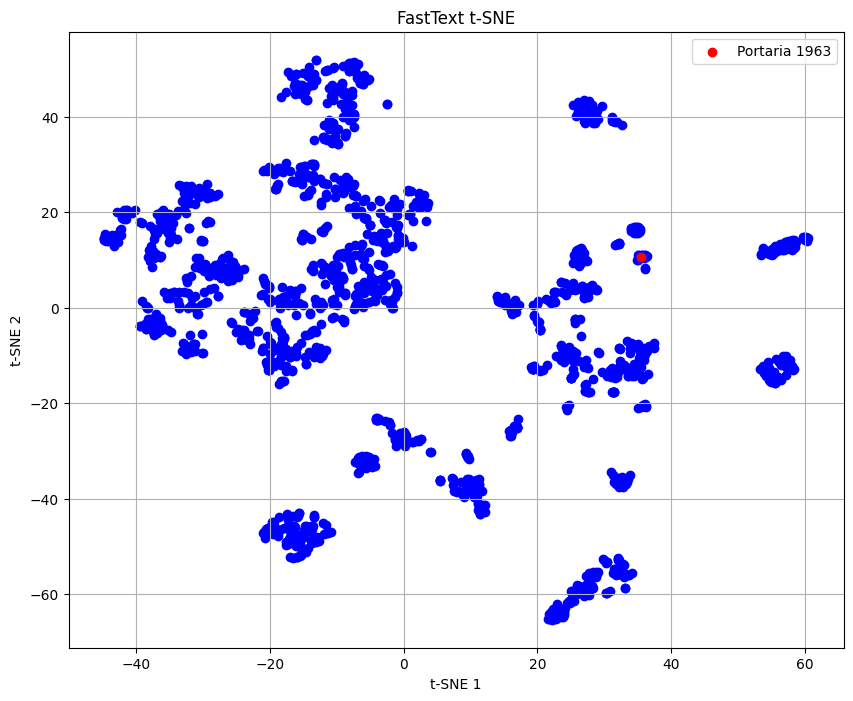

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
<ipython-input-24-a8098d1ccf88>:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cores = plt.cm.get_cmap("tab10", n_clusters)


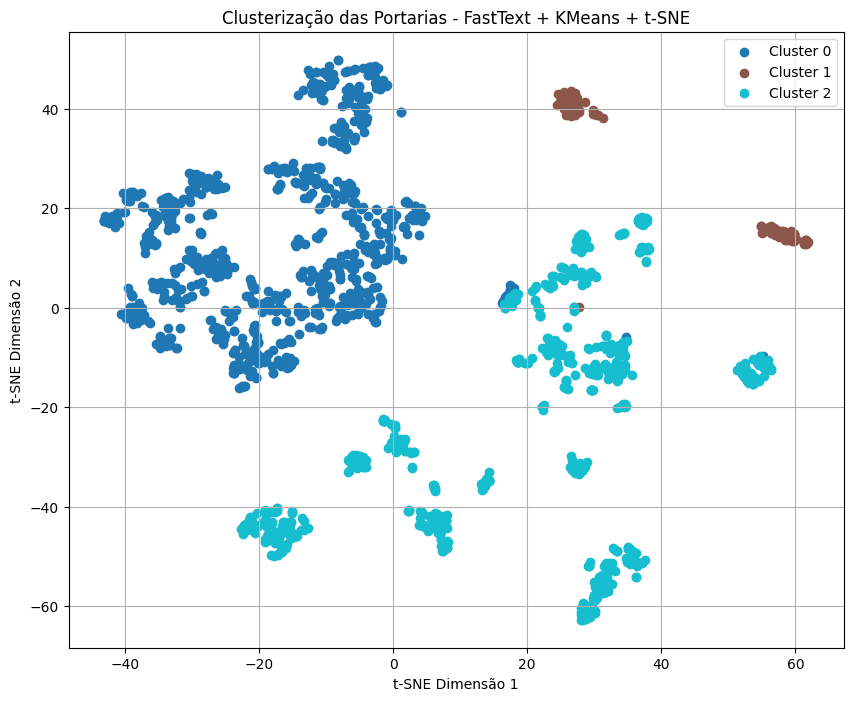

In [24]:
# 5. Similaridade
# 5.1 FastText
# 5.1.2 t-SNE

# portarias_processadas
# vetores_fasttext

from sklearn.manifold import TSNE

# Visualização com t-SNE - todos

indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado]
vetores_vis = np.array([vetores_fasttext[numero_desejado]] + [vetores_fasttext[todos_numeros[idx]] for idx in indices_mais_proximos])

# t-SNE (perplexity pode ser ajustada para diferentes visualizações)
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
vetores_reduzidos = tsne.fit_transform(vetores_vis)

# Visualização
plt.figure(figsize=(10, 8))
plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')

# Adicionar rótulos
#plt.annotate(f"Portaria {numero_desejado}", (vetores_reduzidos[0, 0], vetores_reduzidos[0, 1]))
#for i, idx in enumerate(indices_mais_proximos):
#    plt.annotate(f"{todos_numeros[idx]}", (vetores_reduzidos[i+1, 0], vetores_reduzidos[i+1, 1]))

plt.title(f"FastText t-SNE")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True)
plt.legend()
plt.show()

# 5.1   FastText
# 6.    Clusterização
# 6.1   KMeans
# 6.1.2 T-SNE (t-Distributed Stochastic Neighbor Embedding)

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# Vetores e índices
numeros_portarias = list(vetores_fasttext.keys())
matriz_vetores = np.array([vetores_fasttext[num] for num in numeros_portarias])

# Determinar o número de clusters (Ajuste com base no gráfico de cotovelo anterior)
n_clusters = 3

# Aplicar KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
rotulos = kmeans.fit_predict(matriz_vetores)

# Visualizar com t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
vetores_tsne = tsne.fit_transform(matriz_vetores)

# Plotando os clusters com t-SNE
plt.figure(figsize=(10, 8))
cores = plt.cm.get_cmap("tab10", n_clusters)

for i in range(n_clusters):
    idxs = [j for j, label in enumerate(rotulos) if label == i]
    plt.scatter(
        vetores_tsne[idxs, 0],
        vetores_tsne[idxs, 1],
        label=f"Cluster {i}",
        color=cores(i)
    )

plt.title("Clusterização das Portarias - FastText + KMeans + t-SNE")
plt.xlabel("t-SNE Dimensão 1")
plt.ylabel("t-SNE Dimensão 2")
plt.legend()
plt.grid(True)
plt.show()



Portaria de exemplo: 1963
Texto: presidente tribunal justica distrito federal territorios uso atribuicoes legais termos provimentogeral corregedoria aplicado servicos notariais registro vista contido processo sei resolve exonerar pedido claudia cruz cerquinho oliveira cargo juiza paz suplente oficio registro civil titulos documentos pessoas juridicas paranoa partir dezembro declarar vago cargo juiz paz suplente oficio registro civil titulos documentos pessoas juridicas paranoa preenchido mediante remocao juizes paz suplentes exercicio distrito federal paragrafo unico interessados deverao requerer inscricao prazo dias contar publicacao portaria portaria entra vigor data publicacao

 Portarias mais semelhantes:
1. Portaria 489 - Similaridade: 0.9996
2. Portaria 1598 - Similaridade: 0.9992
3. Portaria 1951 - Similaridade: 0.9982
4. Portaria 1472 - Similaridade: 0.9962
5. Portaria 1597 - Similaridade: 0.9960
6. Portaria 1766 - Similaridade: 0.9957
7. Portaria 1033 - Similaridade: 0.9944
8

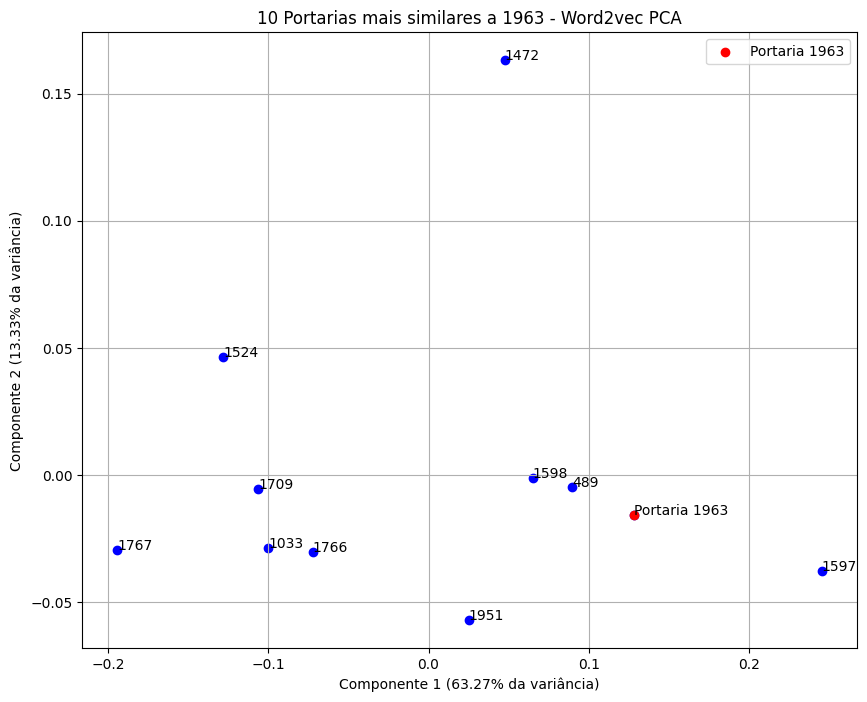


Total da Variância Explicada = 76.60 %


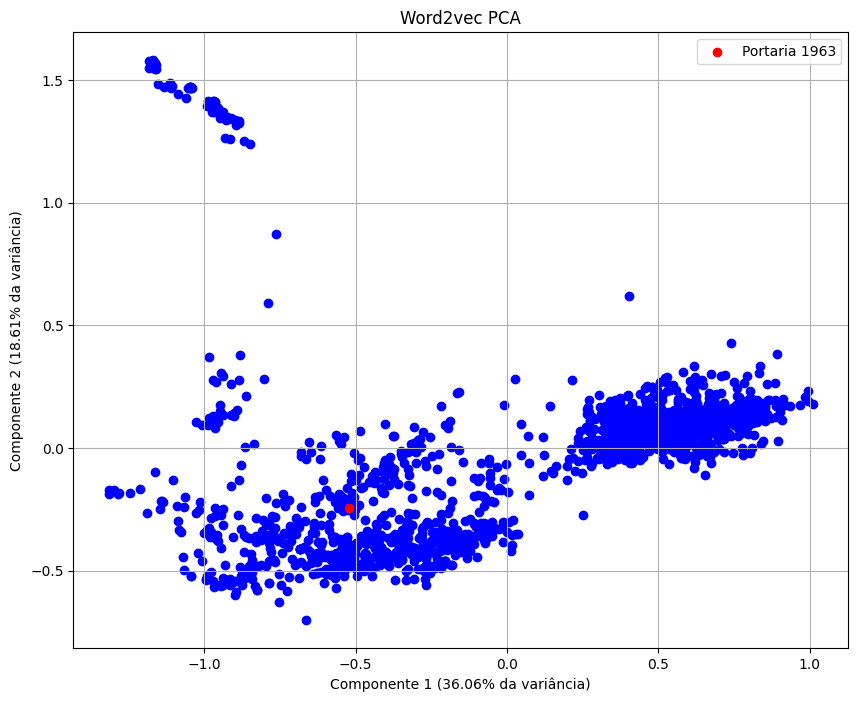


Total da Variância Explicada = 54.67 %


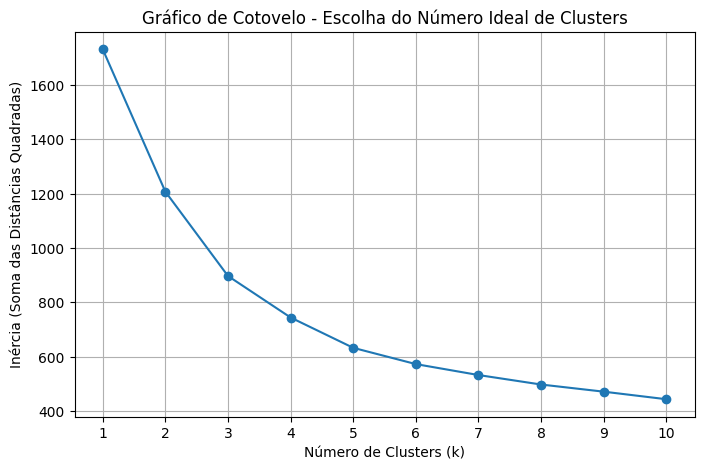

<ipython-input-25-e3a55685c2aa>:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cores = plt.cm.get_cmap("tab10", n_clusters)


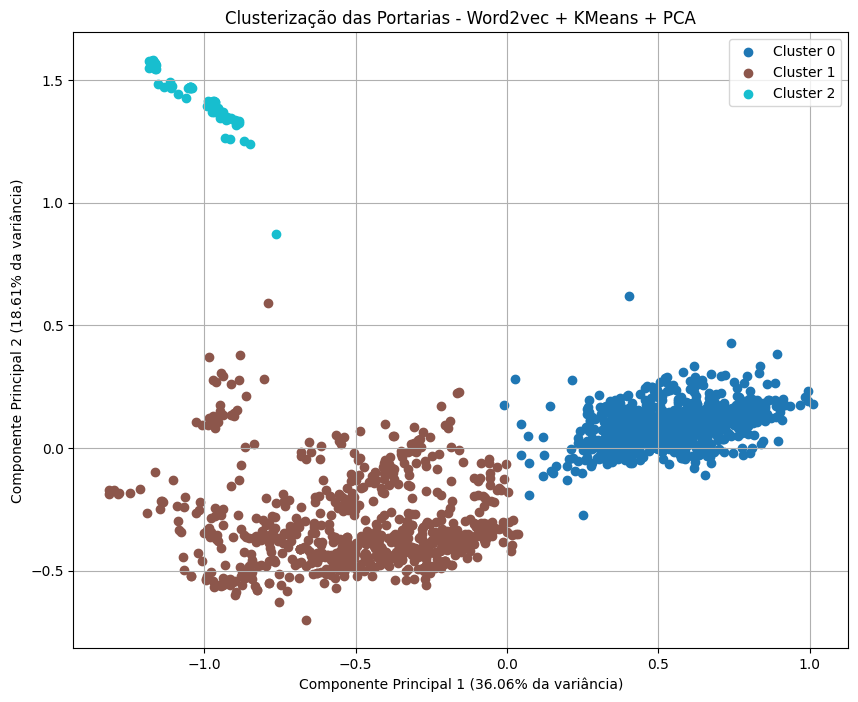


Total da Variância Explicada = 54.67 %


In [25]:
# 5. Similaridade
# 5.2  Word2vec
# 5.1.1 PCA

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Portaria exemplo
numero_desejado = "1963"

if numero_desejado not in vetores_Word2vec:
    print(f"Portaria {numero_desejado} não encontrada (está ausente no conjunto de dados).")
else:
    vetor_exemplo = vetores_Word2vec[numero_desejado]

    # Calcular Similaridade Cosseno com todas as outras portarias
    todos_numeros = list(vetores_Word2vec.keys())
    todos_vetores = np.array([vetores_Word2vec[num] for num in todos_numeros])

    similaridades = cosine_similarity([vetor_exemplo], todos_vetores)[0]

    # Obter as mais 10 semelhantes (exceto ela mesma)
    indices_ordenados = np.argsort(similaridades)[::-1]
    indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado][:10]

    print(f"\nPortaria de exemplo: {numero_desejado}")
    print("Texto:", " ".join(portarias_processadas[numero_desejado]["conteudo"]))

    print("\n Portarias mais semelhantes:")
    for i, idx in enumerate(indices_mais_proximos):
        num_similar = todos_numeros[idx]
        print(f"{i+1}. Portaria {num_similar} - Similaridade: {similaridades[idx]:.4f}")

    # Visualização com PCA devido a alta dimensão
    vetores_vis = np.array([vetores_Word2vec[numero_desejado]] + [vetores_Word2vec[todos_numeros[idx]] for idx in indices_mais_proximos])
    pca = PCA(n_components=2)
    vetores_reduzidos = pca.fit_transform(vetores_vis)

    # Variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_ * 100  # porcentagem

    plt.figure(figsize=(10, 8))
    plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
    plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')

    # Adicionar rótulos nos pontos
    plt.annotate(f"Portaria {numero_desejado}", (vetores_reduzidos[0, 0], vetores_reduzidos[0, 1]))
    for i, idx in enumerate(indices_mais_proximos):
        plt.annotate(f"{todos_numeros[idx]}", (vetores_reduzidos[i+1, 0], vetores_reduzidos[i+1, 1]))

    # Eixos com variância explicada
    plt.xlabel(f"Componente 1 ({var_exp[0]:.2f}% da variância)")
    plt.ylabel(f"Componente 2 ({var_exp[1]:.2f}% da variância)")

    plt.title(f"10 Portarias mais similares a {numero_desejado} - Word2vec PCA")
    plt.grid(True)
    plt.legend()
    plt.show()

    print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

    # Todas as portarias

    # Visualização com PCA devido a alta dimensão
    indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado]
    vetores_vis = np.array([vetores_Word2vec[numero_desejado]] + [vetores_Word2vec[todos_numeros[idx]] for idx in indices_mais_proximos])
    pca = PCA(n_components=2)
    vetores_reduzidos = pca.fit_transform(vetores_vis)

    # Variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_ * 100  # porcentagem

    plt.figure(figsize=(10, 8))
    plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
    plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')


    # Eixos com variância explicada
    plt.xlabel(f"Componente 1 ({var_exp[0]:.2f}% da variância)")
    plt.ylabel(f"Componente 2 ({var_exp[1]:.2f}% da variância)")

    plt.title(f"Word2vec PCA")
    plt.grid(True)
    plt.legend()
    plt.show()

    print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

# 5.2 Word2vec
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Vetores e índices já existentes
numeros_portarias = list(vetores_Word2vec.keys())
matriz_vetores = np.array([vetores_Word2vec[num] for num in numeros_portarias])

# Gerar gráfico de cotovelo - número ideal de clusters
inertias = []
intervalo_clusters = range(1, 11)

for k in intervalo_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(matriz_vetores)
    inertias.append(kmeans.inertia_)

# Plot do gráfico de cotovelo
plt.figure(figsize=(8, 5))
plt.plot(intervalo_clusters, inertias, marker='o')
plt.title("Gráfico de Cotovelo - Escolha do Número Ideal de Clusters")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Inércia (Soma das Distâncias Quadradas)")
plt.xticks(intervalo_clusters)
plt.grid(True)
plt.show()

# Escolher o número de clusters
n_clusters = 3

# Aplicar KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
rotulos = kmeans.fit_predict(matriz_vetores)

# Agrupar portarias por cluster
clusters = {i: [] for i in range(n_clusters)}
for num, r in zip(numeros_portarias, rotulos):
    clusters[r].append(num)

# Visualização dos clusters com PCA
pca = PCA(n_components=2)
vetores_reduzidos = pca.fit_transform(matriz_vetores)

# Variância explicada por componente
var_exp = pca.explained_variance_ratio_ * 100  # em porcentagem

plt.figure(figsize=(10, 8))
cores = plt.cm.get_cmap("tab10", n_clusters)

for i in range(n_clusters):
    idxs = [j for j, label in enumerate(rotulos) if label == i]
    plt.scatter(
        vetores_reduzidos[idxs, 0],
        vetores_reduzidos[idxs, 1],
        label=f"Cluster {i}",
        color=cores(i)
    )

plt.title("Clusterização das Portarias - Word2vec + KMeans + PCA")
plt.xlabel(f"Componente Principal 1 ({var_exp[0]:.2f}% da variância)")
plt.ylabel(f"Componente Principal 2 ({var_exp[1]:.2f}% da variância)")
plt.legend()
plt.grid(True)
plt.show()

print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")


In [26]:
# 5.2  Word2vec
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

from itertools import zip_longest
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Visualizar clusters em formato de tabela

# Obtem os IDs dos clusters e os valores (listas de portarias)
cluster_ids = list(clusters.keys())
cluster_values = list(clusters.values())

# Usa zip_longest para "transpor" as listas com preenchimento vazio
for i, row in enumerate(zip_longest(*cluster_values, fillvalue="")):
    row_str = "\t".join(f"Portaria {val}" if val != "" else "" for val in row)
    if i == 0:
        header = "\t".join(f"Cluster {i} ({len(clusters[i])})" for i in cluster_ids)
        print(header)
        print("-" * len(header.expandtabs()))
    print(row_str)

# Mudanças entre os Cluster 0 (876) e o Cluster 1 (728)	em relação ao Embeddings feito com FastText

Cluster 0 (876)	Cluster 1 (731)	Cluster 2 (100)
-----------------------------------------------
Portaria 1933	Portaria 1963	Portaria 1942
Portaria 1904	Portaria 1962	Portaria 1940
Portaria 1868	Portaria 1961	Portaria 1939
Portaria 1826	Portaria 1960	Portaria 1900
Portaria 1825	Portaria 1959	Portaria 1899
Portaria 1813	Portaria 1958	Portaria 1886
Portaria 1803	Portaria 1957	Portaria 1885
Portaria 1788	Portaria 1956	Portaria 1872
Portaria 1752	Portaria 1955	Portaria 1871
Portaria 1707	Portaria 1954	Portaria 1863
Portaria 1670	Portaria 1953	Portaria 1862
Portaria 1617	Portaria 1952	Portaria 1840
Portaria 1577	Portaria 1951	Portaria 1839
Portaria 1576	Portaria 1950	Portaria 1834
Portaria 1575	Portaria 1949	Portaria 1833
Portaria 1544	Portaria 1948	Portaria 1816
Portaria 1543	Portaria 1947	Portaria 1815
Portaria 1542	Portaria 1946	Portaria 1792
Portaria 1539	Portaria 1945	Portaria 1791
Portaria 1537	Portaria 1944	Portaria 1765
Portaria 1534	Portaria 1943	Portaria 1764
Portaria 1532	Portaria

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


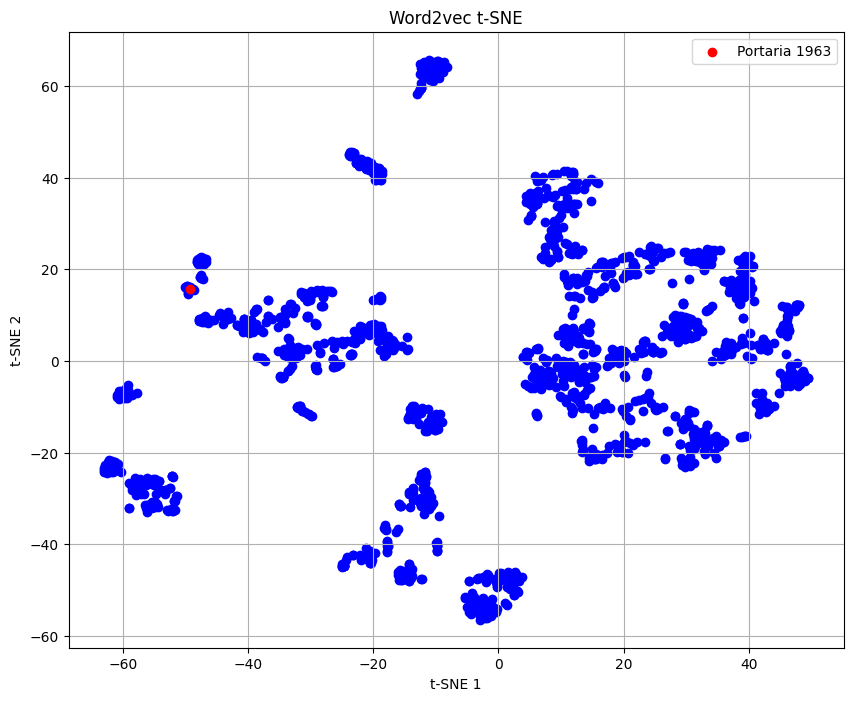

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
<ipython-input-27-ca9ed3355d75>:60: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cores = plt.cm.get_cmap("tab10", n_clusters)


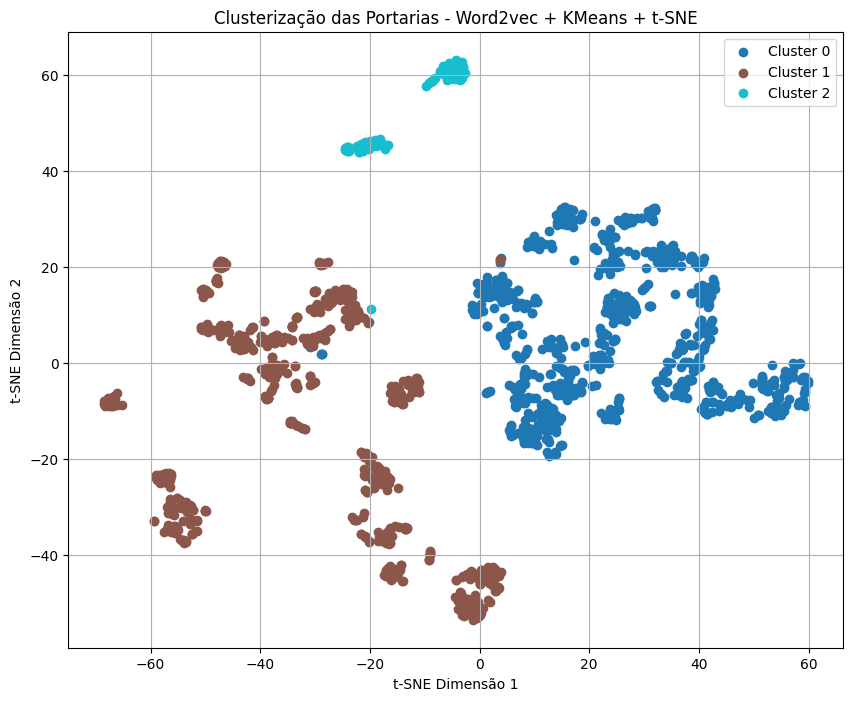

In [27]:
# 5. Similaridade
# 5.2  Word2vec
# 5.1.2 t-SNE

from sklearn.manifold import TSNE

# Visualização com t-SNE - todos

indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado]
vetores_vis = np.array([vetores_Word2vec[numero_desejado]] + [vetores_Word2vec[todos_numeros[idx]] for idx in indices_mais_proximos])

# t-SNE (perplexity pode ser ajustada para diferentes visualizações)
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
vetores_reduzidos = tsne.fit_transform(vetores_vis)

# Visualização
plt.figure(figsize=(10, 8))
plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')

# Adicionar rótulos
#plt.annotate(f"Portaria {numero_desejado}", (vetores_reduzidos[0, 0], vetores_reduzidos[0, 1]))
#for i, idx in enumerate(indices_mais_proximos):
#    plt.annotate(f"{todos_numeros[idx]}", (vetores_reduzidos[i+1, 0], vetores_reduzidos[i+1, 1]))

plt.title(f"Word2vec t-SNE")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True)
plt.legend()
plt.show()

# 5.2  Word2vec
# 6.    Clusterização
# 6.1   KMeans
# 6.1.2 T-SNE (t-Distributed Stochastic Neighbor Embedding)

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# Vetores e índices
numeros_portarias = list(vetores_Word2vec.keys())
matriz_vetores = np.array([vetores_Word2vec[num] for num in numeros_portarias])

# Determinar o número de clusters (Ajuste com base no gráfico de cotovelo anterior)
n_clusters = 3

# Aplicar KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
rotulos = kmeans.fit_predict(matriz_vetores)

# Visualizar com t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
vetores_tsne = tsne.fit_transform(matriz_vetores)

# Plotando os clusters com t-SNE
plt.figure(figsize=(10, 8))
cores = plt.cm.get_cmap("tab10", n_clusters)

for i in range(n_clusters):
    idxs = [j for j, label in enumerate(rotulos) if label == i]
    plt.scatter(
        vetores_tsne[idxs, 0],
        vetores_tsne[idxs, 1],
        label=f"Cluster {i}",
        color=cores(i)
    )

plt.title("Clusterização das Portarias - Word2vec + KMeans + t-SNE")
plt.xlabel("t-SNE Dimensão 1")
plt.ylabel("t-SNE Dimensão 2")
plt.legend()
plt.grid(True)
plt.show()



Portaria de exemplo: 1963
Texto: presidente tribunal justica distrito federal territorios uso atribuicoes legais termos provimentogeral corregedoria aplicado servicos notariais registro vista contido processo sei resolve exonerar pedido claudia cruz cerquinho oliveira cargo juiza paz suplente oficio registro civil titulos documentos pessoas juridicas paranoa partir dezembro declarar vago cargo juiz paz suplente oficio registro civil titulos documentos pessoas juridicas paranoa preenchido mediante remocao juizes paz suplentes exercicio distrito federal paragrafo unico interessados deverao requerer inscricao prazo dias contar publicacao portaria portaria entra vigor data publicacao

 Portarias mais semelhantes:
1. Portaria 489 - Similaridade: 0.9125
2. Portaria 1951 - Similaridade: 0.9041
3. Portaria 1709 - Similaridade: 0.9006
4. Portaria 1033 - Similaridade: 0.8991
5. Portaria 1767 - Similaridade: 0.8972
6. Portaria 1598 - Similaridade: 0.8942
7. Portaria 1766 - Similaridade: 0.8852
8

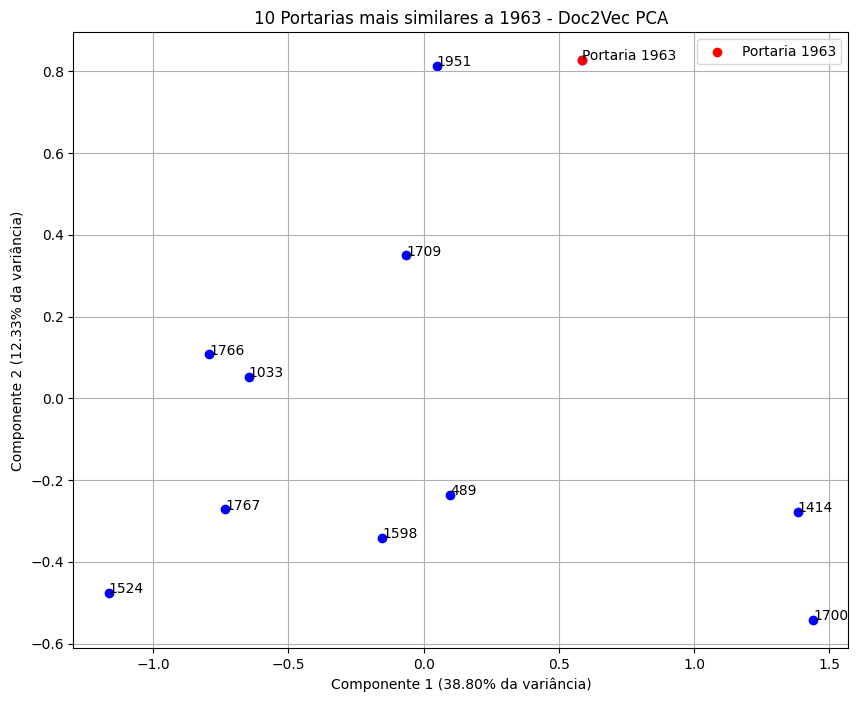


Total da Variância Explicada = 51.13 %


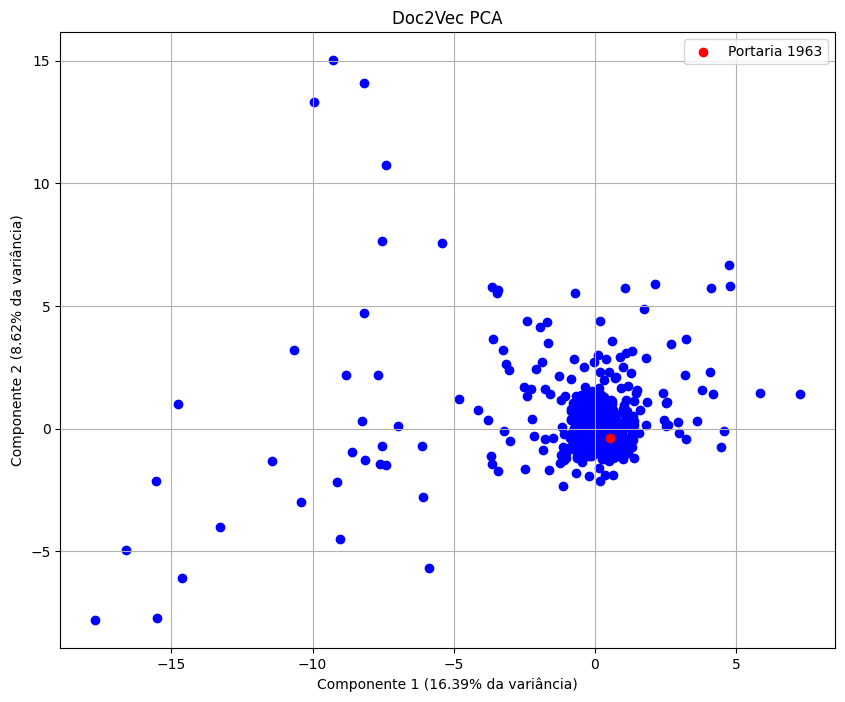


Total da Variância Explicada = 25.01 %


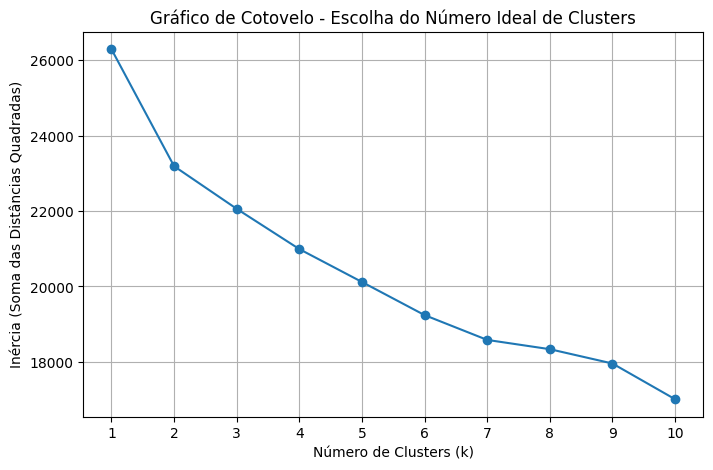

<ipython-input-28-b1963089b102>:144: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cores = plt.cm.get_cmap("tab10", n_clusters)


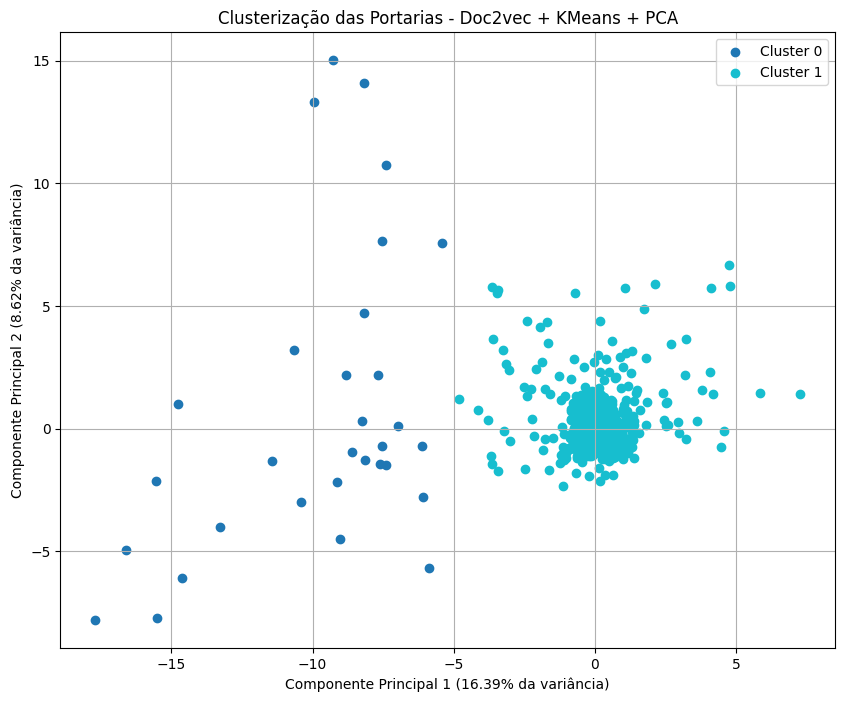


Total da Variância Explicada = 25.01 %


In [28]:
# 5. Similaridade
# 5.3 Doc2Vec
# 5.1.1 PCA

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Portaria exemplo
numero_desejado = "1963"

if numero_desejado not in vetores_doc2vec:
    print(f"Portaria {numero_desejado} não encontrada (está ausente no conjunto de dados).")
else:
    vetor_exemplo = vetores_doc2vec[numero_desejado]

    # Calcular Similaridade Cosseno com todas as outras portarias
    todos_numeros = list(vetores_doc2vec.keys())
    todos_vetores = np.array([vetores_doc2vec[num] for num in todos_numeros])

    similaridades = cosine_similarity([vetor_exemplo], todos_vetores)[0]

    # Obter as mais 10 semelhantes (exceto ela mesma)
    indices_ordenados = np.argsort(similaridades)[::-1]
    indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado][:10]

    print(f"\nPortaria de exemplo: {numero_desejado}")
    print("Texto:", " ".join(portarias_processadas[numero_desejado]["conteudo"]))

    print("\n Portarias mais semelhantes:")
    for i, idx in enumerate(indices_mais_proximos):
        num_similar = todos_numeros[idx]
        print(f"{i+1}. Portaria {num_similar} - Similaridade: {similaridades[idx]:.4f}")

    # Visualização com PCA devido a alta dimensão
    vetores_vis = np.array([vetores_doc2vec[numero_desejado]] + [vetores_doc2vec[todos_numeros[idx]] for idx in indices_mais_proximos])
    pca = PCA(n_components=2)
    vetores_reduzidos = pca.fit_transform(vetores_vis)

    # Variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_ * 100  # porcentagem

    plt.figure(figsize=(10, 8))
    plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
    plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')

    # Adicionar rótulos nos pontos
    plt.annotate(f"Portaria {numero_desejado}", (vetores_reduzidos[0, 0], vetores_reduzidos[0, 1]))
    for i, idx in enumerate(indices_mais_proximos):
        plt.annotate(f"{todos_numeros[idx]}", (vetores_reduzidos[i+1, 0], vetores_reduzidos[i+1, 1]))

    # Eixos com variância explicada
    plt.xlabel(f"Componente 1 ({var_exp[0]:.2f}% da variância)")
    plt.ylabel(f"Componente 2 ({var_exp[1]:.2f}% da variância)")

    plt.title(f"10 Portarias mais similares a {numero_desejado} - Doc2Vec PCA")
    plt.grid(True)
    plt.legend()
    plt.show()

    print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

    # Todas as portarias

    # Visualização com PCA devido a alta dimensão
    indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado]
    vetores_vis = np.array([vetores_doc2vec[numero_desejado]] + [vetores_doc2vec[todos_numeros[idx]] for idx in indices_mais_proximos])
    pca = PCA(n_components=2)
    vetores_reduzidos = pca.fit_transform(vetores_vis)

    # Variância explicada por cada componente
    var_exp = pca.explained_variance_ratio_ * 100  # porcentagem

    plt.figure(figsize=(10, 8))
    plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
    plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')


    # Eixos com variância explicada
    plt.xlabel(f"Componente 1 ({var_exp[0]:.2f}% da variância)")
    plt.ylabel(f"Componente 2 ({var_exp[1]:.2f}% da variância)")

    plt.title(f"Doc2Vec PCA")
    plt.grid(True)
    plt.legend()
    plt.show()

    print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")

# 5.3 Doc2vec
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Vetores e índices já existentes
numeros_portarias = list(vetores_doc2vec.keys())
matriz_vetores = np.array([vetores_doc2vec[num] for num in numeros_portarias])

# Gerar gráfico de cotovelo - número ideal de clusters
inertias = []
intervalo_clusters = range(1, 11)

for k in intervalo_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(matriz_vetores)
    inertias.append(kmeans.inertia_)

# Plot do gráfico de cotovelo
plt.figure(figsize=(8, 5))
plt.plot(intervalo_clusters, inertias, marker='o')
plt.title("Gráfico de Cotovelo - Escolha do Número Ideal de Clusters")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Inércia (Soma das Distâncias Quadradas)")
plt.xticks(intervalo_clusters)
plt.grid(True)
plt.show()

# Escolher o número de clusters
n_clusters = 2

# Aplicar KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
rotulos = kmeans.fit_predict(matriz_vetores)

# Agrupar portarias por cluster
clusters = {i: [] for i in range(n_clusters)}
for num, r in zip(numeros_portarias, rotulos):
    clusters[r].append(num)

# Visualização dos clusters com PCA
pca = PCA(n_components=2)
vetores_reduzidos = pca.fit_transform(matriz_vetores)

# Variância explicada por componente
var_exp = pca.explained_variance_ratio_ * 100  # em porcentagem

plt.figure(figsize=(10, 8))
cores = plt.cm.get_cmap("tab10", n_clusters)

for i in range(n_clusters):
    idxs = [j for j, label in enumerate(rotulos) if label == i]
    plt.scatter(
        vetores_reduzidos[idxs, 0],
        vetores_reduzidos[idxs, 1],
        label=f"Cluster {i}",
        color=cores(i)
    )

plt.title("Clusterização das Portarias - Doc2vec + KMeans + PCA")
plt.xlabel(f"Componente Principal 1 ({var_exp[0]:.2f}% da variância)")
plt.ylabel(f"Componente Principal 2 ({var_exp[1]:.2f}% da variância)")
plt.legend()
plt.grid(True)
plt.show()

print(f"\nTotal da Variância Explicada = {(var_exp[0] + var_exp[1]):.2f} %")


In [29]:
# 5.3  Doc2vec
# 6. Clusterização
# 6.1 K-means
# 6.1.1 PCA

from itertools import zip_longest

# Visualizar clusters em formato de tabela

# Obtem os IDs dos clusters e os valores (listas de portarias)
cluster_ids = list(clusters.keys())
cluster_values = list(clusters.values())

# Usa zip_longest para "transpor" as listas com preenchimento vazio
for i, row in enumerate(zip_longest(*cluster_values, fillvalue="")):
    row_str = "\t".join(f"Portaria {val}" if val != "" else "" for val in row)
    if i == 0:
        header = "\t".join(f"Cluster {i} ({len(clusters[i])})" for i in cluster_ids)
        print(header)
        print("-" * len(header.expandtabs()))
    print(row_str)


Cluster 0 (31)	Cluster 1 (1676)
--------------------------------
Portaria 1962	Portaria 1963
Portaria 1907	Portaria 1961
Portaria 1905	Portaria 1960
Portaria 1842	Portaria 1959
Portaria 1795	Portaria 1958
Portaria 1790	Portaria 1957
Portaria 1759	Portaria 1956
Portaria 1745	Portaria 1955
Portaria 1720	Portaria 1954
Portaria 1584	Portaria 1953
Portaria 1583	Portaria 1952
Portaria 1574	Portaria 1951
Portaria 1545	Portaria 1950
Portaria 1497	Portaria 1949
Portaria 1439	Portaria 1948
Portaria 1424	Portaria 1947
Portaria 1404	Portaria 1946
Portaria 1391	Portaria 1945
Portaria 1380	Portaria 1944
Portaria 1237	Portaria 1943
Portaria 1235	Portaria 1942
Portaria 1193	Portaria 1940
Portaria 1186	Portaria 1939
Portaria 1147	Portaria 1938
Portaria 983	Portaria 1937
Portaria 862	Portaria 1936
Portaria 797	Portaria 1935
Portaria 711	Portaria 1934
Portaria 493	Portaria 1933
Portaria 354	Portaria 1932
Portaria 268	Portaria 1931
	Portaria 1930
	Portaria 1929
	Portaria 1927
	Portaria 1926
	Portaria 1925

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


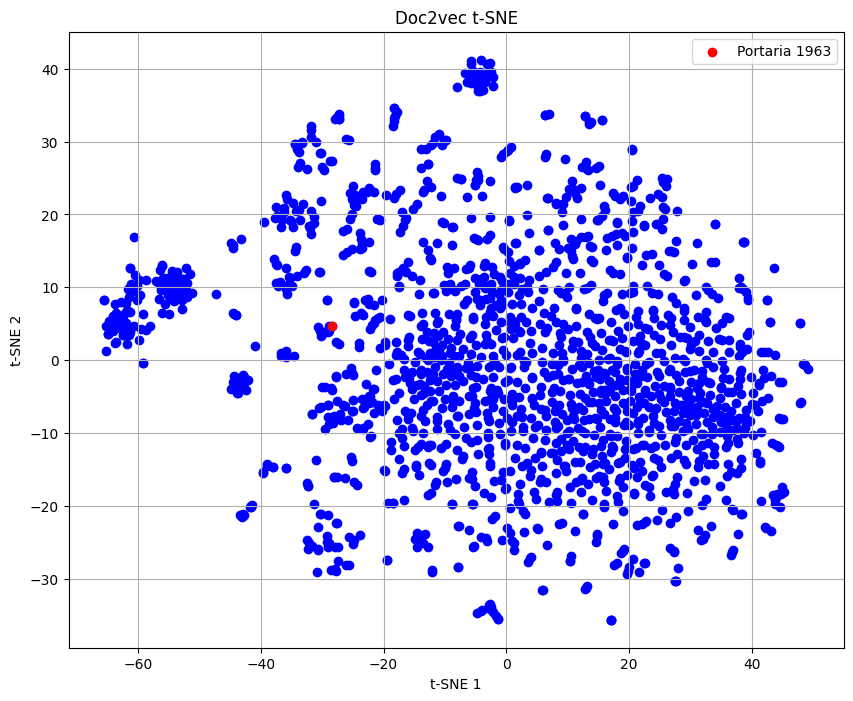

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
<ipython-input-30-5b408078c2cd>:60: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cores = plt.cm.get_cmap("tab10", n_clusters)


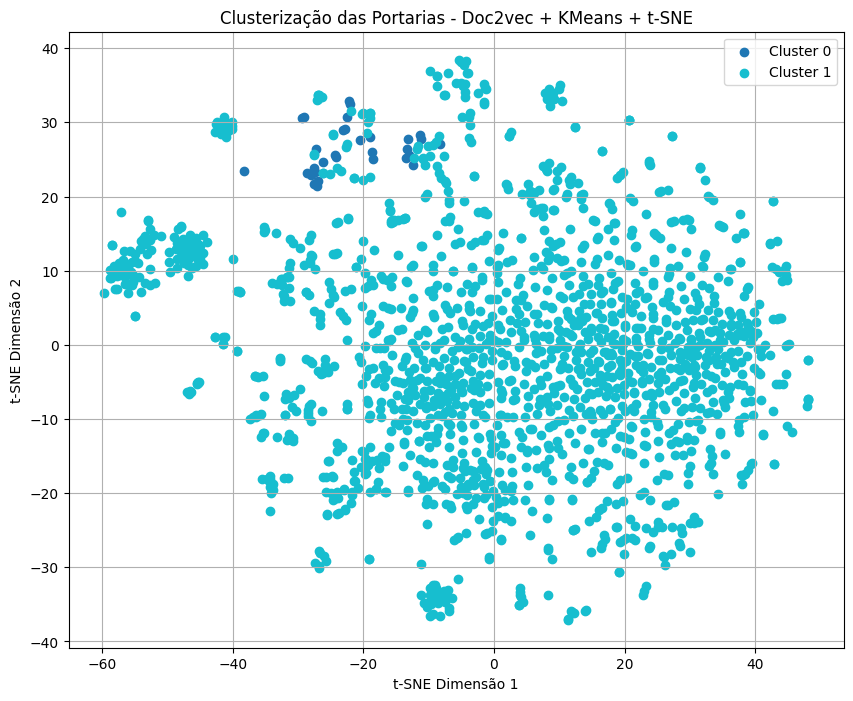

In [30]:
# 5. Similaridade
# 5.3  Doc2vec
# 5.1.2 t-SNE

from sklearn.manifold import TSNE

# Visualização com t-SNE - todos

indices_mais_proximos = [idx for idx in indices_ordenados if todos_numeros[idx] != numero_desejado]
vetores_vis = np.array([vetores_doc2vec[numero_desejado]] + [vetores_doc2vec[todos_numeros[idx]] for idx in indices_mais_proximos])

# t-SNE (perplexity pode ser ajustada para diferentes visualizações)
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
vetores_reduzidos = tsne.fit_transform(vetores_vis)

# Visualização
plt.figure(figsize=(10, 8))
plt.scatter(vetores_reduzidos[:, 0], vetores_reduzidos[:, 1], color='blue')
plt.scatter(vetores_reduzidos[0, 0], vetores_reduzidos[0, 1], color='red', label=f'Portaria {numero_desejado}')

# Adicionar rótulos
#plt.annotate(f"Portaria {numero_desejado}", (vetores_reduzidos[0, 0], vetores_reduzidos[0, 1]))
#for i, idx in enumerate(indices_mais_proximos):
#    plt.annotate(f"{todos_numeros[idx]}", (vetores_reduzidos[i+1, 0], vetores_reduzidos[i+1, 1]))

plt.title(f"Doc2vec t-SNE")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True)
plt.legend()
plt.show()

# 5.3  Doc2vec
# 6.    Clusterização
# 6.1   KMeans
# 6.1.2 T-SNE (t-Distributed Stochastic Neighbor Embedding)

from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# Vetores e índices
numeros_portarias = list(vetores_doc2vec.keys())
matriz_vetores = np.array([vetores_doc2vec[num] for num in numeros_portarias])

# Determinar o número de clusters (Ajuste com base no gráfico de cotovelo anterior)
n_clusters = 2

# Aplicar KMeans
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
rotulos = kmeans.fit_predict(matriz_vetores)

# Visualizar com t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
vetores_tsne = tsne.fit_transform(matriz_vetores)

# Plotando os clusters com t-SNE
plt.figure(figsize=(10, 8))
cores = plt.cm.get_cmap("tab10", n_clusters)

for i in range(n_clusters):
    idxs = [j for j, label in enumerate(rotulos) if label == i]
    plt.scatter(
        vetores_tsne[idxs, 0],
        vetores_tsne[idxs, 1],
        label=f"Cluster {i}",
        color=cores(i)
    )

plt.title("Clusterização das Portarias - Doc2vec + KMeans + t-SNE")
plt.xlabel("t-SNE Dimensão 1")
plt.ylabel("t-SNE Dimensão 2")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
!python -m spacy download pt_core_news_lg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.2/568.2 MB 3.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
pip install transformers datasets seqeval

In [ ]:
# 7. Reconhecimento de Entidades Nomeadas - Fastext
# Aprendizado com Transferência - Transfer Learning
# Semi-supervisionado ou active learning
# Anotação

# Amostragem estratificada entre clusteres ->  Anotar  20% (~341) documentos

import random

# Define a semente para reprodutibilidade
random.seed(42)

# Define a proporção da amostra
proporcao_amostra = 0.2

# Dicionário para armazenar a amostra estratificada
amostra_estratificada = {}

# Percorre cada cluster e realiza a amostragem
for cluster_id, portarias in clusters.items():
    tamanho_amostra = max(1, int(len(portarias) * proporcao_amostra))
    amostra = random.sample(portarias, tamanho_amostra)
    amostra_estratificada[cluster_id] = amostra

# Exibir a amostra estratificada
print("\nAmostra Estratificada (~20% por cluster):\n")
for cluster_id, portarias in amostra_estratificada.items():
    print(f"Cluster {cluster_id} ({len(portarias)} portarias): {portarias}")



Amostra Estratificada (~20% por cluster):

Cluster 0 (179 portarias): ['649', '926', '725', '834', '328', '1131', '1098', '820', '170', '71', '475', '768', '476', '405', '1226', '276', '1670', '76', '567', '1269', '212', '211', '223', '915', '932', '1233', '1221', '1263', '617', '25', '1486', '732', '618', '53', '779', '841', '523', '255', '84', '33', '850', '1220', '579', '852', '676', '726', '1262', '993', '344', '331', '259', '882', '692', '1088', '767', '905', '1167', '1178', '231', '916', '220', '141', '1230', '435', '245', '233', '178', '197', '538', '427', '633', '1542', '1034', '810', '1084', '410', '138', '185', '415', '556', '736', '317', '473', '795', '1066', '906', '1022', '1228', '522', '1081', '791', '880', '497', '807', '1308', '183', '485', '1129', '118', '228', '597', '490', '434', '134', '1244', '54', '1071', '730', '615', '1423', '325', '398', '1575', '1526', '546', '1095', '310', '296', '157', '688', '814', '95', '756', '248', '594', '699', '1539', '1162', '164', '

In [20]:
# 7. Reconhecimento de Entidades Nomeadas - Fastext
# Aprendizado com Transferência - Transfer Learning
# Semi-supervisionado ou active learning
# Anotação

# Amostragem estratificada entre clusteres ->  Anotar  + 20% (~341) documentos

 # Amostra Estratificada (~20% por cluster):

import random

# Define a semente para reprodutibilidade
random.seed(42)

# 1. Contar e imprimir quantidade de documentos anotados por cluster
print("\nQuantidade de documentos anotados por cluster (presentes em labels_ren_resumo):\n")

quantidade_anotados_por_cluster = {}

for cluster_id, portarias in clusters.items():
    # Interseção entre portarias do cluster e labels_ren_resumo
    anotadas = set(portarias).intersection(set(labels_ren_resumo.keys()))
    quantidade = len(anotadas)
    quantidade_anotados_por_cluster[cluster_id] = quantidade
    print(f"Cluster {cluster_id}: {quantidade} documentos anotados")

# 2. Realizar nova amostragem estratificada (~20%), evitando documentos já anotados

proporcao_amostra_nova = 0.2
nova_amostra_estratificada = {}

print("\nNova Amostra Estratificada (~10% por cluster), excluindo já anotados:\n")

for cluster_id, portarias in clusters.items():
    # Remover documentos já anotados
    portarias_disponiveis = list(set(portarias) - set(labels_ren_resumo.keys()))

    # Tamanho da nova amostra (~10% ou no mínimo 1)
    tamanho_amostra = max(1, int(len(portarias) * proporcao_amostra_nova))

    # Ajustar se houver menos portarias disponíveis do que o tamanho da amostra
    tamanho_amostra = min(tamanho_amostra, len(portarias_disponiveis))

    # Amostragem
    if tamanho_amostra > 0:
        nova_amostra = random.sample(portarias_disponiveis, tamanho_amostra)
    else:
        nova_amostra = []  # Nenhum disponível

    nova_amostra_estratificada[cluster_id] = nova_amostra

    print(f"Cluster {cluster_id} ({len(nova_amostra)} portarias): {nova_amostra}")




Quantidade de documentos anotados por cluster (presentes em labels_ren_resumo):

Cluster 0: 142 documentos anotados
Cluster 1: 178 documentos anotados
Cluster 2: 20 documentos anotados

Nova Amostra Estratificada (~10% por cluster), excluindo já anotados:

Cluster 0 (143 portarias): ['1667', '1650', '1624', '1388', '1492', '1494', '1878', '1571', '1668', '1894', '1594', '1772', '766', '1581', '545', '1641', '1945', '1807', '696', '844', '1695', '1794', '1139', '1392', '712', '985', '1517', '818', '1929', '761', '510', '1811', '662', '748', '1873', '749', '1227', '1706', '1439', '1910', '29', '1763', '1123', '1434', '1935', '1655', '1561', '1314', '1396', '1141', '1464', '1704', '1958', '1936', '1712', '1625', '247', '1779', '822', '1943', '516', '1633', '1648', '1616', '481', '387', '1736', '717', '1498', '1556', '1869', '1916', '561', '1619', '21', '1674', '357', '1555', '50', '1425', '1632', '1909', '637', '1062', '668', '194', '1672', '1690', '1882', '1905', '1250', '739', '670', '

In [ ]:
# 7. Reconhecimento de Entidades Nomeadas
# Aprendizado com Transferência - Transfer Learning
# Semi-supervisionado ou active learning -> Fine-tuning

# Doccano -> Anotação
# Fine Tunig -> Anotar % documentos -> Dividir esse subconjunto em: 70% para treino; 15% para validação; 15% para teste
# Avaliar Performance


In [8]:
# 7. Reconhecimento de Entidades Nomeadas
# Aprendizado com Transferência - Transfer Learning

# Carregar Dados Anotados
# Carregar labels adicionados manualmente - Dados Anotados

# NÃO ESTÁ SENDO USADO

from google.colab import drive
import json
import os

# Montar o Google Drive
drive.mount('/content/drive')

# Caminho do arquivo
# Mudar para labels_ren
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/labels_ren.json"

# Verifica se o arquivo existe
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        labels_ren = json.load(f)

    print("✅ Dados carregados")
else:
    print("O arquivo não foi encontrado.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Dados carregados


In [37]:
# 7. Reconhecimento de Entidades Nomeadas
# Aprendizado com Transferência - Transfer Learning

# Carregar labels adicionados manualmente - Dados Anotados
# Resumo portarias

from google.colab import drive
import json
import os

# Montar o Google Drive
drive.mount('/content/drive')

# Caminho do arquivo
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/labels_ren_resumo.json"

# Verifica se o arquivo existe
if os.path.exists(caminho_arquivo):
    with open(caminho_arquivo, "r", encoding="utf-8") as f:
        labels_ren_resumo = json.load(f)

    print("✅ Dados carregados")
else:
    print("O arquivo não foi encontrado.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Dados carregados


In [ ]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 11.3 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.2
    Uninstalling fsspec-2025.3.2:
      Successfully uninstalled fsspec-2025.3.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2025.3.2 requires fsspec==2025.3.2, but you have fsspec 2024.12.0 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which i

In [ ]:
!pip install torch torchvision torchcrf scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 63.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 53.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 37.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlink

In [ ]:
!pip install torchcrf

In [ ]:
!pip install git+https://github.com/kmkurn/pytorch-crf.git

  Cloning https://github.com/kmkurn/pytorch-crf.git to /tmp/pip-req-build-tcrpjt4e
  Running command git clone --filter=blob:none --quiet https://github.com/kmkurn/pytorch-crf.git /tmp/pip-req-build-tcrpjt4e
  Resolved https://github.com/kmkurn/pytorch-crf.git to commit 623e3402d00a2728e99d6e8486010d67c754267b
  Preparing metadata (setup.py) ... done
  Created wheel for pytorch-crf: filename=pytorch_crf-0.7.2-py3-none-any.whl size=6410 sha256=4e7c89f4de0f242cafbf22851015749a6d8c9867f021b99de76189ba98fdbc3b
  Stored in directory: /tmp/pip-ephem-wheel-cache-3j1qja5j/wheels/fd/83/cc/f11543939f8911b8dcff86e2bd54423e21f779d0938958cc7f
Successfully built pytorch-crf


In [ ]:
!pip install tensorflow scikit-learn numpy

In [ ]:
!pip install tensorflow-addons

In [ ]:
!pip install --upgrade --no-cache-dir tensorflow==2.16.1 keras==3.3.3
!pip install --no-cache-dir git+https://github.com/tensorflow/addons.git@r0.23.0

  Cloning https://github.com/tensorflow/addons.git (to revision r0.23.0) to /tmp/pip-req-build-rpfj1mnh
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/addons.git /tmp/pip-req-build-rpfj1mnh
  Running command git checkout -q r0.23.0
  error: pathspec 'r0.23.0' did not match any file(s) known to git
  error: subprocess-exited-with-error
  
  × git checkout -q r0.23.0 did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: subprocess-exited-with-error

× git checkout -q r0.23.0 did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [26]:
!pip install seqeval

In [29]:
#  7. Reconhecimento de Entidades Nomeadas
#  7.1 BiLSTM

import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import TimeDistributed, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Bidirectional, LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import re
import spacy
nlp = spacy.blank("pt")


# Função para tokenizar texto
def spacy_tokenize(text):
    doc = nlp(text)
    return [token.text.strip() for token in doc]

# Função para atribuir labels a cada token

def tokenize_and_align_labels(entry):
    text = entry["text"]
    annotations = entry["labels"]

    tokens = spacy_tokenize(text)
    labels = ["O"] * len(tokens)  # Inicializa tudo como "O" (Não entidades)

    for ann in annotations:
        ann_text = ann["text"]
        ann_label = ann["label"]

        # Tokeniza o texto anotado
        ann_tokens = spacy_tokenize(ann_text)

        # Procura onde a sequência de tokens anotados aparece
        for i in range(len(tokens) - len(ann_tokens) + 1):
            if tokens[i:i+len(ann_tokens)] == ann_tokens:
                for j in range(len(ann_tokens)):
                    labels[i+j] = ann_label
                break  # Evita duplicar

    return tokens, labels

# Pré-processamento completo
def preprocess_data(labels_ren_resumo):
    X = []
    y = []

    for key, entry in labels_ren_resumo.items():
        tokens, labels_seq = tokenize_and_align_labels(entry)
        X.append(tokens)
        y.append(labels_seq)

    return X, y

# Aplicacao
X_tokens, y_labels = preprocess_data(labels_ren_resumo)

# Criar vocabulários

all_tokens = set(token for tokens in X_tokens for token in tokens)
all_labels = set(label for labels in y_labels for label in labels)

word2idx = {word: idx+2 for idx, word in enumerate(all_tokens)}
word2idx["<PAD>"] = 0
word2idx["<UNK>"] = 1

#label2idx = {label: idx for idx, label in enumerate(all_labels)}

label2idx = {label: idx for idx, label in enumerate(sorted(all_labels.union({"PAD"})))}
idx2label = {idx: label for label, idx in label2idx.items()}


embedding_dim = len(next(iter(vetores_fasttext_resumo.values())))
embedding_matrix = np.zeros((len(word2idx), embedding_dim))

for word, idx in word2idx.items():
    if word in vetores_fasttext_resumo:
        embedding_matrix[idx] = vetores_fasttext_resumo[word]
    else:
        embedding_matrix[idx] = np.random.normal(scale=0.6, size=(embedding_dim,))


# Converte tokens e labels em índices
max_len = max(len(seq) for seq in X_tokens)

X_seq = [[word2idx.get(token, word2idx["<UNK>"]) for token in seq] + [word2idx["<PAD>"]] * (max_len - len(seq)) for seq in X_tokens]
# y_seq = [[label2idx[label] for label in seq] + [label2idx["O"]] * (max_len - len(seq)) for seq in y_labels]
y_seq = [[label2idx[label] for label in seq] + [label2idx["PAD"]] * (max_len - len(seq)) for seq in y_labels]


X_seq = np.array(X_seq)
y_seq = np.array(y_seq)

# Criar vetor com cluster de cada amostra
clusters = []
for key in labels_ren_resumo:
    clusters.append(clusters_proc[key])
clusters = np.array(clusters)


# Separar com estratificação por cluster em treino 80% e teste 20%

X_temp, X_test, y_temp, y_test, clusters_temp, _ = train_test_split(
    X_seq, y_seq, clusters, test_size=0.2, random_state=42, stratify=clusters)

# Treinamento do Modelo :

embedding_dim = 100  # Vetores FastText são 100 dimensões


model = Sequential([
    Embedding(
        input_dim=len(word2idx),
        output_dim=embedding_dim,
        weights=[embedding_matrix],
        input_length=max_len,
        mask_zero=True,
        trainable=True  # True ajusta durante o treino
    ),
    Dropout(0.3),
    Bidirectional(LSTM(units=64, return_sequences=True)),
    Dropout(0.3),
    Bidirectional(LSTM(units=64, return_sequences=True)),
    Dense(len(label2idx), activation="softmax")
])

model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
model.build(input_shape=(None, max_len))

model.summary()

# Treinar
model.fit(X_train, y_train, batch_size=32, epochs=50)

# Avaliar
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=-1)

# Relatório de classificação para análise

y_true_flat = y_test.flatten()
y_pred_flat = y_pred_classes.flatten()

# labels = sorted(label2idx.values())
# target_names = [idx2label[i] for i in labels]

labels = [idx for label, idx in label2idx.items() if label != "PAD"]
target_names = [label for label in label2idx if label != "PAD"]

mask = y_true_flat != label2idx["PAD"]

# Por token # Não usual

print(classification_report(
    y_true_flat[mask],
    y_pred_flat[mask],
    labels=labels,
    target_names=target_names
))

# Por entidade # Melhorar Performance

y_true_str = []
y_pred_str = []

from seqeval.metrics import classification_report as seqeval_report

for true_seq, pred_seq in zip(y_test, y_pred_classes):
    true_labels = []
    pred_labels = []
    for t, p in zip(true_seq, pred_seq):
        if idx2label[t] != "PAD":
            true_labels.append(idx2label[t])
            pred_labels.append(idx2label[p])
    y_true_str.append(true_labels)
    y_pred_str.append(pred_labels)

print(seqeval_report(y_true_str, y_pred_str))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ (None, 54, 100)        │        86,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 54, 100)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_4 (Bidirectional) │ (None, 54, 128)        │        84,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 54, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_5 (Bidirectional) │ (None, 54, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 54, 6)          │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 270,470 (1.03 MB)

 Trainable params: 270,470 (1.03 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 14s 144ms/step - accuracy: 0.0900 - loss: 1.7004
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 352ms/step - accuracy: 0.1323 - loss: 1.3275
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 249ms/step - accuracy: 0.1536 - loss: 1.0109
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - accuracy: 0.1751 - loss: 0.8019
Epoch 5/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 142ms/step - accuracy: 0.1877 - loss: 0.6568
Epoch 6/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - accuracy: 0.1969 - loss: 0.5453
Epoch 7/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 189ms/step - accuracy: 0.2051 - loss: 0.4615
Epoch 8/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - accuracy: 0.2103 - loss: 0.3960
Epoch 9/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 141ms/step - accuracy: 0.2165 - loss: 0.3388
Epoch 10/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - accuracy: 0.2183 - loss: 0.3092
Epoch 11/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - accuracy: 0.2219 - loss: 0.2714
Epoch 12/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step - accuracy: 0.2231 - l

/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: ACAO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: LOCAL seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: SUJEITO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: DATA seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))


In [30]:
#  7. Reconhecimento de Entidades Nomeadas
#  7.1 BiLSTM
# Com Cross Validation Stratified

import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import TimeDistributed, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Bidirectional, LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import re
import spacy
nlp = spacy.blank("pt")


# Função para tokenizar texto
def spacy_tokenize(text):
    doc = nlp(text)
    return [token.text for token in doc]


# Função para atribuir labels a cada token
def tokenize_and_align_labels(entry):
    text = entry["text"]
    annotations = entry["labels"]

    tokens = spacy_tokenize(text)
    labels = ["O"] * len(tokens)  # Inicializa tudo como "O" (Não entidades)

    for ann in annotations:
        ann_text = ann["text"]
        ann_label = ann["label"]

        # Tokeniza o texto anotado
        ann_tokens = spacy_tokenize(ann_text)

        # Procura onde a sequência de tokens anotados aparece
        for i in range(len(tokens) - len(ann_tokens) + 1):
            if tokens[i:i+len(ann_tokens)] == ann_tokens:
                for j in range(len(ann_tokens)):
                    labels[i+j] = ann_label
                break  # Evita duplicar

    return tokens, labels

# Pré-processamento completo
def preprocess_data(labels_ren_resumo):
    X = []
    y = []

    for key, entry in labels_ren_resumo.items():
        tokens, labels_seq = tokenize_and_align_labels(entry)
        X.append(tokens)
        y.append(labels_seq)

    return X, y

# Aplicacao
X_tokens, y_labels = preprocess_data(labels_ren_resumo)

# Criar vocabulários
all_tokens = set(token for tokens in X_tokens for token in tokens)
all_labels = set(label for labels in y_labels for label in labels)

word2idx = {word: idx+2 for idx, word in enumerate(all_tokens)}
word2idx["<PAD>"] = 0
word2idx["<UNK>"] = 1

#label2idx = {label: idx for idx, label in enumerate(all_labels)}

label2idx = {label: idx for idx, label in enumerate(sorted(all_labels.union({"PAD"})))}
idx2label = {idx: label for label, idx in label2idx.items()}


embedding_dim = len(next(iter(vetores_fasttext_resumo.values())))
embedding_matrix = np.zeros((len(word2idx), embedding_dim))

for word, idx in word2idx.items():
    if word in vetores_fasttext_resumo:
        embedding_matrix[idx] = vetores_fasttext_resumo[word]
    else:
        embedding_matrix[idx] = np.random.normal(scale=0.6, size=(embedding_dim,))


# Converte tokens e labels em índices
max_len = max(len(seq) for seq in X_tokens)

X_seq = [[word2idx.get(token, word2idx["<UNK>"]) for token in seq] + [word2idx["<PAD>"]] * (max_len - len(seq)) for seq in X_tokens]
# y_seq = [[label2idx[label] for label in seq] + [label2idx["O"]] * (max_len - len(seq)) for seq in y_labels]
y_seq = [[label2idx[label] for label in seq] + [label2idx["PAD"]] * (max_len - len(seq)) for seq in y_labels]


X_seq = np.array(X_seq)
y_seq = np.array(y_seq)

# Criar vetor com cluster de cada amostra
clusters = []
for key in labels_ren_resumo:
    clusters.append(clusters_proc[key])
clusters = np.array(clusters)


from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from seqeval.metrics import classification_report as seqeval_report

import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Bidirectional, LSTM, Dense, Dropout

# Número de folds
k_folds = 5

skf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)

# Vetor com clusters já criado anteriormente
clusters = np.array(clusters)

for fold, (train_idx, test_idx) in enumerate(skf.split(X_seq, clusters)):
    print(f"\n\n================ FOLD {fold + 1} / {k_folds} ================")

    X_train, X_test = X_seq[train_idx], X_seq[test_idx]
    y_train, y_test = y_seq[train_idx], y_seq[test_idx]

    # Modelo BiLSTM
    model = Sequential([
        Embedding(
            input_dim=len(word2idx),
            output_dim=embedding_dim,
            weights=[embedding_matrix],
            input_length=max_len,
            mask_zero=True,
            trainable=True
        ),
        Dropout(0.3),
        Bidirectional(LSTM(units=64, return_sequences=True)),
        Dropout(0.3),
        Bidirectional(LSTM(units=64, return_sequences=True)),
        Dense(len(label2idx), activation="softmax")
    ])

    model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

    # Treinar
    model.fit(X_train, y_train, batch_size=32, epochs=50, verbose=0)  # verbose=0 para não poluir saída

    # Predição
    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=-1)

    # Avaliação por token
    y_true_flat = y_test.flatten()
    y_pred_flat = y_pred_classes.flatten()

    mask = y_true_flat != label2idx["PAD"]

    labels_eval = [idx for label, idx in label2idx.items() if label != "PAD"]
    target_names = [label for label in label2idx if label != "PAD"]

    print("\nRelatório por token:")
    print(classification_report(
        y_true_flat[mask],
        y_pred_flat[mask],
        labels=labels_eval,
        target_names=target_names
    ))

    # Avaliação por entidade
    y_true_str = []
    y_pred_str = []

    for true_seq, pred_seq in zip(y_test, y_pred_classes):
        true_labels = []
        pred_labels = []
        for t, p in zip(true_seq, pred_seq):
            if idx2label[t] != "PAD":
                true_labels.append(idx2label[t])
                pred_labels.append(idx2label[p])
        y_true_str.append(true_labels)
        y_pred_str.append(pred_labels)

    print("\nRelatório por entidade (seqeval):")
    print(seqeval_report(y_true_str, y_pred_str))




================ FOLD 1 / 5 ================


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


1/3 ━━━━━━━━━━━━━━━━━━━━ 1s 759ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 414ms/step

Relatório por token:
              precision    recall  f1-score   support

        ACAO       0.93      0.94      0.94       334
        DATA       1.00      1.00      1.00        38
       LOCAL       0.98      0.96      0.97       152
           O       0.94      0.95      0.94       323
     SUJEITO       0.95      0.95      0.95       151

    accuracy                           0.95       998
   macro avg       0.96      0.96      0.96       998
weighted avg       0.95      0.95      0.95       998


Relatório por entidade (seqeval):
              precision    recall  f1-score   support

         ATA       1.00      1.00      1.00         6
         CAO       0.89      0.92      0.90       106
        OCAL       0.91      0.95      0.93        21
      UJEITO       0.95      0.95      0.95       151

   micro avg       0.93      0.94      0.93       284
   macro avg       0.94      0.95      0.95       284
weighted avg       0.93      0.94  

/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: ACAO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: LOCAL seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: DATA seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: SUJEITO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 409ms/step

Relatório por token:
              precision    recall  f1-score   support

        ACAO       0.91      0.91      0.91       319
        DATA       1.00      0.96      0.98        47
       LOCAL       0.89      0.78      0.83       161
           O       0.82      0.90      0.86       223
     SUJEITO       0.94      0.95      0.94       160

    accuracy                           0.89       910
   macro avg       0.91      0.90      0.91       910
weighted avg       0.90      0.89      0.89       910


Relatório por entidade (seqeval):
              precision    recall  f1-score   support

         ATA       0.86      0.86      0.86         7
         CAO       0.87      0.87      0.87       106
        OCAL       0.33      0.35      0.34        20
      UJEITO       0.94      0.95      0.94       160

   micro avg       0.87      0.88      0.87       293
   macro avg       0.75      0.76      0.75       293
weighted avg       0.87      0.88  

/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: ACAO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: LOCAL seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: DATA seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: SUJEITO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 411ms/step

Relatório por token:
              precision    recall  f1-score   support

        ACAO       0.93      1.00      0.96       272
        DATA       1.00      0.95      0.98        44
       LOCAL       0.85      0.94      0.89        89
           O       0.88      0.92      0.90       213
     SUJEITO       0.98      0.79      0.88       200

    accuracy                           0.92       818
   macro avg       0.93      0.92      0.92       818
weighted avg       0.92      0.92      0.92       818


Relatório por entidade (seqeval):
              precision    recall  f1-score   support

         ATA       0.83      0.83      0.83         6
         CAO       0.91      0.93      0.92       102
        OCAL       0.69      0.82      0.75        11
      UJEITO       0.98      0.79      0.88       200

   micro avg       0.94      0.84      0.89       319
   macro avg       0.86      0.84      0.85       319
weighted avg       0.95      0.84  

/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: ACAO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: LOCAL seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: DATA seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: SUJEITO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 437ms/step

Relatório por token:
              precision    recall  f1-score   support

        ACAO       0.96      0.91      0.93       328
        DATA       1.00      0.98      0.99        50
       LOCAL       0.90      0.91      0.91       152
           O       0.88      0.94      0.91       250
     SUJEITO       0.94      0.95      0.95       160

    accuracy                           0.93       940
   macro avg       0.94      0.94      0.94       940
weighted avg       0.93      0.93      0.93       940


Relatório por entidade (seqeval):
              precision    recall  f1-score   support

         ATA       0.88      0.88      0.88         8
         CAO       0.88      0.87      0.87       100
        OCAL       0.52      0.65      0.58        17
      UJEITO       0.94      0.95      0.95       160

   micro avg       0.89      0.90      0.90       285
   macro avg       0.81      0.84      0.82       285
weighted avg       0.89      0.90  

/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: ACAO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: LOCAL seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: DATA seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: SUJEITO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 537ms/step

Relatório por token:
              precision    recall  f1-score   support

        ACAO       0.96      0.90      0.93       294
        DATA       0.97      1.00      0.99        38
       LOCAL       0.97      0.94      0.96       118
           O       0.91      0.94      0.92       235
     SUJEITO       0.90      0.96      0.93       184

    accuracy                           0.93       869
   macro avg       0.94      0.95      0.94       869
weighted avg       0.93      0.93      0.93       869


Relatório por entidade (seqeval):
              precision    recall  f1-score   support

         ATA       0.83      0.83      0.83         6
         CAO       0.90      0.92      0.91       106
        OCAL       0.81      0.81      0.81        16
      UJEITO       0.90      0.96      0.93       184

   micro avg       0.89      0.93      0.91       312
   macro avg       0.86      0.88      0.87       312
weighted avg       0.89      0.93  

/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: ACAO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: LOCAL seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: DATA seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))
/usr/local/lib/python3.11/dist-packages/seqeval/metrics/sequence_labeling.py:171: UserWarning: SUJEITO seems not to be NE tag.
  warnings.warn('{} seems not to be NE tag.'.format(chunk))


In [ ]:
add calculo das média das metricas obtidas

In [ ]:
### Fazer contagem antes e depois de Data Augmentation ->  DATA ###
# ADAPTAR PARA ENTIDADES E NÃO TOKENS

from collections import Counter
all_labels_flat = [label for seq in y_labels for label in seq]
print(Counter(all_labels_flat))


Counter({'ACAO': 1547, 'O': 1244, 'SUJEITO': 855, 'LOCAL': 672, 'DATA': 217})


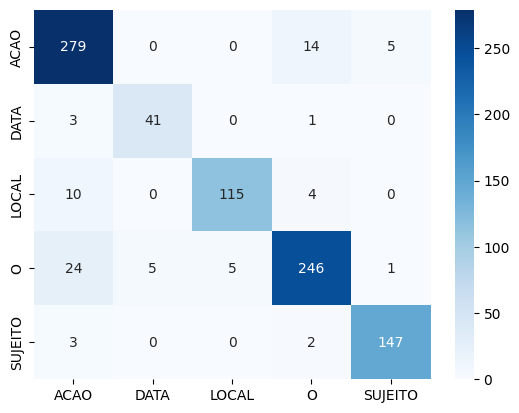

In [ ]:
# Matriz de Confusão por token ou entidades ? AJUSTAR
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true_flat[mask], y_pred_flat[mask])
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=target_names, yticklabels=target_names)
plt.show()


In [ ]:
#  7. Reconhecimento de Entidades Nomeadas
#  7.1 BiLSTM

import numpy as np
import spacy
from spacy.tokens import Doc, Span
from spacy import displacy

# Decodifica as previsões do modelo e texto anotado para o texto original com rótulos.

def decode_predictions(model, X_seq, idx2word, idx2label):

    y_pred_probs = model.predict(X_seq)
    y_pred = np.argmax(y_pred_probs, axis=-1)

    decoded_results = []

    for i in range(len(X_seq)):
        tokens = [idx2word.get(idx, "<UNK>") for idx in X_seq[i] if idx != 0]  # ignora padding
        pred_labels = [idx2label[idx] for idx in y_pred[i][:len(tokens)]]

        decoded_results.append((tokens, pred_labels))

    return decoded_results

#  Visualiza as predições unindo tokens consecutivos com a mesma entidade

def visualize_predictions(decoded_results, num_samples=10):

    # Usar o modelo spaCy vazio (somente para visualização)
    nlp = spacy.blank("pt")

    for i, (tokens, labels) in enumerate(decoded_results[:num_samples]):


        # Reconstruir o texto completo
        text = " ".join(tokens)

        # Criar objetos spaCy Doc
        doc = Doc(nlp.vocab, words=tokens)

        ents = []
        current_ent = []
        current_label = None
        start = None

        for idx, (token, label) in enumerate(zip(tokens, labels)):
            if label != 'O':
                if current_label is None:
                    # Começar nova entidade
                    current_label = label
                    start = idx
                    current_ent = [token]
                elif label == current_label:
                    # Continuar a mesma entidade
                    current_ent.append(token)
                else:
                    # Fechar entidade anterior e começar nova
                    span = Span(doc, start, idx, label=current_label)
                    ents.append(span)
                    current_label = label
                    start = idx
                    current_ent = [token]
            else:
                if current_label is not None:
                    # Fechar a entidade
                    span = Span(doc, start, idx, label=current_label)
                    ents.append(span)
                    current_label = None
                    current_ent = []

        # Caso termine no meio de uma entidade
        if current_label is not None:
            span = Span(doc, start, len(tokens), label=current_label)
            ents.append(span)

        # Atribuir as entidades ao doc
        doc.ents = ents

        # Visualizar com displacy
        displacy.render(doc, style="ent", jupyter=True)

# Primeiro reverter o word2idx para idx2word:
idx2word = {idx: word for word, idx in word2idx.items()}

# Decodificar previsões
decoded_results = decode_predictions(model, X_test, idx2word, idx2label)

# Visualizar Classificação Modelo
print("Classificação Modelo")
visualize_predictions(decoded_results, num_samples=10)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Classificação Modelo


In [ ]:
#  7. Reconhecimento de Entidades Nomeadas
#  7.1 BiLSTM

def decode_predictions_and_compare(model, X_seq, y_seq_true, idx2word, idx2label):
    y_pred_probs = model.predict(X_seq)
    y_pred = np.argmax(y_pred_probs, axis=-1)

    comparisons = []

    for i in range(len(X_seq)):
        tokens = [idx2word.get(idx, "<UNK>") for idx in X_seq[i] if idx != 0]
        pred_labels = [idx2label[idx] for idx in y_pred[i][:len(tokens)]]
        true_labels = [idx2label[idx] for idx in y_seq_true[i][:len(tokens)]]

        comparisons.append((tokens, true_labels, pred_labels))

    return comparisons


def visualize_predictions_comparison(comparisons, num_samples=5):
    for i, (tokens, true_labels, pred_labels) in enumerate(comparisons[:num_samples]):
        print(f"\n📄 Amostra {i+1}:")

        for token, true_label, pred_label in zip(tokens, true_labels, pred_labels):
            marker = "✅" if true_label == pred_label else "❌"
            print(f"{token:<15} | Real: {true_label:<10} | Previsto: {pred_label:<10} {marker}")

        print("-" * 50)

comparisons = decode_predictions_and_compare(model, X_test, y_test, idx2word, idx2label)

print("🔍 Comparação entre etiquetas reais e previstas:")
visualize_predictions_comparison(comparisons, num_samples=10)


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
🔍 Comparação entre etiquetas reais e previstas:

📄 Amostra 1:
Aprova          | Real: ACAO       | Previsto: ACAO       ✅
o               | Real: ACAO       | Previsto: ACAO       ✅
Cronograma      | Real: ACAO       | Previsto: ACAO       ✅
Anual           | Real: ACAO       | Previsto: ACAO       ✅
de              | Real: ACAO       | Previsto: ACAO       ✅
Desembolso      | Real: ACAO       | Previsto: O          ❌
Mensal          | Real: ACAO       | Previsto: O          ❌
da              | Real: O          | Previsto: O          ✅
Justiça         | Real: LOCAL      | Previsto: LOCAL      ✅
do              | Real: LOCAL      | Previsto: LOCAL      ✅
Distrito        | Real: LOCAL      | Previsto: LOCAL      ✅
Federal         | Real: LOCAL      | Previsto: LOCAL      ✅
e               | Real: LOCAL      | Previsto: LOCAL      ✅
dos             | Real: LOCAL      | Previsto: LOCAL      ✅
Territórios     | Real: LOCAL      | Previsto: LOCAL      ✅


In [ ]:
# Aplicação

# IDs usados no treinamento (já anotados)
ids_usados = set(labels_ren_resumo.keys())

# IDs disponíveis no dicionário de portarias
ids_todas_portarias = set(todas_portarias_maio.keys())

# Selecionar apenas os IDs que não foram usados no treinamento
ids_nao_usados = ids_todas_portarias - ids_usados

textos_nao_usados = {id_: todas_portarias_maio[id_]["resumo"] for id_ in ids_nao_usados}

X_infer = []

for id_, texto in textos_nao_usados.items():
    tokens = spacy_tokenize(texto)
    token_ids = [word2idx.get(token, word2idx["<UNK>"]) for token in tokens]

    # Padding para o mesmo tamanho usado no treino
    if len(token_ids) < max_len:
        token_ids += [word2idx["<PAD>"]] * (max_len - len(token_ids))
    else:
        token_ids = token_ids[:max_len]  # Truncar se for maior

    X_infer.append((id_, tokens, token_ids))

resultados_entidades = {}

for id_, tokens, token_ids in X_infer:
    entrada = np.array([token_ids])
    pred = model.predict(entrada)
    pred_labels_ids = np.argmax(pred, axis=-1)[0]  # Remove batch dimension

    entidades = []
    for token, label_id in zip(tokens, pred_labels_ids):
        label = idx2label[label_id]
        if label != "PAD" and label != "O":  # Apenas entidades
            entidades.append((token, label))

    resultados_entidades[id_] = entidades




1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

In [ ]:
# Salvar Dados

from google.colab import drive
import json

# Google Drive
drive.mount('/content/drive', force_remount=False)

# Caminho para salvar dentro do Drive
caminho_arquivo = "/content/drive/My Drive/UnB/EU/TCC/Davi/Dados/resultados_entidades.json"

# Converter os vetores NumPy para listas
vetores_serializaveis = {
    k: v.tolist() if hasattr(v, "tolist") else v
    for k, v in resultados_entidades.items()
}

# Salvar como JSON
with open(caminho_arquivo, "w", encoding="utf-8") as f:
    json.dump(vetores_serializaveis, f, ensure_ascii=False, indent=4)

print(f"Dados salvos com sucesso em: {caminho_arquivo}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dados salvos com sucesso em: /content/drive/My Drive/UnB/EU/TCC/Davi/Dados/resultados_entidades.json


In [ ]:
import spacy
from spacy.tokens import Doc, Span
from spacy import displacy
from spacy.util import filter_spans

# Cria pipeline vazio
nlp = spacy.blank("pt")

# Mapeia cores para os tipos de entidade
colors = {
    "ACAO": "#FF9999",      # rosa claro
    "SUJEITO": "#66CCFF",   # azul claro
    "LOCAL": "#99CC66",     # verde claro
    "DATA": "#CE93D8"      # lilas
}


options = {"ents": list(colors.keys()), "colors": colors}

def visualizar_entidades(portaria_id, todas_portarias_maio, resultados_entidades, labels_ren_resumo):
    if portaria_id not in todas_portarias_maio:
        print(f"Portaria {portaria_id} não encontrada.")
        return

    texto = todas_portarias_maio[portaria_id]["resumo"]
    doc = nlp(texto)
    spans = []

    # Usa labels reais se disponíveis
    if portaria_id in labels_ren_resumo:
        for entidade in labels_ren_resumo[portaria_id]["labels"]:
            trecho = entidade["text"]
            label = entidade["label"]
            start = texto.find(trecho)
            if start != -1:
                end = start + len(trecho)
                span = doc.char_span(start, end, label=label)
                if span:
                    spans.append(span)

    # Usa predições se não houver labels manuais
    elif portaria_id in resultados_entidades:
        entidades_previstas = resultados_entidades[portaria_id]
        spans_temp = []
        for token_text, label in entidades_previstas:
            for token in doc:
                if token.text == token_text:
                    span = Span(doc, token.i, token.i + 1, label=label)
                    spans_temp.append(span)
                    break

        # Agrupamento de spans consecutivos com mesmo rótulo
        if spans_temp:
            agrupados = []
            atual = spans_temp[0]

            for prox in spans_temp[1:]:
                if prox.start == atual.end and prox.label_ == atual.label_:
                    atual = Span(doc, atual.start, prox.end, label=atual.label_)
                else:
                    agrupados.append(atual)
                    atual = prox
            agrupados.append(atual)
            spans = agrupados

    # Remove spans duplicados e sobrepostos
    spans = list({(s.start, s.end, s.label_): s for s in spans}.values())
    spans = filter_spans(spans)

    # Atribui entidades
    doc.ents = spans

    # Visualização com cores
    displacy.render(doc, style="ent", jupyter=True, options=options)



# ✅ Exemplo de uso
visualizar_entidades("1900", todas_portarias_maio, resultados_entidades, labels_ren_resumo) # Anotado Manualmente
visualizar_entidades("1963", todas_portarias_maio, resultados_entidades, labels_ren_resumo) # Previsto por Modelo
visualizar_entidades("1960", todas_portarias_maio, resultados_entidades, labels_ren_resumo) # Curto


In [ ]:
pip install streamlit spacy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 53.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 115.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 5.4 MB/s eta 0:00:00


In [ ]:
!wget -q -O - ipv4.icanhazip.com

34.81.27.224


In [ ]:
! streamlit run app.py & npx localtunnel --port 8501



⠙⠹⠸⠼⠴
  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://34.81.27.224:8501

⠦your url is: https://famous-chicken-crash.loca.lt
2025-05-20 22:31:13.766 Uncaught exception GET /_stcore/stream (127.0.0.1)
HTTPServerRequest(protocol='http', host='famous-chicken-crash.loca.lt', method='GET', uri='/_stcore/stream', version='HTTP/1.1', remote_ip='127.0.0.1')
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/streamlit/web/bootstrap.py", line 347, in run
    if asyncio.get_running_loop().is_running():
       ^^^^^^^^^^^^^^^^^^^^^^^^^^
RuntimeError: no running event loop

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/tornado/websocket.py", line 938, in _accept_connection
    open_result = handler.open(*handler.open_args, **handler.open_kwargs)
             

In [ ]:
# Auxilio processo de anotção de entidades # APAGAR

def obter_resumos(portarias, todas_portarias_maio):

    resumos = {}

    for portaria in portarias:
        portaria_str = str(portaria)  # Garante que a chave seja string
        if portaria_str in todas_portarias_maio:
            resumos[portaria_str] = todas_portarias_maio[portaria_str]['resumo']
        else:
            resumos[portaria_str] = None  # Caso não exista no dicionário

    return resumos

# Exemplo de uso:

portarias_exemplo = [

'695', '551', '816', '258', '812', '1232', '1032','51','669', '412', '992', '113', '368', '1007', '23', '495', '526', '236', '428', '660', '988', '74', '388', '408', '1158', '1783', '147', '284', '1302'
]

resumos_encontrados = obter_resumos(portarias_exemplo, todas_portarias_maio)

for portaria, resumo in resumos_encontrados.items():
    print(f"Portaria {portaria}: {resumo}")



